<a href="https://colab.research.google.com/github/marawangamal/action-recognition-annotation-tool/blob/main/rl_tensor_networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install networkx matplotlib
!pip3 install tensornetwork
!pip3 install tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.3/364.3 kB 3.8 MB/s eta 0:00:00


In [20]:
import random

# 0 Introduction

## 0.1 Tensor Networks Background


Tensor networks are graphs that describe the underlying structure of a tensor. While unstructured tensors require a large number of parameters to be represented, tensors defined through a tensor network can be represented in a memory efficient manner. In tensor networks, nodes represent tensors and edges represent contractions.

Below are examples of simple tensor networks that represent familiar objects such a a vector, matrix and the result of a matrix-vector product

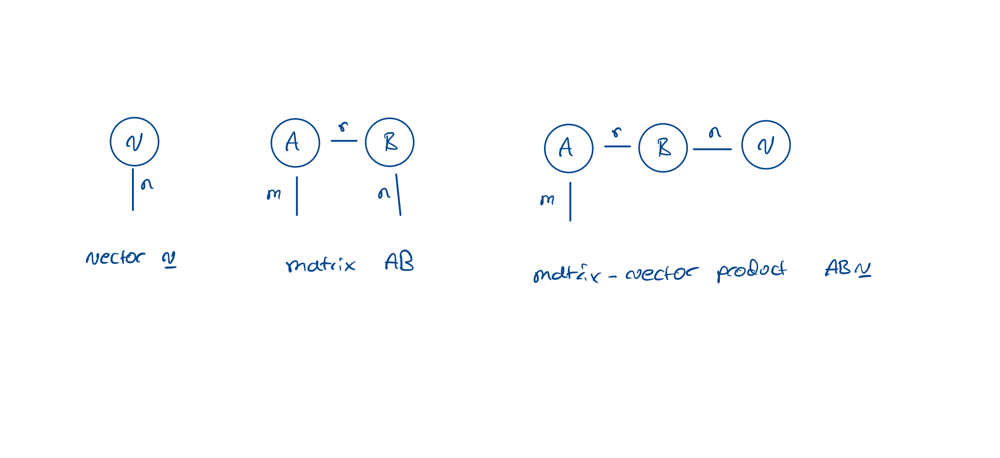


## 0.2 Tensor Network Structure Learning problem

In order to factorize a tensor $T \in \mathbb{R}^{d_1 \times d_2 \times \cdots \times d_n}$ there are many valid tensor network structures. The number of pottential structures grows exponentially in the number of dimensions. We denote the set of tensors conforming to a certain tensor network structure with $TN(G, r)$ where $G=(V, E)$ specifies a graphical structure and $r \in \mathbb{Z}^{|E|}$ is a vector denoting the \emph{rank} values of the network. In other words, $T \in TN(G, r)$ if there exists $V$ tensors that represent $T$ exactly when they are interconnected in a tensor network according to $G \text{ and } r$. Finding an optimal tensor factorization amounts to solving the following optimization problem:

\begin{align}
    & \underset{
    \substack{(G, \, r) \, \in \, ValidTNs(T)
    \\
    X \, \in \, TN(G, \,r)
    }}{\textbf{min}} \;
    \Big \| T - X \Big \|_\text{F} \\
    & \textbf{subject to} \quad Size(TN(G, \, r)) \leq N_{\text{max}}
\end{align}

where $\| \cdot \|_\text{F}$ is the Frobenius norm between tensors, $ValidTNs$ represents the set of tensor network graphs that are valid for tensor $T$ (i.e. tensor networks with the same number of dimensions as $T$) and $N_{\text{max}}$ denotes a constraint on the maximum number of tensor network parameters.

## 0.3 Reinfocement Learning of TN formalization

In this section we describe how RL can be used to search for optimal TN structures.

Given a target tensor $T \in \mathbb{R}^{d_1 \times \cdots \times d_n}$, we define the state space, action space and reward function as follows:

- **State space ($S$):** Tensor network graphs that are valid $ValidTNs(T)$

- **Action space ($A(S)$) :** The action space consists of two action types, adding a node and incrementing the dimenison of an edge connection between any two nodes in the graph ['addNode', 'increment:NodeIdxA:NodeIdxB']. Thus the action space differs at different states. (E.g. you can only increment the edge between node 10 and 11 if you are in a state with atleast 11 nodes)

- **Reward ($R$)**

  Each state in $S$ is a TN structure $(G, \,r)$. We define the reward as

  \begin{align}
      R(G, r) = - & \underset{
    X \, \in \, TN(G, \,r)
    }{\textbf{min}} \;
    \Big \| T - X \Big \|_\text{F} + \lambda1_{Size(X)>Size(T)}.
  \end{align}

  As this is a non-convex optimization problem, we use SGD to approximate its solution. Specifically, we randomly initialize core tensors with dimensions specified by $(G, \, r)$, and the tensor $X$ is realized by performing the contraction between the cores. The loss function is then optimized by updating the core tensors directly. This ensures that we are exploring solutions $X$ that are valid (i.e within the support set $TN(G, \,r)$).

# 1 Enivronment

## 1.1 NCON

In [2]:
"""
A module for the ncon function to contract multiple tensors.
References:
    - https://github.com/mhauru/ncon/blob/master/src/ncon/ncon.py
"""

from collections.abc import Iterable
from tqdm import tqdm
import torch


def ncon(tensor_list, edge_list, order=None, forder=None, check_indices=True):
    """
    Args:
        tensor_list:    list of tensors to be contracted
        edge_list:      list of lists of indices e.g. edge_list[0] = [3, 4, -1]
                        labels the three indices of tensor tensor_list[0],
                        with -1 indicating an uncontracted index (open leg)
                        and 3 and 4 being the contracted indices.
        order:          list of contraction order (default [1, 2, 3, 4, ...])
        forder:         list of final ordering (default [-1, -2, ...])
        check_indices:  sanity  check the inputs (default True)

    Returns:
        A: contracted tensor
    """

    # We want to handle the tensors as a list, regardless of what kind
    # of iterable we are given. Inputs are assumed to be non-empty.
    tensor_list = list(tensor_list)
    edge_list = list(edge_list)
    if not isinstance(edge_list[0], Iterable):
        # edge_list is not a list of lists, so make it such.
        edge_list = [edge_list]
    else:
        edge_list = list(map(list, edge_list))

    if order is None:
        order = create_order(edge_list)
    if forder is None:
        forder = create_forder(edge_list)

    if check_indices:
        # Raise a RuntimeError if the indices are wrong.
        do_check_indices(tensor_list, edge_list, order, forder)

    # If the graph is disconnected, connect it with trivial indices that
    # will be contracted at the very end.
    connect_graph(tensor_list, edge_list, order)

    while len(order) > 0:
        tcon = get_tcon(edge_list, order[0])  # tcon = tensors to be contracted
        # Find the indices icon that are to be contracted.
        if len(tcon) == 1:
            tracing = True
            icon = [order[0]]
        else:
            tracing = False
            icon = get_icon(edge_list, tcon)
        # Position in tcon[0] and tcon[1] of indices to be contracted.
        # In the case of trace, pos2 = []
        pos1, pos2 = get_pos(edge_list, tcon, icon)
        if tracing:
            # Trace on a tensor
            new_A = trace(tensor_list[tcon[0]], axis1=pos1[0], axis2=pos1[1])
        else:
            # Contraction of 2 tensors
            new_A = con(tensor_list[tcon[0]], tensor_list[tcon[1]], (pos1, pos2))
        tensor_list.append(new_A)
        edge_list.append(find_newv(edge_list, tcon, icon))  # Add the edge_list for the new tensor
        for i in sorted(tcon, reverse=True):
            # Delete the contracted tensors and indices from the lists.
            # tcon is reverse sorted so that tensors are removed starting from
            # the end of tensor_list, otherwise the order would get messed.
            del tensor_list[i]
            del edge_list[i]
        order = renew_order(order, icon)  # Update order

    vlast = edge_list[0]
    A = tensor_list[0]
    A = permute_final(A, vlast, forder)
    return A


# # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # # #


def create_order(edge_list):
    """Identify all unique, positive indices and return them sorted."""
    flat_v = sum(edge_list, [])
    x = [i for i in flat_v if i > 0]
    # Converting to a set and back removes duplicates
    x = list(set(x))
    return sorted(x)


def create_forder(edge_list):
    """Identify all unique, negative indices and return them reverse sorted
    (-1 first).
    """
    flat_v = sum(edge_list, [])
    x = [i for i in flat_v if i < 0]
    # Converting to a set and back removes duplicates
    x = list(set(x))
    return sorted(x, reverse=True)


def connect_graph(tensor_list, edge_list, order):
    """Connect the graph of tensors to be contracted by trivial
    indices, if necessary. Add these trivial indices to the end of the
    contraction order.

    tensor_list, edge_list and order are modified in place.
    """
    # Build ccomponents, a list of the connected components of the graph,
    # where each component is represented by a a set of indices.
    unvisited = set(range(len(tensor_list)))
    visited = set()
    ccomponents = []
    while unvisited:
        component = set()
        next_visit = unvisited.pop()
        to_visit = {next_visit}
        while to_visit:
            i = to_visit.pop()
            unvisited.discard(i)
            component.add(i)
            visited.add(i)
            # Get the indices of tensors neighbouring tensor_list[i].
            i_inds = set(edge_list[i])
            neighs = (
                j for j, j_inds in enumerate(edge_list) if i_inds.intersection(j_inds)
            )
            for neigh in neighs:
                if neigh not in visited:
                    to_visit.add(neigh)
        ccomponents.append(component)
    # If there is more than one connected component, take one of them, a
    # take an arbitrary tensor (called c) out of it, and connect that
    # tensor with an arbitrary tensor (called d) from all the other
    # components using a trivial index.
    c = ccomponents.pop().pop()
    while ccomponents:
        d = ccomponents.pop().pop()
        A_c = tensor_list[c]
        A_d = tensor_list[d]
        c_axis = len(edge_list[c])
        d_axis = len(edge_list[d])
        tensor_list[c] = torch.unsqueeze(A_c, c_axis)
        tensor_list[d] = torch.unsqueeze(A_d, d_axis)
        try:
            dim_num = max(order) + 1
        except ValueError:
            dim_num = 1
        edge_list[c].append(dim_num)
        edge_list[d].append(dim_num)
        order.append(dim_num)
    return None


def get_tcon(edge_list, index):
    """Gets the list indices in tensor_list of the tensors that have index as their
    leg.
    """
    tcon = []
    for i, inds in enumerate(edge_list):
        if index in inds:
            tcon.append(i)
    l = len(tcon)
    # If check_indices is called and it does its work properly then these
    # checks should in fact be unnecessary.
    if l > 2:
        raise ValueError(
            "In ncon.get_tcon, more than two tensors share a contraction "
            "index."
        )
    elif l < 1:
        raise ValueError(
            "In ncon.get_tcon, less than one tensor share a contraction index."
        )
    elif l == 1:
        # The contraction is a trace.
        how_many = edge_list[tcon[0]].count(index)
        if how_many != 2:
            # Only one tensor has this index but it is not a trace because it
            # does not occur twice for that tensor.
            raise ValueError(
                "In ncon.get_tcon, a trace index is listed != 2 times for the "
                "same tensor."
            )
    return tcon


def get_icon(edge_list, tcon):
    """Returns a list of indices that are to be contracted when contractions
    between the two tensors numbered in tcon are contracted.
    """
    inds1 = edge_list[tcon[0]]
    inds2 = edge_list[tcon[1]]
    icon = set(inds1).intersection(inds2)
    icon = list(icon)
    return icon


def get_pos(edge_list, tcon, icon):
    """Get the positions of the indices icon in the list of legs the tensors
    tcon to be contracted.
    """
    pos1 = [[i for i, x in enumerate(edge_list[tcon[0]]) if x == e] for e in icon]
    pos1 = sum(pos1, [])
    if len(tcon) < 2:
        pos2 = []
    else:
        pos2 = [[i for i, x in enumerate(edge_list[tcon[1]]) if x == e] for e in icon]
        pos2 = sum(pos2, [])
    return pos1, pos2


def find_newv(edge_list, tcon, icon):
    """Find the list of indices for the new tensor after contraction of
    indices icon of the tensors tcon.
    """
    if len(tcon) == 2:
        newv = edge_list[tcon[0]] + edge_list[tcon[1]]
    else:
        newv = edge_list[tcon[0]]
    newv = [i for i in newv if i not in icon]
    return newv


def renew_order(order, icon):
    """Returns the new order with the contracted indices removed from it."""
    return [i for i in order if i not in icon]


def permute_final(A, edge_list, forder):
    """Returns the final tensor A with its legs permuted to the order given
    in forder.
    """
    perm = [edge_list.index(i) for i in forder]
    permuted = A.permute(tuple(perm))

    return permuted


def do_check_indices(tensor_list, edge_list, order, forder):
    """Check that
    1) the number of tensors in tensor_list matches the number of index lists in edge_list.
    2) every tensor is given the right number of indices.
    3) every contracted index is featured exactly twice and every free index
       exactly once.
    4) the dimensions of the two ends of each contracted index match.
    """

    # 1)
    if len(tensor_list) != len(edge_list):
        raise ValueError(
            (
                "In ncon.do_check_indices, the number of tensors %i"
                " does not match the number of index lists %i"
            )
            % (len(tensor_list), len(edge_list))
        )

    # 2)
    # Create a list of lists with the shapes of each A in tensor_list.
    shapes = list(map(lambda A: list(A.shape), tensor_list))
    for i, inds in enumerate(edge_list):
        if len(inds) != len(shapes[i]):
            raise ValueError(
                (
                    "In ncon.do_check_indices, len(edge_list[%i])=%i does not match "
                    "the numbers of indices of tensor_list[%i] = %i"
                )
                % (i, len(inds), i, len(shapes[i]))
            )

    # 3) and 4)
    # v_pairs = [[(0,0), (0,1), (0,2), ...], [(1,0), (1,1), (1,2), ...], ...]
    v_pairs = [[(i, j) for j in range(len(s))] for i, s in enumerate(edge_list)]
    v_pairs = sum(v_pairs, [])
    v_sum = sum(edge_list, [])
    # For t, o in zip(v_pairs, v_sum) t is the tuple of the number of
    # the tensor and the index and o is the contraction order of that
    # index. We group these tuples by the contraction order.
    order_groups = [
        [t for t, o in zip(v_pairs, v_sum) if o == e] for e in order
    ]
    forder_groups = [[1 for fo in v_sum if fo == e] for e in forder]
    for i, o in enumerate(order_groups):
        if len(o) != 2:
            raise ValueError(
                (
                    "In ncon.do_check_indices, the contracted index %i is not "
                    "featured exactly twice in edge_list."
                )
                % order[i]
            )
        else:
            A0, ind0 = o[0]
            A1, ind1 = o[1]
            try:
                compatible = tensor_list[A0].compatible_indices(tensor_list[A1], ind0, ind1)
            except AttributeError:
                compatible = tensor_list[A0].shape[ind0] == tensor_list[A1].shape[ind1]
            if not compatible:
                raise ValueError(
                    "In ncon.do_check_indices, for the contraction index %i, "
                    "the leg %i of tensor number %i and the leg %i of tensor "
                    "number %i are not compatible."
                    % (order[i], ind0, A0, ind1, A1)
                )
    for i, fo in enumerate(forder_groups):
        if len(fo) != 1:
            raise ValueError(
                (
                    "In ncon.do_check_indices, the free index %i is not "
                    "featured exactly once in edge_list."
                )
                % forder[i]
            )

    # All is well if we made it here.
    return True


######################################################################
# The following are simple wrappers around pytorch Tensor functions, #
# but may be replaced with fancier stuff later.                      #
######################################################################


def con(A, B, inds):
    return torch.tensordot(A, B, inds)


def trace(tensor, axis1=0, axis2=1):
    """Return summed entries along diagonals.
    If tensor is 2-D, the sum is over the
    diagonal of tensor with the given offset,
    i.e., the collection of elements of the form a[i, i+offset].
    If a has more than two dimensions, then the axes specified by
    axis1 and axis2 are used to determine the 2-D sub-array whose diagonal is
    summed.
    Args:
      tensor: A tensor.
      axis1, axis2: Axis to be used as the first/second axis of the 2D
                    sub-arrays from which the diagonals should be taken.
                    Defaults to second-last/last axis.
    Returns:
      array_of_diagonals: The batched summed diagonals.
    """
    return torch.sum(torch.diagonal(tensor, dim1=axis1, dim2=axis2), dim=-1)

## 1.2 Environment

In [3]:
import copy
import numpy as np
from typing import List
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import torch
import tensornetwork as tn
tn.set_default_backend("pytorch") # tensorflow, jax, numpy, symmetric


class Environment:
  def __init__(
      self,
      target_tensor: np.array,
      compression_constraint: float = 1.0,
      gt_graph: np.array = None,
      gt_free_dimensions: np.array = None,
      max_num_nodes: int = 8,
      max_rank: int = 8,
      min_rank: int = 0,
      max_episode_length: int = 100,
      seed=4,
      verbose = False,
      reward_breakdown = False,
      ) -> None:
    """
      Args:
        target_tensor (np.array): Tensor to factorize
        compression_constraint (float): Compression ratio above which a penalty is applied (lower value means more compression)
        gt_graph (Optional[np.array]): Ground truth for plotting
        gt_free_dimensions (Optional[List]): Ground truth for plotting - Hanging legs (e.g. free_dimensions[i] is the free dimension of node[i])
        max_num_nodes (int): Maximum number of nodes in tensor network
        max_rank (int): Maximim rank dimension (to limit state-action space)
        min_rank (int): Minimum rank dimension (to limit state-action space)
        max_episode_length (int): Max time steps
        reward_breakdown (boolean): Whether to return a detailed breakdown of the reward
    """
    # Assert types and value constraints

    assert isinstance(max_num_nodes, int), "max_num_nodes must be an integer"
    assert isinstance(max_rank, int), "max_rank must be an integer"
    assert isinstance(min_rank, int), "min_rank must be an integer"
    assert max_rank >= min_rank, "max_rank must be greater than or equal to min_rank"
    assert max_num_nodes > 0, "max_num_nodes must be greater than 0"
    n_free_legs = len(target_tensor.shape)
    assert n_free_legs >= 2, "Target tensor must be atleast 2d"


    # self.initial_graph = np.eye(n_free_legs, n_free_legs, 1) + np.eye(n_free_legs, n_free_legs, -1)
    self.initial_graph = np.zeros((n_free_legs, n_free_legs))
    self.free_dimensions = np.array([int(d) for d in target_tensor.shape])

    self.target_tensor = target_tensor
    self.compression_constraint = compression_constraint
    self.state = copy.deepcopy(self.initial_graph)
    self.max_num_nodes = max_num_nodes
    self.max_rank = max_rank
    self.min_rank = min_rank
    self.num_steps = 0
    self.max_episode_length = max_episode_length
    self.verbose = verbose
    self.reward_breakdown = reward_breakdown

    self.gt_graph = gt_graph
    self.gt_free_dimensions = gt_free_dimensions

    self.best_reward = - float('inf')
    self.best_compression = -1
    self.current_reward = - float('inf')
    self.current_compression = -1
    self.best_state = copy.deepcopy(self.initial_graph)
    self.reward_cache = dict()


  def seed(self, seed=None):
    self.np_random, seed = seeding.np_random(seed)
    return [seed]

  def reset(self):
    self.state = copy.deepcopy(self.initial_graph)
    self.num_steps = 0
    return self.state

  @staticmethod
  def tn_to_nxgraph(adj_mat, fixed_node_ids):

    G = nx.from_numpy_array(adj_mat)

    for node_id in fixed_node_ids:
        invisible_node_id = f"invisible_{node_id}"
        G.add_node(invisible_node_id, visible=False)
        G.add_edge(node_id, invisible_node_id)

    pos = nx.circular_layout(G)
    node_colors = []
    node_sizes=[]
    for node in G.nodes():
      if 'invisible' in str(node):
        node_colors.append('none')
        node_sizes.append(10)
      elif node in fixed_node_ids:
        node_colors.append('red')
        node_sizes.append(500)
      else:
        node_colors.append('lightblue')
        node_sizes.append(500)
    # node_colors = ['red' if node in fixed_node_ids else 'lightblue' for node in G.nodes() if 'invisible' not in str(node)]
    edge_colors = 'gray'
    node_labels = {n: n for n in G.nodes() if 'invisible' not in str(n)}
    edge_labels = {(i, j): int(adj_mat[i, j]) for i, j in G.edges if 'invisible' not in str(i) + str(j)}

    # Define a fixed, short distance for 'invisible' nodes to be above their corresponding nodes
    short_distance = 0.2  # Adjust this value as needed

    # Adjust positions for invisible nodes
    for node_id in fixed_node_ids:
        invisible_node_id = f"invisible_{node_id}"
        if invisible_node_id in pos:
            visible_node_pos = pos[node_id]
            # Set the 'invisible' node position slightly above the visible node
            pos[invisible_node_id] = (visible_node_pos[0], visible_node_pos[1] + short_distance)

    return G, pos, node_colors, edge_colors, node_labels, edge_labels, node_sizes


  def plot_adjacency_matrix(self):
      # Prepare the subplot
      plt.figure(figsize=(9, 3))  # Adjusted for two subplots (if GT graph is not present)
      if self.gt_graph is not None and self.gt_free_dimensions is not None:
          n_plots = 3
      else:
          # plt.figure(figsize=(9, 3))  # Adjusted for two subplots (if GT graph is not present)
          n_plots = 2

      # Plot the state graph
      plt.subplot(1, n_plots, 1)
      fixed_node_ids = [i for i in range(len(self.free_dimensions))]
      G, pos, node_colors, edge_colors, node_labels, edge_labels, node_sizes = self.tn_to_nxgraph(self.state, fixed_node_ids)
      nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
      nx.draw_networkx_edges(G, pos, edge_color=edge_colors)
      nx.draw_networkx_labels(G, pos, labels=node_labels)
      nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
      plt.title(f"Curr R={self.current_reward:.2f}, CR={self.current_compression:.2f}")

      plt.subplot(1, n_plots, 2)
      best_state_fixed_node_ids = [i for i in range(len(self.best_state))]
      G, pos, node_colors, edge_colors, best_state_labels, edge_labels, node_sizes = self.tn_to_nxgraph(self.best_state, fixed_node_ids)
      nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
      nx.draw_networkx_edges(G, pos, edge_color=edge_colors)
      nx.draw_networkx_labels(G, pos, labels=best_state_labels)
      nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
      plt.title(f"Best R={self.best_reward:.2f} CR={self.best_compression:.2f}")

      # Plot the GT graph if it exists
      if self.gt_graph is not None and self.gt_free_dimensions is not None:
          plt.subplot(1, 3, 3)
          gt_fixed_node_ids = [i for i in range(len(self.gt_free_dimensions))]
          G, pos, node_colors, edge_colors, visible_labels, edge_labels, node_sizes = self.tn_to_nxgraph(self.gt_graph, gt_fixed_node_ids)
          nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
          nx.draw_networkx_edges(G, pos, edge_color=edge_colors)
          nx.draw_networkx_labels(G, pos, labels=visible_labels)
          nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
          plt.title("GT Graph")

      plt.show()



  @staticmethod
  def add_empty_row_and_column(arr: np.array) -> np.array:
    n_rows, n_cols = arr.shape
    new_arr = np.zeros((n_rows + 1, n_cols + 1))
    new_arr[:n_rows, :n_cols] = arr
    return new_arr

  @staticmethod
  def remove_row_and_column(arr: np.array, index: int) -> np.array:
      assert arr.shape[0] == arr.shape[1], "State array must be a square matrix"
      assert index < arr.shape[0], "Node index out of range"
      new_arr = np.delete(arr, index, axis=0)
      new_arr = np.delete(new_arr, index, axis=1)
      return new_arr

  def remove_unconnected_nodes(self, tensor_network_adj_matrix):
    """Remove unconnected nodes"""
    for i in range(len(tensor_network_adj_matrix)):
      if np.sum(tensor_network_adj_matrix[i]) == 0 and np.sum(tensor_network_adj_matrix[:, i]) == 0:
        return self.remove_unconnected_nodes(self.remove_row_and_column(tensor_network_adj_matrix, i))
    return tensor_network_adj_matrix

  def min_loss(
      self,
      tensor_network_adj_matrix,
      target_tensor,
      # n_iterations=1000,
      max_iters = 1e6,
      learning_rate=1e-3,
      eps = 1e-5,
      ):
    """Optimizes randomly initialized tensor network w.r.t `target_tensor`"""
    tensors = []

    # Remove unconnected nodes (except fixed ones)
    tensor_network_adj_matrix = copy.deepcopy(tensor_network_adj_matrix)
    rows, cols = tensor_network_adj_matrix.shape
    n_fixed = len(self.free_dimensions)
    if rows >= n_fixed and cols >= n_fixed:
      identity_matrix = np.eye(n_fixed)
      tensor_network_adj_matrix[:n_fixed, :n_fixed] += identity_matrix

    tensor_network_adj_matrix = self.remove_unconnected_nodes(tensor_network_adj_matrix)

    if rows >= n_fixed and cols >= n_fixed:
      identity_matrix = np.eye(n_fixed)
      tensor_network_adj_matrix[:n_fixed, :n_fixed] -= identity_matrix
    tensor_network_adj_matrix = tensor_network_adj_matrix.astype(int)

    # Generate random tensors (free leg is last dimension)
    for i in range(len(tensor_network_adj_matrix)):
      dims = tensor_network_adj_matrix[i][tensor_network_adj_matrix[i] > 0]
      if i < len(self.free_dimensions):
        dims = np.append(dims, np.array([self.free_dimensions[i]]))
      tensors.append(torch.randn(*dims, requires_grad=True))

    # Specify contraction for ncon engine
    ncon_v = self.adjacency_matrix_to_ncon_format(tensors, tensor_network_adj_matrix)

    # Optimize loss
    min_loss_observed = float('inf')
    optimizer = torch.optim.AdamW(tensors, lr=learning_rate)
    target_tensor = torch.tensor(target_tensor)
    delta = float('inf')
    prev_loss = float('inf')

    step_idx = 0
    while delta > eps:
      optimizer.zero_grad()
      contracted_tensor_network = ncon(tensors, ncon_v)
      loss = torch.mean((contracted_tensor_network - target_tensor) ** 2)
      loss.backward()
      optimizer.step()

      delta = np.abs(loss.item() - prev_loss)
      prev_loss = loss.item()

      if min_loss_observed > loss.item():
        min_loss_observed = loss.item()

      if step_idx % 2000 == 0 and self.verbose:
        # Calculate compression ratio
        n_params_original = torch.tensor([i for i in self.target_tensor.shape]).prod()
        n_params_tn = sum([tens.numel() for tens in tensors])
        compression_loss = n_params_tn / n_params_original
        print(f"[{step_idx}] Loss (reconst.): {loss.item()} | Best Loss: {min_loss_observed} | delta: {delta}")

      if step_idx >= max_iters:
        print(f"[Reward Calculation Timed Out][{t}] Loss (reconst.): {loss.item()} | Best Loss: {min_loss_observed}")
        break
      step_idx += 1

    # Calculate compression ratio
    n_params_original = torch.tensor([i for i in self.target_tensor.shape]).prod()
    n_params_tn = sum([tens.numel() for tens in tensors])

    compression_ratio = n_params_tn / n_params_original
    compression_loss = 1e5 if compression_ratio > self.compression_constraint else 0

    return min_loss_observed, compression_loss, compression_ratio


  @staticmethod
  def adjacency_matrix_to_ncon_format(tensors, adj_mat):
      """Convert an adjacency matrix to ncon format.

      Args:
          tensors (List): Contains np tensors to be contracted
          adj_mat (np.array): Binary 2D array describing which tensors are connected

      Returns:
          ncon_v (List[List]): List of lists as in ncon
      """
      num_tensors = len(tensors)
      ncon_v = [[] for _ in range(num_tensors)]

      # Label for contracted indices (start from 1)
      label = 1

      # Iterate over upper triangle of adj_mat to avoid duplicate pairs
      for i in range(num_tensors):
          for j in range(i + 1, num_tensors):
              if adj_mat[i, j] >= 1:
                  # If tensors are connected, assign the same positive label
                  ncon_v[i].append(label)
                  ncon_v[j].append(label)
                  label += 1

      # Assign negative labels for free indices
      for i in range(num_tensors):
          # Number of indices in tensor i
          num_indices = tensors[i].ndim

          # If tensor i has more indices than labels, it has free indices
          while len(ncon_v[i]) < num_indices:
              ncon_v[i].append(-label)
              label += 1

      return ncon_v

  def step_action(self, action: str) -> np.array:
    """ Perform an action in the environment.
      Args:
        action (str): One of ['addNode', 'removeNode:index', 'increment:index1:index2', 'decrement:index1:index2']
      Returns:
        state: (np.array) Adjacency matrix describing tensor network graph
    """
    self.num_steps += 1
    action_type = action.split(":")[0]
    if action_type in ['addNode']: #
       self.state = self.add_empty_row_and_column(self.state)

    elif action_type in ['removeNode']: # unary
      action_node = int(action.split(":")[1])
      if not (action_node < len(self.initial_graph)):
        self.state = self.remove_row_and_column(self.state, action_node)
      elif self.verbose:
        print(f"Invlaid action {action}. Cannot remove node with free leg.")

    elif action_type in ['increment', 'decrement']:
      action_node_a = int(action.split(":")[1])
      action_node_b = int(action.split(":")[2])

      if action_type == 'increment':
        delta = 2 if self.state[action_node_a, action_node_b] == 0 else 1
        sgn = 1
      else:
        sgn = -1
        delta = 2 if self.state[action_node_a, action_node_b] == 2 else 1

      self.state[action_node_a, action_node_b] += int(sgn * delta)
      self.state[action_node_b, action_node_a] += int(sgn * delta)  # keep symmetry

    if str(self.state) in self.reward_cache:
      min_loss, compression, compression_ratio = self.reward_cache[str(self.state)]
    else:
      min_loss, compression, compression_ratio = self.min_loss(self.state, self.target_tensor)
      self.reward_cache[str(self.state)] = min_loss, compression, compression_ratio

    reward = - (min_loss + compression)
    truncted = self.num_steps >= self.max_episode_length or reward <= -1e4
    done = truncted  # same as truncate for now. Could be set to true if |loss| < epsilon

    self.current_reward = copy.deepcopy(reward)
    self.current_compression = copy.deepcopy(compression_ratio)

    # Save best state
    if reward > self.best_reward:
      self.best_state = copy.deepcopy(self.state.astype(int))
      self.best_reward = copy.deepcopy(reward)
      self.best_compression = copy.deepcopy(compression_ratio)

    if self.reward_breakdown:
      return self.state.astype(int), reward, done, truncted, (min_loss, compression)
    else:
      return self.state.astype(int), reward, done, truncted

  def get_feasible_actions(self, state = None) -> List:

    state = self.state if state is None else state
    actions_list = []
    num_edges = np.sum(state[len(self.free_dimensions):], axis=1)
    unconnected_node_exists = np.any(num_edges == 0)

    if state.shape[0] < self.max_num_nodes and not unconnected_node_exists:
      actions_list.append('addNode')

    # if state.shape[0] > len(self.free_dimensions):
    #   actions_list.extend([f'deleteNode:{i}' for i in range(len(self.free_dimensions), len(state))])

    for i in range(state.shape[0]):
      for j in range(i + 1, state.shape[1]):
        if state[i][j] < self.max_rank:
          actions_list.append(f'increment:{i}:{j}')

        # if (state[i][j] == 2 and not unconnected_node_exists) or state[i][j] > 2:
        #   actions_list.append(f'decrement:{i}:{j}')

    return actions_list

## 1.3 Test Environment

In [4]:
# Test Environment
import unittest
class TestEnvironment(unittest.TestCase):

    def setUp(self):
        self.tensor = np.random.randn(4,4)
        self.initial_graph = np.array([[0, 0], [0, 0]], dtype=int)
        self.env = Environment(self.tensor, verbose=True)

    def test_add_empty_row_and_column(self):
        result = self.env.add_empty_row_and_column(self.initial_graph)
        expected = np.array([[0, 0, 0], [0, 0, 0], [0, 0, 0]])
        np.testing.assert_array_equal(result, expected)

    def test_remove_row_and_column(self):
        result = self.env.remove_row_and_column(self.initial_graph, 0)
        expected = np.array([[0]])
        np.testing.assert_array_equal(result, expected)

    def test_step_action_addNode(self):
        result, reward, done, truncted = self.env.step_action('addNode')
        expected = np.array([[0, 0, 0], [0, 0, 0], [0, 0, 0]])
        np.testing.assert_array_equal(result, expected)

    def test_unconnected_fixed_nodes_remain(self):
        actions = self.env.get_feasible_actions()
        assert 'decrement:0:1' not in actions, "Expected decrement:0:1 to not be in feasible set"


    def test_step_action_increment(self):
        self.env.step_action('addNode')
        result, reward, done, truncted = self.env.step_action('increment:0:2')
        expected = np.array([[0, 0, 2], [0, 0, 0], [2, 0, 0]])
        np.testing.assert_array_equal(result, expected)

    def test_step_action_decrement(self):
        self.env.step_action('addNode')
        self.env.step_action('increment:0:2')
        result, reward, done, truncted = self.env.step_action('decrement:0:2')
        expected = np.array([[0, 0, 0], [0, 0, 0], [0, 0, 0]])
        np.testing.assert_array_equal(result, expected)

    def test_get_feasible_actions(self):
        self.env.step_action('addNode')
        result = self.env.get_feasible_actions()
        expected = ['deleteNode:2', 'increment:0:1', 'increment:0:2', 'increment:1:2']
        self.assertEqual(set(result), set(expected))
suite = unittest.TestLoader().loadTestsFromTestCase(TestEnvironment)
unittest.TextTestRunner().run(suite)

.

[0] Loss (reconst.): 3.6176039323091644 | Best Loss: 3.6176039323091644 | delta: inf
[2000] Loss (reconst.): 0.4110519383445692 | Best Loss: 0.4110519383445692 | delta: 0.0001969690364306831


F.

[4000] Loss (reconst.): 0.24901895165084323 | Best Loss: 0.24901895165084323 | delta: 1.0235994356566636e-05
[0] Loss (reconst.): 1.0325330807907767 | Best Loss: 1.0325330807907767 | delta: inf
[2000] Loss (reconst.): 0.10313473918033236 | Best Loss: 0.10313473918033236 | delta: 3.154415398033683e-05


.

[0] Loss (reconst.): 1.2759989113912238 | Best Loss: 1.2759989113912238 | delta: inf
[2000] Loss (reconst.): 0.36225848825169515 | Best Loss: 0.36225848825169515 | delta: 0.00011967728960715629
[0] Loss (reconst.): 1.2201593006543239 | Best Loss: 1.2201593006543239 | delta: inf


KeyboardInterrupt: ignored

## 1.1 Environment Visualization

### 1.1.1 Initial state visualization

First let's visualize the environment's initial state. As shown below the initial state is always a rank-1 tensor of valid dimension. (i.e. the correct number of free legs and no interconnections between nodes)

Moreover, the environment also keeps track of the state visited that resulted in the best immediate reward. Note that because this is a search problem, we are more interested in the immediate rewards as opposed to the return.

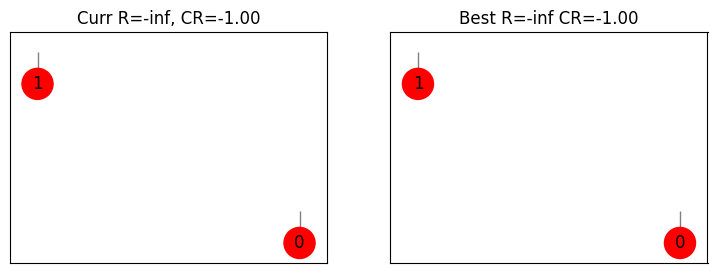

[[0. 0.]
 [0. 0.]]


In [5]:
# Example inital
target_tensor = np.random.randn(4,4)
env = Environment(target_tensor, reward_breakdown=True)
env.plot_adjacency_matrix()
print(env.state)

### 1.1.2 Ground truth visualization

We can optionally pass in the ground truth Tensor Network, so that it is visualized by the environment for us.

In [ ]:
# Example usage (with ground truth visualization)
target_tensor = np.random.randn(4,4, 4, 4)
gt_graph = np.zeros((4, 4))
gt_free_dimensions = np.array([4,4,4,4])
env = Environment(target_tensor, reward_breakdown=True, gt_graph=gt_graph, gt_free_dimensions=gt_free_dimensions)
env.plot_adjacency_matrix()

### 1.1.3 Random trajectory visualization

Now let's perform a random trajectory of 20 time steps to visualize the different states (or tensor network graphs) visited.

Note the graph plotted at the end. As expected the reward should only increase over time. Why is that? Because each step only adds more flexibility to the tensor network (i.e. we can only add a node or increase the rank of an edge). Thus we expect the reconstruction loss to decrease monotonically (this is only roughly speaking as the loss is never computed exactly and only approximated with Stochastic Gradient Descent (SGD))

In [ ]:
# Example usage
import random
env.reset()

print("Initial state:")
env.plot_adjacency_matrix()
rewards = []
rewards_ep_i = []

n_steps = 100
print("Random agent")
for t in range(n_steps):
  print(f"State: \n{env.state}\n")
  actions = env.get_feasible_actions()
  random_action = random.choice(actions)  # Select a random action from the feasible actions
  state, reward, done, truncted, reward_breakdown = env.step_action(random_action)
  rewards_ep_i.append(reward)
  print(f"{'[Terminated] ' if done else ''} [{t}/{n_steps}] Action: {random_action} | Reward: {reward:.2f} (loss: {reward_breakdown[0]:.2f} cr: {reward_breakdown[1]:.2f}) Feasible: {actions}")
  if done:
    print("Resetting")
    env.reset()
    env.plot_adjacency_matrix()
    rewards.append(rewards_ep_i)
    rewards_ep_i = []
  elif t % 5 == 0:
    env.plot_adjacency_matrix()

# Add rewards of the last episode if not added
if rewards_ep_i:
    rewards.append(rewards_ep_i)

# Filter out rewards less than -100 from each episode
filtered_rewards = [[r for r in episode_rewards if r >= -100] for episode_rewards in rewards]

# Plot all rewards lines after filtering
plt.figure(figsize=(10, 6))
for ep, ep_rewards in enumerate(filtered_rewards):
    if ep_rewards:  # Only plot if there are rewards remaining after filtering
        plt.plot(range(len(ep_rewards)), ep_rewards, label=f'Episode {ep + 1}')
plt.xlabel('Step')
plt.ylabel('Reward')
plt.title('Filtered Rewards Over Steps for Each Episode (Rewards >= -100)')
plt.legend()
plt.show()

# 2 Training

## 2.1 Agent Base Class

All agents used will sub-class the Agent base class

In [7]:
class Agent():
    def __init__(self):
      """Agent base class"""
      pass
    def agent_step(self, prev_state, prev_action, prev_reward, current_state, done, feasible_actions):
      """ A learning step for the agent given a state, action, reward, next state and done
      Args:
          prev_state (int): the state observation from the enviromnents last step
          prev_action (int): the action taken given prev_state
          prev_reward (float): The reward received for taking prev_action in prev_state
          current_state (int): The state received for taking prev_action in prev_state
          done (bool): Indicator that the episode is done
      Returns:
          action (int): the action the agent is taking given current_state
      """
      raise NotImplementedError


## 2.1 Utils


### 2.1.1 Here we define the main training loop that is used by all agents:

In [51]:
def train_episode(agent: Agent, env: Environment):
    """
    Args:
        agent (Agent): an agent of the class Agent implemented above
        env (Environment): The TN environment

    Returns:
        states (list): the sequence of states in the generated episode
        actions (list): the sequence of actions in the generated episode
        rewards (list): the sequence of rewards in the generated episode

    """
    states = []
    rewards = []
    actions = []
    done = False
    current_state = env.reset()
    states.append(current_state)
    action = agent.current_policy(current_state, env.get_feasible_actions())
    actions.append(action)
    i = 0

    print("Initial State:")
    env.plot_adjacency_matrix()

    while not done:
        i +=1
        feasible_actions = env.get_feasible_actions()
        next_state, reward, truncated, done = env.step_action(action)
        action = agent.agent_step(current_state, action, reward, next_state, done, feasible_actions)
        done = done or truncated
        actions.append(action)
        rewards.append(reward)
        states.append(next_state)
        current_state = next_state
        # if i % 1 == 0 or done:
        print(f"{'[Terminated] ' if done else ''}Action: {action} | Reward: {reward} | Feasible: {feasible_actions} | Compression constraint {env.compression_constraint}")
        env.plot_adjacency_matrix()
    print("-" * 100 + "END OF EPISODE" + "-" * 100)
    return states, actions, rewards

### 2.1.2 Tensor Network Problem Generator

Here the function `get_problem` is defined to create various tensor network factorization problems. For simplicity we consider simpler factorization problems using well known structures such as Tucker and Tensor Train.

In [9]:
def get_tn_params(adj_mat: np.array, free_dims_vec: np.array) -> int:
    """Calculate the total number of parameters in a tensor network.

    Args:
      adj_mat (numpy.ndarray): Adjacency matrix representing the tensor network.
      free_dims_vec (numpy.ndarray): Vector containing the dimensions of the free legs in the network.

    Returns:
      int: Total number of parameters in the tensor network.

    """

    num_tensors = len(adj_mat)
    total_params = 0

    # Calculate parameters for each tensor
    for i in range(num_tensors):
        # dims = [free_dims_vec[i]] + list(adj_mat[i])
        dims = list(adj_mat[i][adj_mat[i] !=0])
        dims += [free_dims_vec[i]] if i < len(free_dims_vec) and free_dims_vec[i] > 0 else []
        total_params += np.prod(dims)

    return int(total_params)

In [10]:
def get_tt_tensor_problem(dim_d, dim_r, n_cores):
  """Generates a tensor-train factorization problem

    Args:
      dim_d: Dimension of each mode
      dim_r: Rank
      n_cores: Number of cores in the Tensor Train

    Returns:
      target_tensor (np.array): The realized tensor
      gt_graph (np.array): Internal connections between underlying tensor network structure
      gt_free_dimensions (list): Free dimensions in underlying tensor network structure
      gt_compression (float): Maximum achievable compression rate

  """

  # Initialize the tensor cores
  cores = [np.random.randn(dim_r, dim_d, dim_r) for _ in range(n_cores)]
  # First and last core have rank 1 on one side
  cores[0] = np.random.randn(1, dim_d, dim_r)
  cores[-1] = np.random.randn(dim_r, dim_d, 1)


  collected_dims = []

  # Construct the target tensor
  target_tensor = cores[0]
  for i, core in enumerate(cores[1:]):
    print(f"Target shape: {target_tensor.shape} | core shape: {core.shape} | einsum: ijk,klm->ijlm ")
    target_tensor = np.einsum('ijk,klm->ijlm', target_tensor, core)
    target_tensor = target_tensor.reshape(target_tensor.shape[0], -1, core.shape[-1])
    collected_dims.append(core.shape[-2])

  target_tensor = target_tensor.reshape(-1, *collected_dims)

  # Graph and free dimensions for Tensor Train
  gt_graph = dim_r * np.eye(n_cores, n_cores, 1) + dim_r * np.eye(n_cores, n_cores, -1)
  gt_free_dimensions = np.array([dim_d] * n_cores)
  gt_params = get_tn_params(gt_graph, gt_free_dimensions)
  gt_compression = gt_params / np.prod(gt_free_dimensions)
  print(f"GT TN Params: {gt_params} | Contracted Params: {np.prod(gt_free_dimensions)} ")
  return target_tensor, gt_graph, gt_free_dimensions, gt_compression

def get_tucker3d_tensor_problem(dim_a, dim_b, dim_c, dim_r):
  # dim_a, dim_b, dim_c, dim_r = 4, 4, 4, 2
  a = np.random.randn(dim_a, dim_r)
  b = np.random.randn(dim_b, dim_r)
  c = np.random.randn(dim_c, dim_r)
  g = np.random.randn(dim_r, dim_r, dim_r)
  target_tensor = np.einsum('ai, bj, ck, ijk->abc', a, b, c, g)
  gt_graph = np.array([
      [0, 0, 0, dim_r],
      [0, 0, 0, dim_r],
      [0, 0, 0, dim_r],
      [dim_r, dim_r, dim_r, 0],
  ])
  gt_free_dimensions = np.array([dim_a, dim_b, dim_c])
  gt_params = get_tn_params(gt_graph, gt_free_dimensions)
  gt_compression = gt_params / np.prod(gt_free_dimensions)
  print(f"GT TN Params: {gt_params} | Contracted Params: {np.prod(gt_free_dimensions)} ")
  return target_tensor, gt_graph, gt_free_dimensions, gt_compression

In [54]:
def get_problems():
  """Generates a tensor factorization problem consisting of a tensor realized using an inderlying TN structure

    Args:
      prob_num: index of the different viable tensors

    Returns:
      target_tensor (np.array): The realized tensor
      gt_graph (np.array): Internal connections between underlying tensor network structure
      gt_free_dimensions (list): Free dimensions in underlying tensor network structure
      gt_compression (float): Maximum achievable compression rate

  """

  problems = [
    get_tucker3d_tensor_problem(dim_a=4, dim_b=4, dim_c=4, dim_r=2),   # Target 1: Tucker structure
    get_tucker3d_tensor_problem(dim_a=8, dim_b=8, dim_c=8, dim_r=4),   # Target 1: Tucker structure
    get_tt_tensor_problem(dim_d=4, dim_r=4, n_cores=4), # Target 2: Tensor Train
    get_tt_tensor_problem(dim_d=6, dim_r=8, n_cores=6), # Target 2: Tensor Train
  ]
  return problems

## 2.2 SARSA

### 2.2.1 SARSA Agent

In [36]:
class SarsaAgent(Agent):

    def __init__(
          self,
          epsilon,
          step_size,
          discount
        ):
        super().__init__()
        self.epsilon = epsilon
        self.step_size = step_size
        self.discount = discount
        self.q = dict()
        self.num_pts_for_q = dict()
        self.bad_actions_retaken = 0

    def current_policy(self, current_state, feasible_actions):
        # Choose a random action with probability epsilon
        if len(self.q) == 0  or np.random.random() < epsilon:
          return random.choice(feasible_actions)

        max = -np.inf
        a_opt = ""
        bo=False

        for qa in self.q:
          if qa[0] == str(current_state) and self.q[qa] > max:
            max = self.q[qa]
            a_opt = qa[1]
            bo=True
        if a_opt == "":
          a_opt = random.choice(feasible_actions)
        return a_opt

    def agent_step(self, prev_state, prev_action, prev_reward, current_state, done, feasible_actions):
        """ A learning step for the agent given SARSA
          Args:
              prev_state (int): the state observation from the enviromnents last step
              prev_action (int): the action taken given prev_state
              prev_reward (float): The reward received for taking prev_action in prev_state
              current_state (int): The state received for taking prev_action in prev_state
              done (bool): Indicator that the episode is done
          Returns:
              action (int): the action the agent is taking given current_state
        """

        action = self.current_policy(current_state, feasible_actions)

        if not (str(prev_state), prev_action) in self.q:
            self.q[(str(prev_state), prev_action)] = 0
            self.num_pts_for_q[(str(prev_state),prev_action)] = 0
        if not  (str(current_state), action) in self.q:
            self.q[(str(current_state), action)] = 0
            self.num_pts_for_q[(str(current_state),action)] = 0

        if not done:
          # Update Q-value for the previous state-action pair using the SARSA update rule
          self.q[(str(prev_state), prev_action)] += self.step_size * (prev_reward + self.discount *
                                                                     self.q[(str(current_state),action)] - self.q[(str(prev_state),prev_action)])
          #self.q[(str(prev_state),prev_action)] = self.q[(str(prev_state),prev_action)].detach().item()
        else:
          # If the episode is done, update Q-value for the previous state-action pair with terminal reward
          self.q[(str(prev_state),prev_action)] += self.step_size * (prev_reward - self.q[(str(prev_state),prev_action)])
          #self.q[(str(prev_state),prev_action)] = self.q[(str(prev_state),prev_action)].detach().item()

        # DEBUG
        print(f"SARSA Agent q_vals:\n{[v for k,v in self.q.items()]}")
        if (str(current_state), action) in self.q:
          if self.q[(str(current_state), action)] <= -1000:
            self.bad_actions_retaken += 1
            print(f"Bad action retaken ({self.bad_actions_retaken})")
            lst = [self.q[(str(current_state), a)] if (str(current_state), a) in self.q else "UNK" for a in feasible_actions]
            print(f"Options: {lst}")
        self.num_pts_for_q[(str(prev_state),prev_action)] += 1
        return action


### 2.2.2 Train SARSA

GT TN Params: 32 | Contracted Params: 64 
[4 4 4]
(4, 4, 4)


  0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


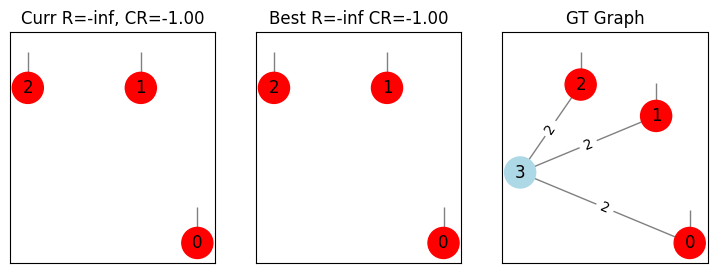

SARSA Agent q_vals:
[-0.04849956478623888, 0]
SARSA Agent q_vals:
[-0.04849956478623888, -0.03948689815644349, 0]
Action: increment:1:3 | Reward: -0.39486898156443484 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


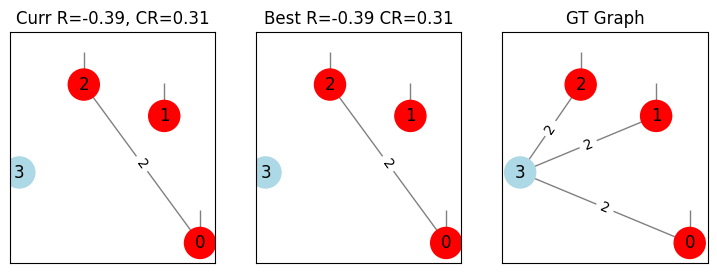

SARSA Agent q_vals:
[-0.04849956478623888, -0.03948689815644349, -0.03959997458320418, 0]
SARSA Agent q_vals:
[-0.04849956478623888, -0.03948689815644349, -0.03959997458320418, -0.03932807554133238, 0]
Action: increment:0:2 | Reward: -0.39328075541332375 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


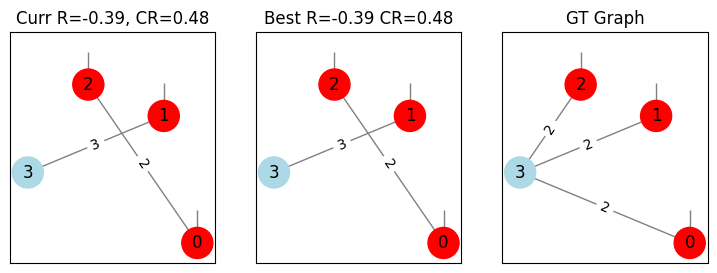

SARSA Agent q_vals:
[-0.04849956478623888, -0.03948689815644349, -0.03959997458320418, -0.03932807554133238, -10000.039573246322, 0]
[Terminated] Action: increment:0:1 | Reward: -100000.3957324632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


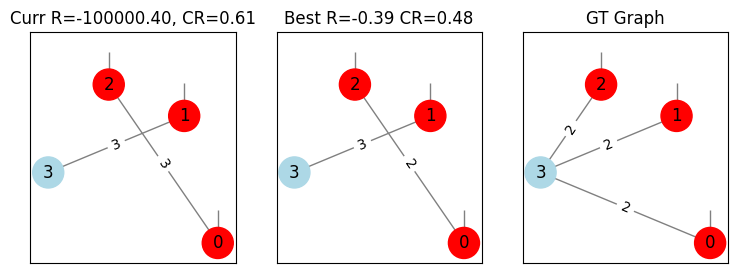

 20%|██        | 1/5 [00:26<01:45, 26.31s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


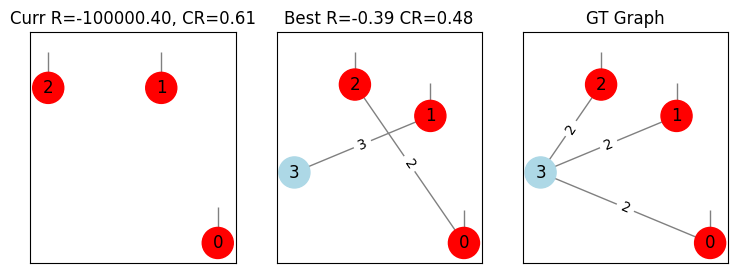

SARSA Agent q_vals:
[-0.09609391421968258, -0.03948689815644349, -0.03959997458320418, -0.03932807554133238, -10000.039573246322, 0]
SARSA Agent q_vals:
[-0.09609391421968258, -0.07898114395810472, -0.03959997458320418, -0.03932807554133238, -10000.039573246322, 0]
Action: increment:1:3 | Reward: -0.39486898156443484 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


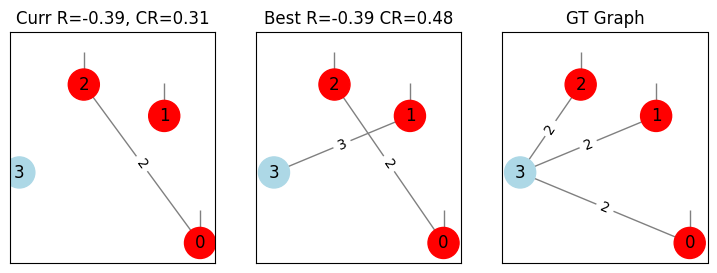

SARSA Agent q_vals:
[-0.09609391421968258, -0.07898114395810472, -0.07916882645466705, -0.03932807554133238, -10000.039573246322, 0]
SARSA Agent q_vals:
[-0.09609391421968258, -0.07898114395810472, -0.07916882645466705, -0.07472334352853152, -10000.039573246322, 0, 0]
Action: addNode | Reward: -0.39328075541332375 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


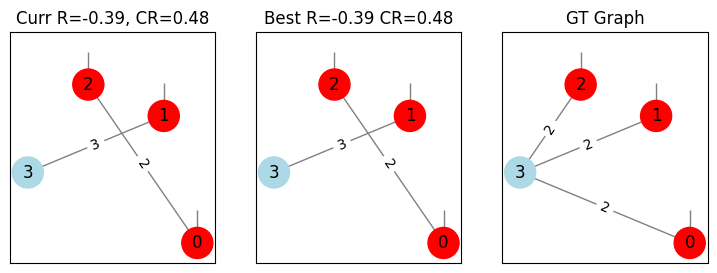

SARSA Agent q_vals:
[-0.09609391421968258, -0.07898114395810472, -0.07916882645466705, -0.07472334352853152, -10000.039573246322, 0, -0.039321930164848584, 0]
SARSA Agent q_vals:
[-0.09609391421968258, -0.07898114395810472, -0.07916882645466705, -0.07472334352853152, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0]
[Terminated] Action: increment:0:2 | Reward: -100000.00624030115 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4']


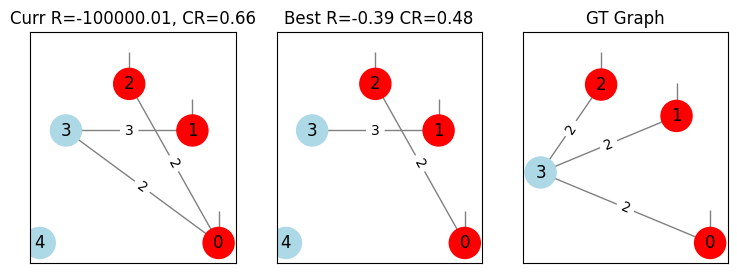

 40%|████      | 2/5 [00:43<01:02, 20.70s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


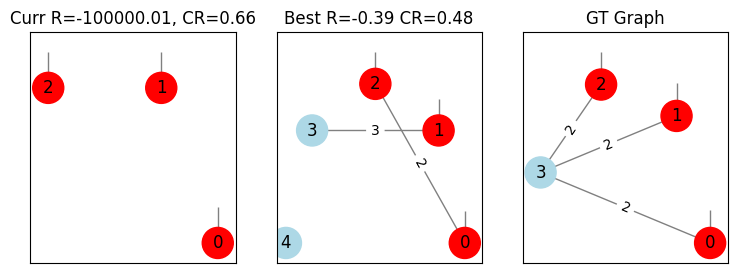

SARSA Agent q_vals:
[-0.14287430386536787, -0.07898114395810472, -0.07916882645466705, -0.07472334352853152, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.07916882645466705, -0.07472334352853152, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0]
Action: increment:1:3 | Reward: -0.39486898156443484 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


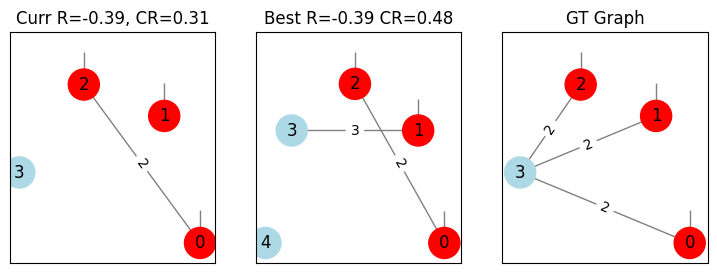

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.07472334352853152, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, 0]
Action: increment:1:2 | Reward: -0.39328075541332375 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


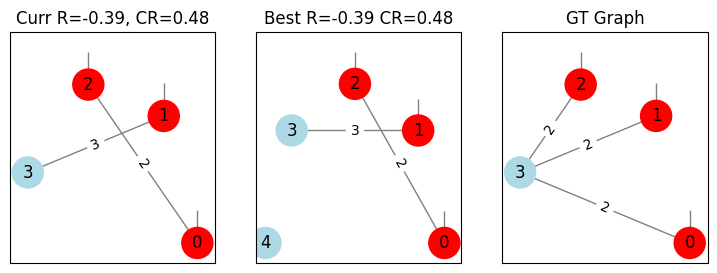

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0]
[Terminated] Action: increment:2:3 | Reward: -100000.0082467637 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


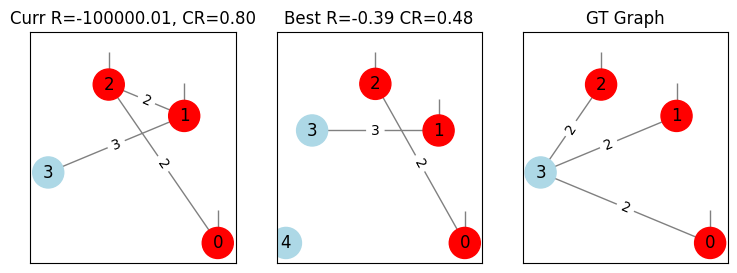

 60%|██████    | 3/5 [00:51<00:30, 15.25s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


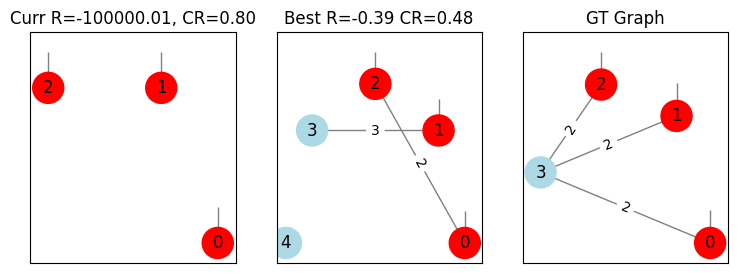

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, 0]
Action: addNode | Reward: -0.3988603409729091 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2']


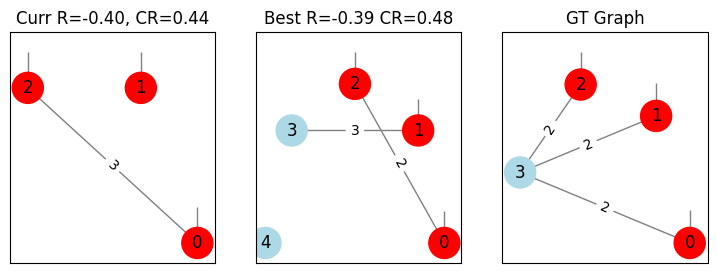

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, -10000.039224016378, 0]
[Terminated] Action: increment:0:3 | Reward: -100000.39224016378 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


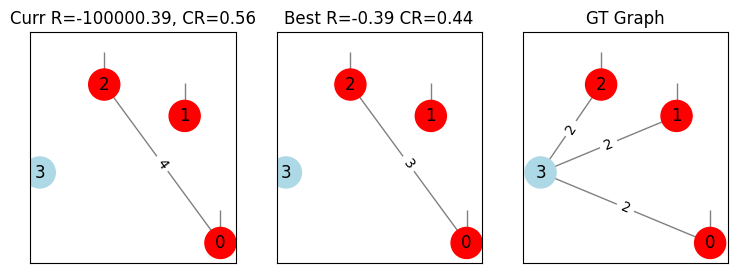

 80%|████████  | 4/5 [01:08<00:15, 15.82s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


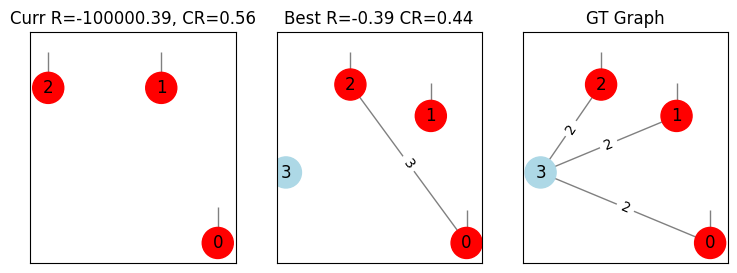

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, -10000.039224016378, 0, -0.04621627419829871, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, -10000.039224016378, 0, -0.04621627419829871, -0.0015197571013752164, 0]
Action: addNode | Reward: -0.015197571013752163 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2']


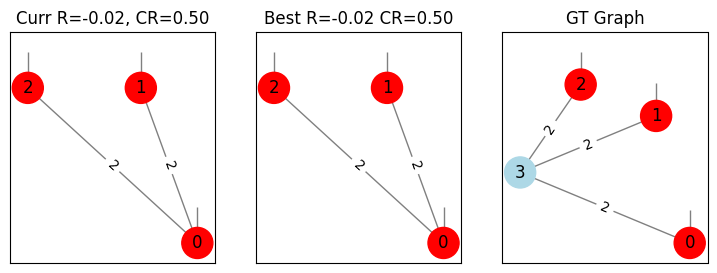

SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, -10000.039224016378, 0, -0.04621627419829871, -0.0015197571013752164, -0.00024190304457353705, 0]
SARSA Agent q_vals:
[-0.14287430386536787, -0.11847889348155898, -0.11831678041090482, -0.10657908471701075, -10000.039573246322, 0, -0.039321930164848584, -10000.000624030115, 0, -10000.00082467637, 0, -0.03933960331270761, -0.03988603409729091, -0.039217955635028064, -10000.039224016378, 0, -0.04621627419829871, -0.0015197571013752164, -0.00024190304457353705, -10000.000345617476, 0]
[Terminated] Action: increment:0:3 | Reward: -100000.00345617476 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3']


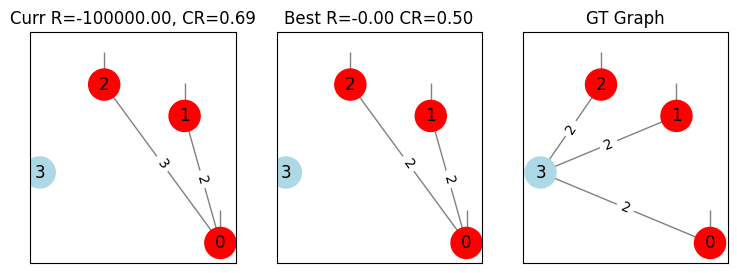

100%|██████████| 5/5 [01:32<00:00, 18.48s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


In [38]:
## Running SARSA on the environment on 5 different seeds

epsilon = 0.2 #@param {allow-input: true}
step_size = 0.1 #@param {allow-input: true}
discount = 0.999 #@param
num_runs =  1 #@param {allow-input: true}
num_episodes = 5 #@param {allow-input: true}

# Setup env
target_tensor, gt_graph, gt_free_dimensions, gt_compression = get_problems()[0]
print(gt_free_dimensions)
print(target_tensor.shape)
env_sarsa = Environment(
        target_tensor,
        gt_graph=gt_graph,
        gt_free_dimensions=gt_free_dimensions,
        max_episode_length=10,
        compression_constraint=gt_compression
    )


agent_sarsa = SarsaAgent(epsilon, step_size, discount)
for j in tqdm(range(num_episodes)):
  print(f"Episode: {j+1}/{num_episodes}")
  states, actions, rewards = train_episode(agent_sarsa, env_sarsa)

### 2.2.3 SARSA Analysis

In [ ]:
def generate_episode(policy):
    """
    Input:
        agent (Agent): an agent of the class Agent implemented above
        env (DiscreteEnv): The FloorIsLava environment
    Returns:
        states (list): the sequence of states in the generated episode
        actions (list): the sequence of actions in the generated episode
        rewards (list): the sequence of rewards in the generated episode
    """
    states = []
    rewards = []
    actions = []
    done = False
    current_state = env.reset()
    states.append(current_state)
    # print(policy)
    # actions.append(action)
    # i = 0

    #print("Initial State:")
    #env.plot_adjacency_matrix()

    while not done:
        #i +=1
        #feasible_actions = env.get_feasible_actions()
        action = policy[str(current_state)][0]
        next_state, reward, truncated, done = env.step_action(action)
        #action = agent.agent_step(current_state, action, reward, next_state, done, feasible_actions)
        done = done or truncated
        actions.append(action)
        rewards.append(reward)
        states.append(next_state)
        current_state = next_state
        # if i % 2 == 0 or done:
        #   print(f"{'[Terminated] ' if done else ''}Action: {action} | Reward: {reward} | Feasible: {feasible_actions}")
        #   env.plot_adjacency_matrix()

    # print("-" * 100 + "END OF EPISODE" + "-" * 100)
    return states, actions, rewards

In [ ]:
def determine_policy(state_action_values):
    """
    Implementation of epsilon-greedy policy
    Note: Please make use of the helper functions (
      licy, random_argmax)
    defined in the previous cell. Also, please use Numpy's function for the random number generator.
    Input:
        state_action_values (list[list]): first axis maps over states of an environment, and second axis the actions.
                                        The stored values are the state-action values corresponding to the state and action index
        epsilon (float): Probability of taking a random action
    Returns policy (int -> int): method taking a state and returning a sampled action to take
    """
    policy = dict()
    for sa in state_action_values:
      state, action = sa
      if not state in policy:
        policy[state] = [action, state_action_values[sa]]
      else:
        if state_action_values[sa] >= policy[state][1]:
          policy[state] = [action, state_action_values[sa]]
    return policy

In [ ]:
sarsa_optimal_returns = []
for i in range(num_runs):
    optimal_policy = determine_policy(sarsa_agents[i].q)
    s, a, r = generate_episode(optimal_policy)
    print('Optimal return for seed {0} is {1}'.format(i, np.sum(r)))
    sarsa_optimal_returns.append(np.sum(r))

## 2.3 Q-learning

### 2.3.1 Q-Learning Agent

In [13]:
class QLearningAgent(Agent):
    def __init__(
      self,
      epsilon,
      step_size,
      discount
    ):
      super().__init__()
      self.epsilon = epsilon
      self.step_size = step_size
      self.discount = discount
      self.q = dict()

    def current_policy(self, current_state, feasible_actions):
      # Choose a random action with probability epsilon
      if len(self.q) == 0  or np.random.random() < epsilon:
        return random.choice(feasible_actions)

      max = -np.inf
      a_opt = ""
      bo=False

      for qa in self.q:
        if qa[0] == str(current_state) and self.q[qa] > max:
          max = self.q[qa]
          a_opt = qa[1]
          bo=True
      if a_opt == "":
        a_opt = random.choice(feasible_actions)
      return a_opt

    def agent_step(self, prev_state, prev_action, prev_reward, current_state, done, feasible_actions):
        """ A learning step for the agent given SARS
        Args:
            prev_state (int): the state observation from the enviromnents last step
            prev_action (int): the action taken given prev_state
            prev_reward (float): The reward received for taking prev_action in prev_state
            current_state (int): The state received for taking prev_action in prev_state
            done (bool): Indicator that the episode is done
        Returns:
            action (int): the action the agent is taking given current_state
        """
        # action = self.get_current_policy()(current_state)
        action = self.current_policy(current_state, feasible_actions)

        if not (str(prev_state),prev_action) in self.q:
            self.q[(str(prev_state),prev_action)] = 0
        if not  (str(current_state),action) in self.q:
            self.q[(str(current_state),action)] = 0

        max = -np.inf

        for qa in self.q:
          if qa[0] == str(current_state) and self.q[qa] > max:
            max = self.q[qa]

        if not done:
            # Update Q-value for the previous state-action pair using the Q-learning update rule
            self.q[(str(prev_state),prev_action)] += self.step_size * (prev_reward + self.discount * max - self.q[(str(prev_state),prev_action)])
        else:
            # If the episode is done, update Q-value for the previous state-action pair with terminal reward
            self.q[(str(prev_state),prev_action)] += self.step_size * (prev_reward - self.q[(str(prev_state),prev_action)])


        return action

### 2.3.2 Train Q-Learning

In [ ]:
## Running Q-learning on the environment on 5 different seeds

# epsilon = 0.5 #@param {allow-input: true}
# step_size = 0.1 #@param {allow-input: true}
# discount = 0.99 #@param
# num_runs =  10 #@param {allow-input: true}
# num_episodes = 80 #@param {allow-input: true}

epsilon = 0.2 #@param {allow-input: true}
step_size = 0.1 #@param {allow-input: true}
discount = 0.999 #@param
num_runs =  1 #@param {allow-input: true}
num_episodes = 5 #@param {allow-input: true}

# Setup env
target_tensor, gt_graph, gt_free_dimensions, gt_compression = get_problems()[0]
env_ql = Environment(
          target_tensor,
          gt_graph=gt_graph,
          gt_free_dimensions=gt_free_dimensions,
          max_episode_length=10,
          compression_constraint=gt_compression
        )
agent_ql = QLearningAgent(epsilon, step_size, discount)
for j in tqdm(range(num_episodes)):
  print(f"Episode: {j+1}/{num_episodes}")
  states, actions, rewards = train_episode(agent_ql, env_ql)

### 2.3.3 Q-Learning Analysis



In [ ]:
ql_optimal_returns = []
for i in range(num_runs):
    optimal_policy = determine_policy(q_agents[i].q)
    s, a, r = generate_episode(optimal_policy)
    print('Optimal return for seed {0} is {1}'.format(i, np.sum(r)))
    ql_optimal_returns.append(np.sum(r))

## 2.3 DQN

In this section we use a more sophisticated RL approach, namely DQN. The DQN method use a neural network to approximate the value function $Q(s,a)$. As our states a graph structures and our actions are modifications to those graphs we must define a state and action encoder to convert those semantic representations to vector representations.

**State Encoder**

We use a Convolutional Neural Network (CNN) to encode the variable size adjacency matrix (i.e. the tensor network graph representation) into a fixed size vector.

**Action Encoder**

We use a one hot embedding to indicate the action type `['addNode', 'increment']`. The increment action, must be further specified as to which edge is being incremented. Thus altogether we use a vector of size 4 where the first two indices define the one hot index of the action and the latter two contain the nodes under question if the action is an `'increment'` action.

### 2.3.1 DQN Agent

In [39]:
import torch
import torch.nn as nn
import numpy as np

class ReplayBuffer:
    """This class implements a replay buffer for experience replay."""
    def __init__(self, buffer_size: int):
        self.buffer_size = buffer_size
        self.observations = []
        self.next_observations = []
        self.actions = []
        self.rewards = []
        self.terminated = []
        # self.position = 0
        self.num_added = 0

    def add(self, observation: object, action: object, reward: float, next_observation: object, terminated: bool) -> None:
        """ Adds a new experience tuple to the replay buffer.

        Args:
          observation (object): The current observation.
          action (object): The action taken.
          reward (float): The reward received.
          next_observation (object): The next observation.
          terminated (bool): Whether the episode terminated after this experience.

        """
        # Check if the buffer is full
        if len(self.observations) >= self.buffer_size:
            # Remove the oldest experience
            self.observations.pop(0)
            self.next_observations.pop(0)
            self.actions.pop(0)
            self.rewards.pop(0)
            self.terminated.pop(0)

        # Append new experience
        self.observations.append(observation)
        self.next_observations.append(next_observation)
        self.actions.append(action)
        self.rewards.append(reward)
        self.terminated.append(terminated)

        self.num_added += 1

    def sample(self, batch_size: int) -> tuple:
        """Samples a batch of experiences from the replay buffer.

        Args:
            batch_size (int): The number of experiences to sample.

        Returns:
          observations (List[object]): The current observations. Shape (batch_size, observation_dim)
          actions (List[object]): The actions taken. Shape (batch_size, action_dim)
          rewards (List[float]): The rewards received. Shape (batch_size,)
          next_observations (List[object]): The next observations. Shape (batch_size, observation_dim)
          terminated (List[bool]): Whether the episode terminated after this  experience.

        """
        buffer_size = min(self.num_added, self.buffer_size)
        indices = np.random.randint(0, buffer_size, size=batch_size)

        sampled_observations = [self.observations[i] for i in indices]
        sampled_actions = [self.actions[i] for i in indices]
        sampled_rewards = [self.rewards[i] for i in indices]
        sampled_next_observations = [self.next_observations[i] for i in indices]
        sampled_terminated = [self.terminated[i] for i in indices]

        return sampled_observations, sampled_actions, sampled_rewards, sampled_next_observations, sampled_terminated


class StateEncoder(nn.Module):
    def __init__(self, embedding_dim: int) -> None:
        """Encodes a TN State array using a CNN"""
        super(StateEncoder, self).__init__()

        # Define the convolutional layers and activation functions
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(8, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.Conv2d(16, embedding_dim, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.AdaptiveAvgPool2d(1)  # Global Average Pooling
        )

    def forward(self, state: np.array):
        """
        Args:
            state: [H, W]

        Returns:
          (torch.Tensor):

        """

        assert len(state.shape) == 2, 'Expected a 2D input for state'

        # Convert numpy array to torch tensor and add channel dimension
        state_tensor = torch.from_numpy(state).float().unsqueeze(0).unsqueeze(0)  # [1, 1, H, W]

        # Pass the state through the encoder
        encoded_state = self.encoder(state_tensor)  # [1, C, 1, 1]

        # Reshape the encoded state to a flat vector
        encoded_state_flat = encoded_state.view(-1) # [C,]

        return encoded_state_flat


class ActionEncoder:
    def __init__(self):
      self.action_types = ['addnode', 'deletenode', 'increment', 'decrement']
    def __call__(self, action: str):
        """
        Encodes the action based on a unary index and a binary pair.

        Args:
            action: XXXX:int:int
            unary_index (int): in {0,1,2}
            binary_index (List[int]): List containing any two integers
        Returns:
            (torch.Tensor) [3,]
        """
        # Convert inputs to tensors
        action_specification = action.split(":")
        action_type = action.split(":")[0]

        unary_index = self.action_types.index(action_type.lower())
        unary_tensor = torch.tensor([unary_index])

        if len(action_specification) == 3:
          binary_tensor = torch.tensor([int(action_specification[1]), int(action_specification[2])])
        elif len(action_specification) == 2:
          binary_tensor = torch.tensor([int(action_specification[1])])
        else:
          binary_tensor = torch.tensor([0, 0])

        encoded_action = torch.cat((unary_tensor, binary_tensor), dim=0)
        return encoded_action


class DQNAgent:
    def __init__(
        self,
        state_encoder,
        action_encoder,
        input_dimension,
        get_fesible_actions,
        epsilon,
        learning_starts_at,
        learning_frequency,
        learning_rate,
        discount_factor,
        buffer_size,
        target_update_frequency,
        batch_size,
    ):

        self.state_encoder = state_encoder
        self.action_encoder = action_encoder

        self.input_dimension = input_dimension
        self.get_fesible_actions = get_fesible_actions
        self.epsilon = epsilon
        self.learning_starts_at = learning_starts_at
        self.learning_frequency = learning_frequency
        self.learning_rate = learning_rate
        self.discount_factor = discount_factor
        self.buffer_size = buffer_size
        self.target_update_frequency = target_update_frequency
        self.batch_size = batch_size

        self.network = self.build_network(self.input_dimension)  # [B, input_dimension] => [B, 1]
        self.target_network = copy.deepcopy(self.network).requires_grad_(False)

        self.replay_buffer = ReplayBuffer(buffer_size=self.buffer_size)
        self.optimizer = torch.optim.Adam(self.network.parameters(), lr=self.learning_rate)
        self.loss_fn = torch.nn.MSELoss()
        self.step = 0
        self.metrics = None

    def build_network(self, input_dimension):
        return torch.nn.Sequential(
            torch.nn.Linear(input_dimension, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, 256),
            torch.nn.ReLU(),
            torch.nn.Linear(256, 1),
        )

    def current_policy(self, current_state: np.array, feasible_actions: list):
        # Choose a random action with probability epsilon
        take_rand_action = np.random.uniform() < self.epsilon
        if take_rand_action:
          action = random.choice(feasible_actions)
        else:
          state_embedding = self.state_encoder(current_state)  # [D_state,]
          action_embeddings = [self.action_encoder(a) for a in feasible_actions] # [D_action,]
          inps = torch.stack([torch.cat((state_embedding, ae), dim=-1) for ae in action_embeddings], dim=0)  # [B, D_input]
          q_values = self.network(inps)  # [B, D_input]
          action_idx = torch.argmax(q_values.reshape(-1)).item()
          action = feasible_actions[action_idx]
        return action

    def agent_step(self, prev_state, prev_action, prev_reward, current_state, done, feasible_actions):
        take_rand_action = np.random.uniform() < self.epsilon
        if take_rand_action:
          action = random.choice(feasible_actions)
        else:
          state_embedding = self.state_encoder(current_state)  # [D_state,]
          action_embeddings = [self.action_encoder(a) for a in feasible_actions] # [D_action,]
          inps = torch.stack([torch.cat((state_embedding, ae), dim=-1) for ae in action_embeddings], dim=0)  # [B, D_input]
          q_values = self.network(inps)  # [B, D_input]
          action_idx = torch.argmax(q_values.reshape(-1)).item()
          action = feasible_actions[action_idx]

        # Add to replay buffer
        self.replay_buffer.add(
            prev_state,
            prev_action,
            prev_reward,
            current_state,
            done,
        )


        # Perform training step
        if self.step > self.learning_starts_at and self.step % self.learning_frequency == 0:
            self.metrics = self.perform_training_step()

        if self.step % self.target_update_frequency == 0:
            self.target_network.load_state_dict(self.network.state_dict())

        self.step += 1
        return action

    def perform_training_step(self):
        (
            _observations,
            _actions,
            _rewards,
            _next_observations,
            _terminated,
        ) = self.replay_buffer.sample(self.batch_size)

        observations = torch.tensor([self.encode_state(obs) for obs in _observations])  # [B, D_state]
        actions = torch.tensor([self.encode_action(act) for act in _actions])  # [B, D_action]
        rewards = torch.Tensor(_rewards)
        terminated = torch.Tensor(terminated)  # [B,]

        q_values = self.network(torch.cat([observations, actions], dim=-1))  # [B,]
        targets = self.compute_targets(rewards, _next_observations, terminated)  # [B,]

        # MSE loss
        loss = torch.nn.functional.mse_loss(q_values, targets)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        return {
            "loss": loss.item(),
            "q_values": q_values.mean().detach().numpy()
        }


    def compute_targets(self, rewards: torch.Tensor, next_observations: List, terminated: torch.Tensor):
      """ Computes the target Q-values for a batch of transitions."""
      batch_size = len(next_observations)
      max_q_values = torch.zeros(batch_size)

      with torch.no_grad():
          # Iterate over each observation and its index
          for idx, obs in enumerate(next_observations):
              # Get feasible actions for the current observation
              feasible_actions = self.get_feasible_actions(obs)

              # If there are no feasible actions, continue to the next observation
              if not feasible_actions:
                  continue

              # Encode the current observation
              encoded_obs = self.encode_state(obs)

              # Calculate Q-values for each feasible action and find the maximum
              # q_values = torch.stack([
              #     self.target_network(
              #         torch.cat((encoded_obs, self.encode_action(action)))
              #         ) for action in feasible_actions
              #     ])
              input = torch.cat(
                  [
                      encoded_obs.reshape(1, -1).repeat(len(feasible_actions), 1),
                      torch.stack([self.encode_action(action) for action in feasible_actions])
                  ],
                  dim=-1
                )
              q_values = self.target_network(input).reshape(-1)  # [B, 1] => [B,]
              max_q_values[idx] = q_values.max()

      # Compute the targets using the Bellman equation
      targets = rewards + (1 - terminated) * self.discount_factor * max_q_values
      return targets


In [40]:
import unittest
class TestEnvironment(unittest.TestCase):

    def test_action_encoder(self):
      act = ActionEncoder()
      result = act("increment:4:3")
      np.testing.assert_array_equal(result, torch.tensor([2, 4, 3]))

    def test_state_encoder(self):
      enc = StateEncoder(embedding_dim=10)
      state = np.array([[0, 0], [0, 0]], dtype=int)
      encoded_state = enc(state)
      self.assertEqual(list(encoded_state.shape), [10])

    def test_dqn_agent(self):
      # Setup env
      target_tensor, gt_graph, gt_free_dimensions, gt_compression = get_problem(1)
      env = Environment(
              target_tensor, gt_graph=gt_graph, gt_free_dimensions=gt_free_dimensions, max_episode_length=10
            )

      state_embedding_dim = 32
      agent = DQNAgent(
          state_encoder=StateEncoder(embedding_dim=state_embedding_dim),
          action_encoder=ActionEncoder(),
          input_dimension=state_embedding_dim + 3,
          get_fesible_actions=env.get_feasible_actions,
          epsilon=.1,
          learning_starts_at=500,
          learning_frequency=10,
          learning_rate=.001,
          discount_factor=0.99,
          buffer_size=1000,
          target_update_frequency=100,
          batch_size=128,
      )
      state = env.reset()
      action = agent.current_policy(state, env.get_feasible_actions())
      self.assertTrue(action in env.get_feasible_actions())


suite = unittest.TestLoader().loadTestsFromTestCase(TestEnvironment)
unittest.TextTestRunner().run(suite)

...
----------------------------------------------------------------------
Ran 3 tests in 0.020s

OK


GT TN Params: 32 | Contracted Params: 64 


<unittest.runner.TextTestResult run=3 errors=0 failures=0>

### 2.3.2 Train DQN

In [ ]:
def train_episode_dqn(agent, env):
    """
    Input:
        agent (Agent): an agent of the class Agent implemented above
        env (DiscreteEnv): The FloorIsLava environment
    Returns:
        states (list): the sequence of states in the generated episode
        actions (list): the sequence of actions in the generated episode
        rewards (list): the sequence of rewards in the generated episode
    """
    states = []
    rewards = []
    actions = []
    done = False
    current_state = env.reset()
    states.append(current_state)
    action = agent.current_policy(current_state, env.get_feasible_actions())
    actions.append(action)
    i = 0

    print("Initial State:")
    env.plot_adjacency_matrix()

    while not done:
        i +=1
        feasible_actions = env.get_feasible_actions()
        next_state, reward, truncated, done = env.step_action(action)
        action = agent.agent_step(current_state, action, reward, next_state, done, feasible_actions)
        done = done or truncated
        actions.append(action)
        rewards.append(reward)
        states.append(next_state)
        current_state = next_state
        if i % 2 == 0 or done:
          print(f"{'[Terminated] ' if done else ''}Action: {action} | Reward: {reward} | Feasible: {feasible_actions}")
          env.plot_adjacency_matrix()

    print("-" * 100 + "END OF EPISODE" + "-" * 100)
    return states, actions, rewards

In [ ]:
# epsilon = 0.1 #@param {allow-input: true}
# discount = 0.999 #@param
# num_episodes = 80 #@param {allow-input: true}

epsilon = 0.2 #@param {allow-input: true}
discount = 0.999 #@param
num_episodes = 5 #@param {allow-input: true}

# Setup env
target_tensor, gt_graph, gt_free_dimensions, gt_compression = get_problems()[0]
env_dqn = Environment(
        target_tensor, gt_graph=gt_graph, gt_free_dimensions=gt_free_dimensions, max_episode_length=10
      )

state_embedding_dim = 32
agent = DQNAgent(
    # observation_space=env.observation_space,
    # action_space=env.action_space,
    state_encoder=StateEncoder(embedding_dim=state_embedding_dim),
    action_encoder=ActionEncoder(),
    input_dimension=state_embedding_dim + 3,
    get_fesible_actions=env.get_feasible_actions,
    epsilon=epsilon,
    learning_starts_at=500,
    learning_frequency=10,
    learning_rate=.001,
    discount_factor=discount,
    buffer_size=1000,
    target_update_frequency=100,
    batch_size=128,
)
for j in (range(num_episodes)):
  print(f"Episode: {j+1}/{num_episodes}")
  states, actions, rewards = train_episode_dqn(agent, env_dqn)
  rewards=torch.tensor(rewards).detach().numpy()

# 3 Comparison

In [ ]:
env_dqn.plot_adjacency_matrix()

In [ ]:
env_ql.plot_adjacency_matrix()

In [ ]:
env_sarsa.plot_adjacency_matrix()

In [ ]:
print("hello")

## 3.2 Comparison (Quantitative)

All agents are trained for the same number of episodes.

GT TN Params: 32 | Contracted Params: 64 
GT TN Params: 160 | Contracted Params: 512 
Target shape: (1, 4, 4) | core shape: (4, 4, 4) | einsum: ijk,klm->ijlm 
Target shape: (1, 16, 4) | core shape: (4, 4, 4) | einsum: ijk,klm->ijlm 
Target shape: (1, 64, 4) | core shape: (4, 4, 1) | einsum: ijk,klm->ijlm 
GT TN Params: 160 | Contracted Params: 256 
Target shape: (1, 6, 8) | core shape: (8, 6, 8) | einsum: ijk,klm->ijlm 
Target shape: (1, 36, 8) | core shape: (8, 6, 8) | einsum: ijk,klm->ijlm 
Target shape: (1, 216, 8) | core shape: (8, 6, 8) | einsum: ijk,klm->ijlm 
Target shape: (1, 1296, 8) | core shape: (8, 6, 8) | einsum: ijk,klm->ijlm 
Target shape: (1, 7776, 8) | core shape: (8, 6, 1) | einsum: ijk,klm->ijlm 
GT TN Params: 1632 | Contracted Params: 46656 
GT TN Params: 32 | Contracted Params: 64 
GT TN Params: 160 | Contracted Params: 512 
Target shape: (1, 4, 4) | core shape: (4, 4, 4) | einsum: ijk,klm->ijlm 
Target shape: (1, 16, 4) | core shape: (4, 4, 4) | einsum: ijk,klm->i

Problem 0, Agent dqn:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


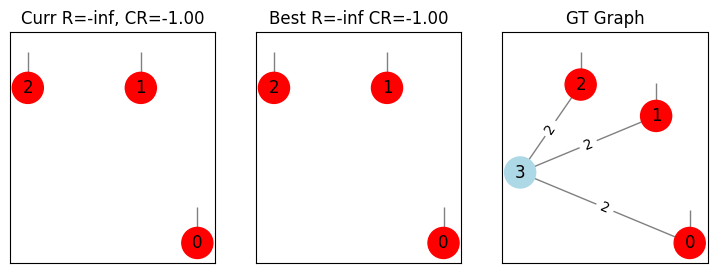

Action: addNode | Reward: -0.22416829498722632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


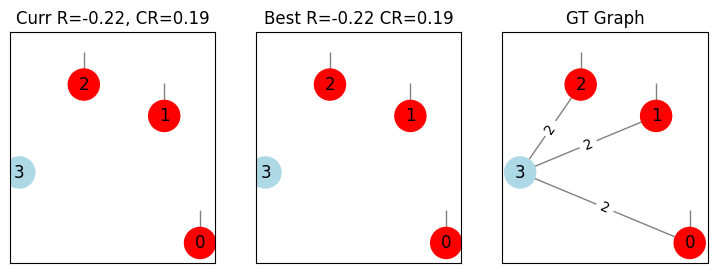

Action: increment:0:1 | Reward: -0.2241080268045461 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


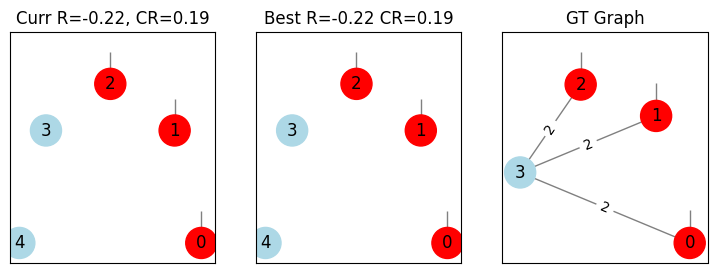

Action: increment:0:1 | Reward: -0.22401764426727347 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


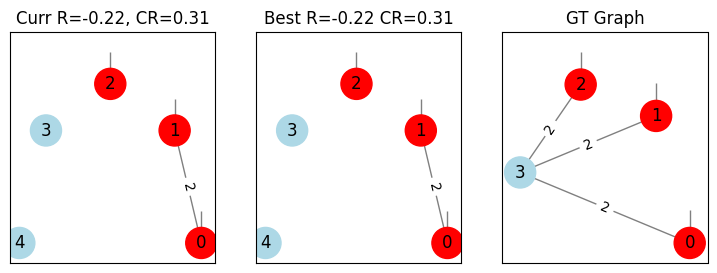

Action: increment:0:1 | Reward: -0.19915153264802293 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


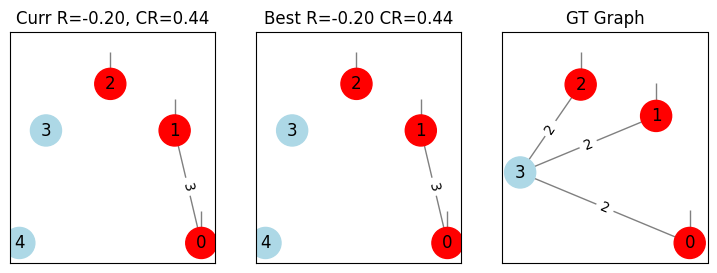

[Terminated] Action: increment:0:1 | Reward: -100000.19963716883 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


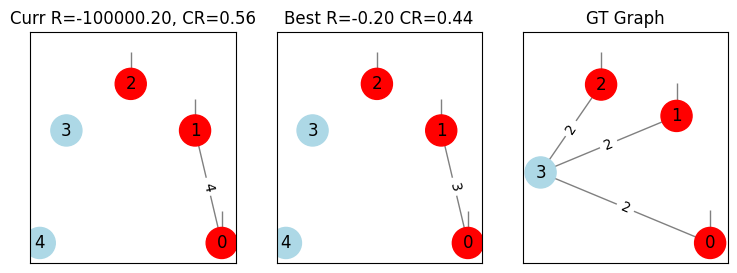

Problem 0, Agent dqn:  20%|██        | 1/5 [00:15<01:02, 15.63s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


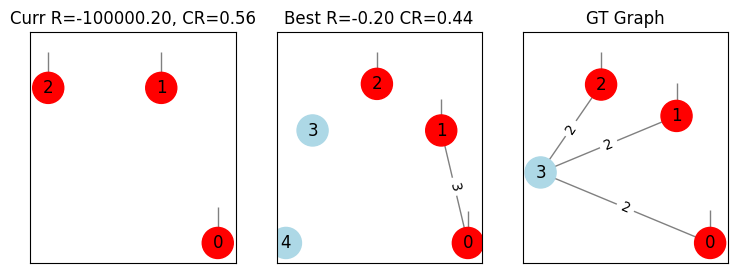

Action: increment:1:2 | Reward: -0.22416829498722632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


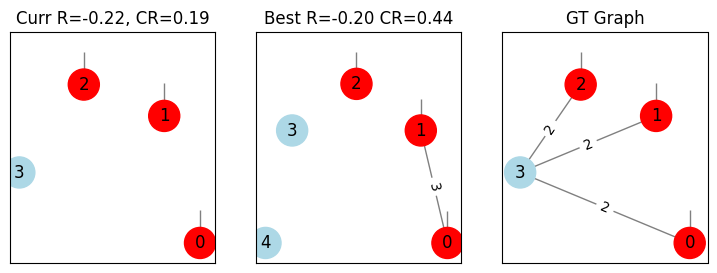

Action: increment:0:1 | Reward: -0.23128393488454146 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


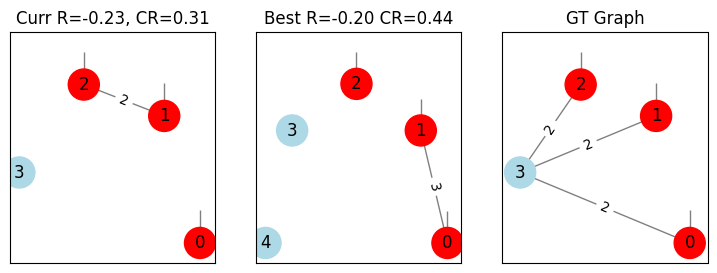

Action: increment:0:1 | Reward: -0.0023690712499421502 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


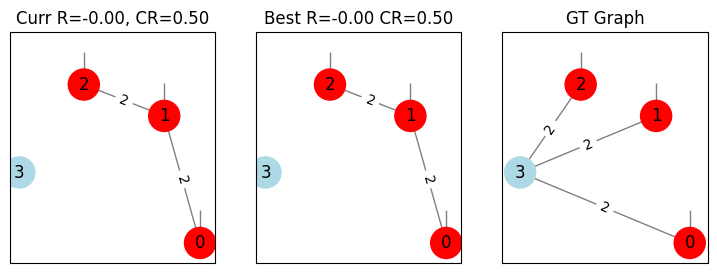

[Terminated] Action: increment:0:1 | Reward: -100000.01014938061 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


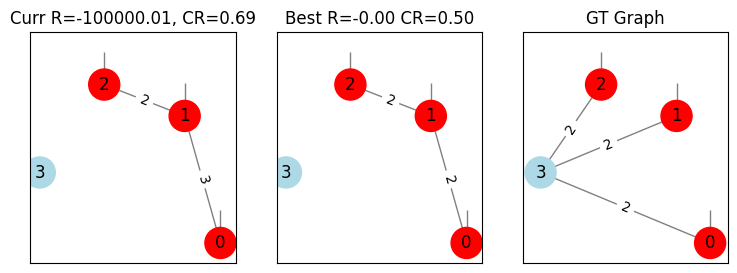

Problem 0, Agent dqn:  40%|████      | 2/5 [00:36<00:55, 18.49s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


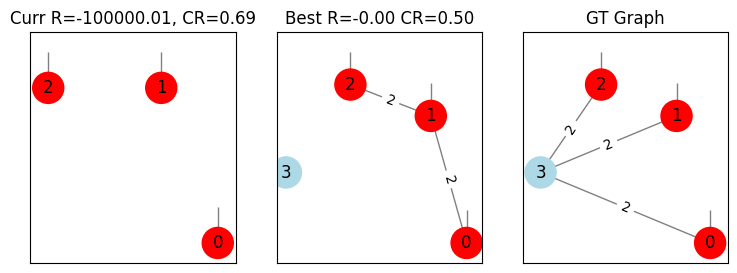

Action: addNode | Reward: -0.22416829498722632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


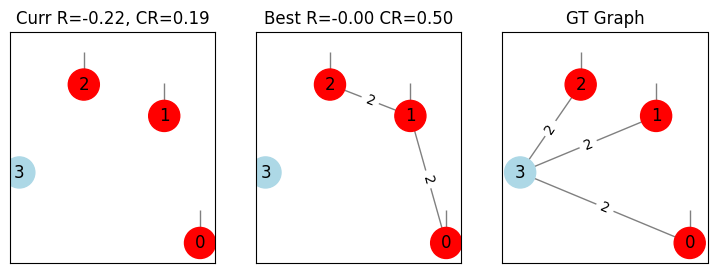

Action: increment:0:1 | Reward: -0.2241080268045461 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


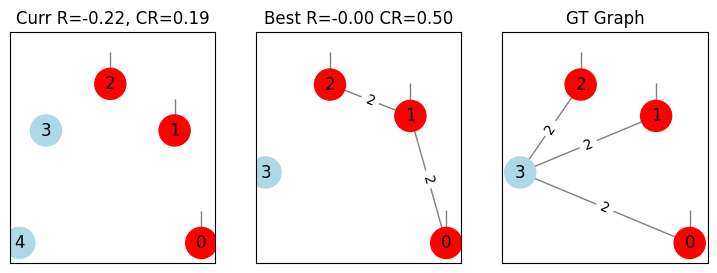

Action: increment:0:1 | Reward: -0.22401764426727347 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


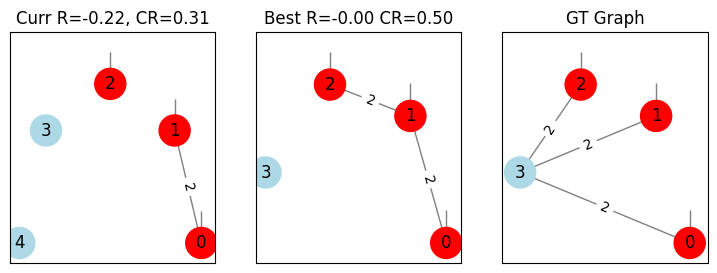

Action: increment:0:1 | Reward: -0.19915153264802293 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


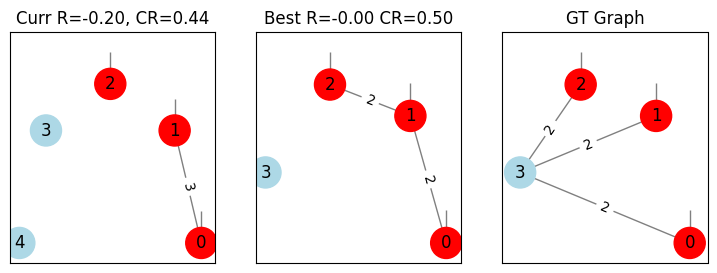

[Terminated] Action: increment:0:1 | Reward: -100000.19963716883 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


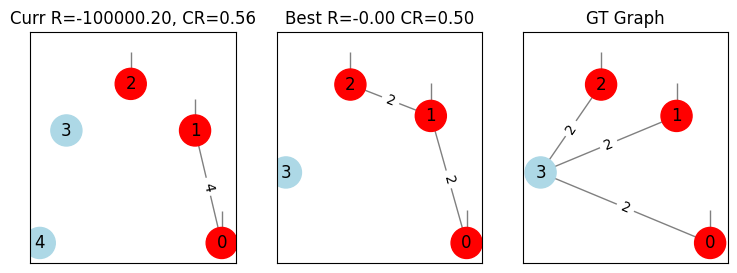

Problem 0, Agent dqn:  60%|██████    | 3/5 [00:39<00:23, 11.66s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


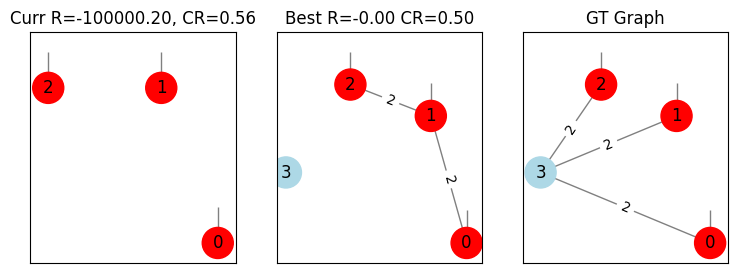

Action: addNode | Reward: -0.22416829498722632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


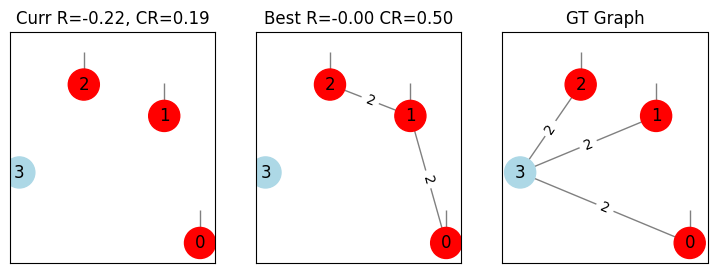

Action: increment:0:1 | Reward: -0.2241080268045461 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


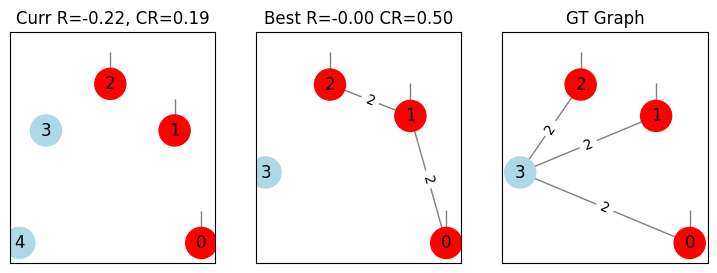

Action: increment:0:1 | Reward: -0.22401764426727347 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


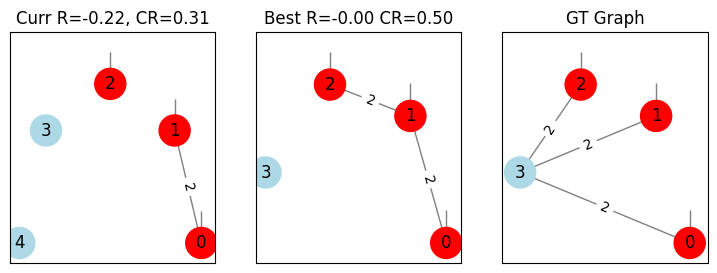

Action: increment:0:1 | Reward: -0.19915153264802293 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


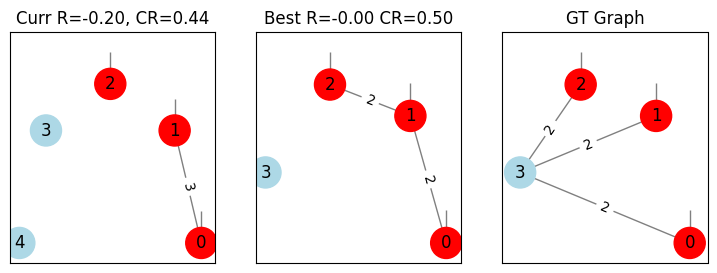

[Terminated] Action: increment:1:2 | Reward: -100000.19963716883 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


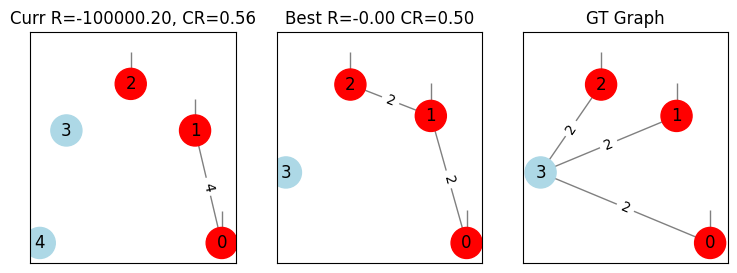

Problem 0, Agent dqn:  80%|████████  | 4/5 [00:42<00:08,  8.32s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


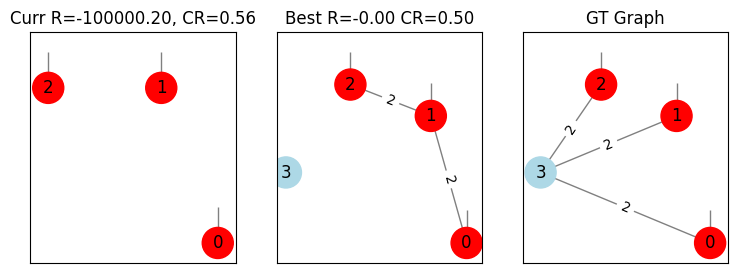

Action: addNode | Reward: -0.22416829498722632 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


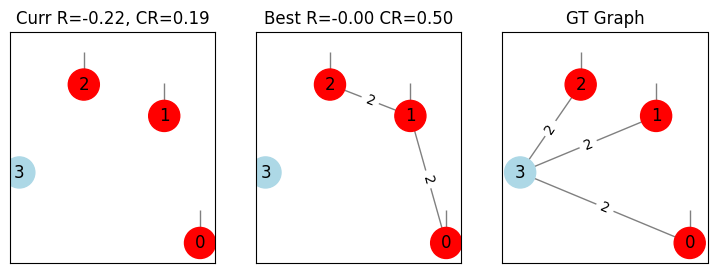

Action: increment:0:1 | Reward: -0.2241080268045461 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


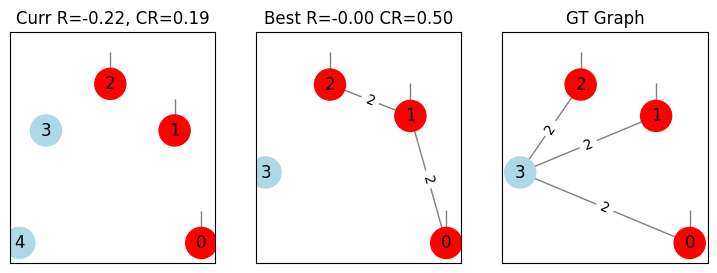

Action: increment:0:1 | Reward: -0.22401764426727347 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


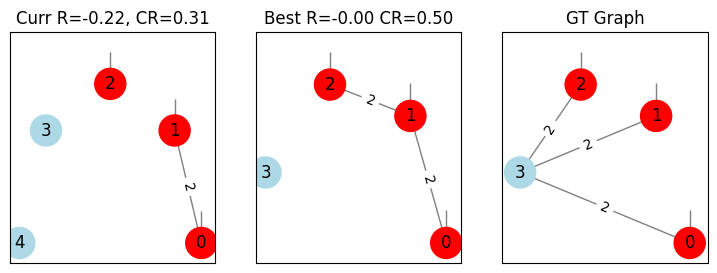

Action: increment:0:1 | Reward: -0.19915153264802293 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


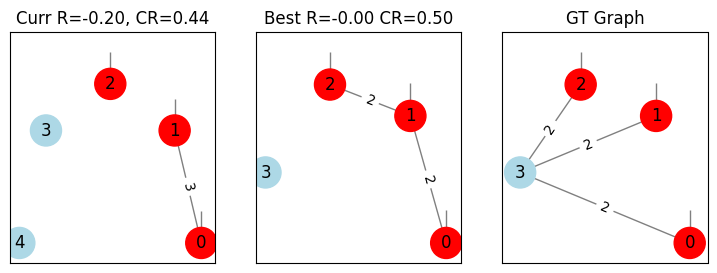

[Terminated] Action: increment:0:1 | Reward: -100000.19963716883 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


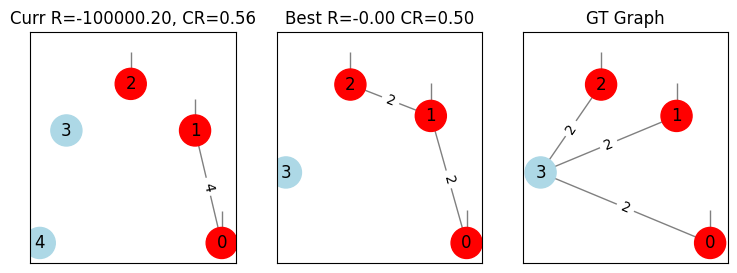

Problem 0, Agent dqn: 100%|██████████| 5/5 [00:47<00:00,  9.42s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 0, Agent sarsa:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


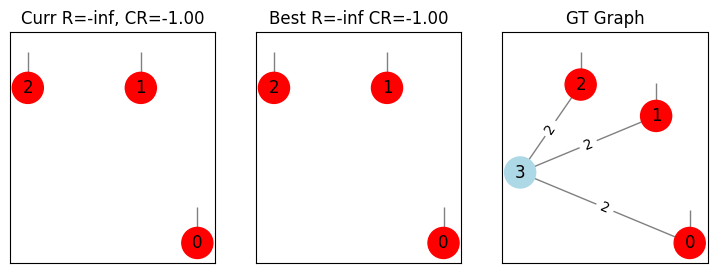

SARSA Agent q_vals:
[-0.022398261950651727, 0]
Action: addNode | Reward: -0.22398261950651727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


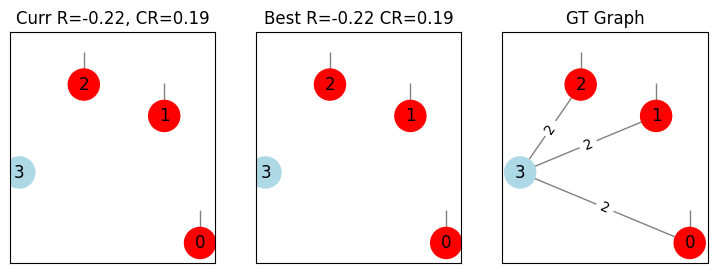

SARSA Agent q_vals:
[-0.022398261950651727, -0.022399125077033885, 0]
Action: increment:0:3 | Reward: -0.22399125077033882 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


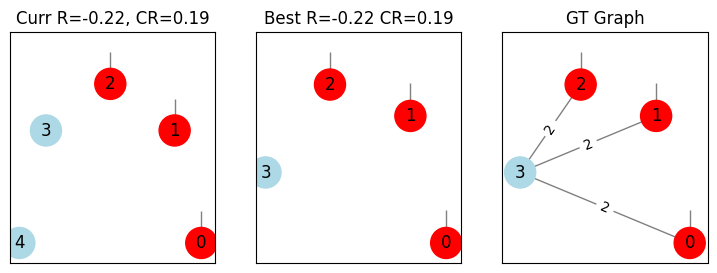

SARSA Agent q_vals:
[-0.022398261950651727, -0.022399125077033885, -0.022395783041377113, 0]
Action: increment:2:3 | Reward: -0.2239578304137711 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


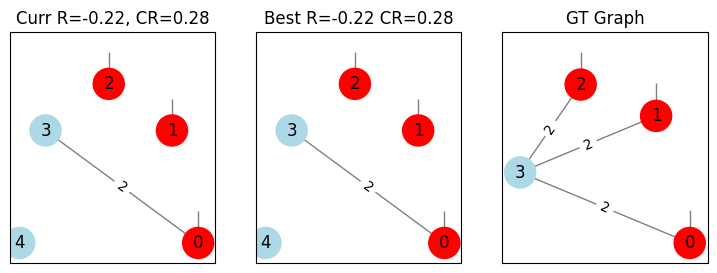

SARSA Agent q_vals:
[-0.022398261950651727, -0.022399125077033885, -0.022395783041377113, -0.022465944396881817, 0]
Action: increment:0:4 | Reward: -0.22465944396881815 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


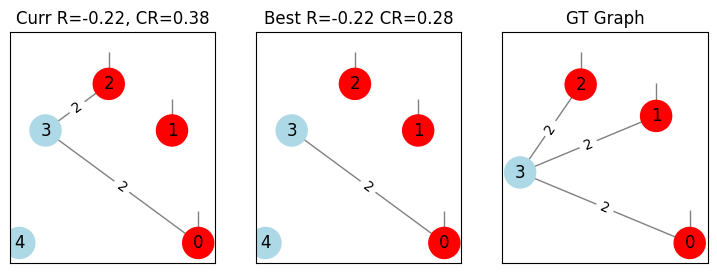

SARSA Agent q_vals:
[-0.022398261950651727, -0.022399125077033885, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0]
[Terminated] Action: increment:0:2 | Reward: -100000.03005482451 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


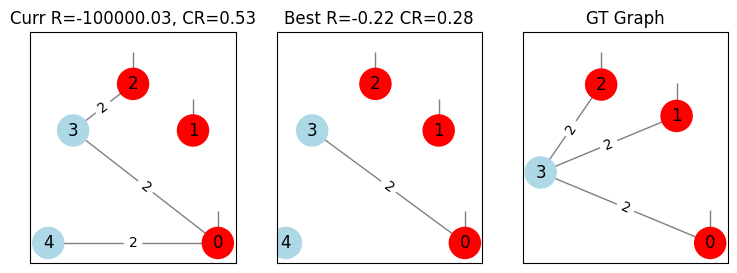

Problem 0, Agent sarsa:  20%|██        | 1/5 [00:22<01:29, 22.30s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


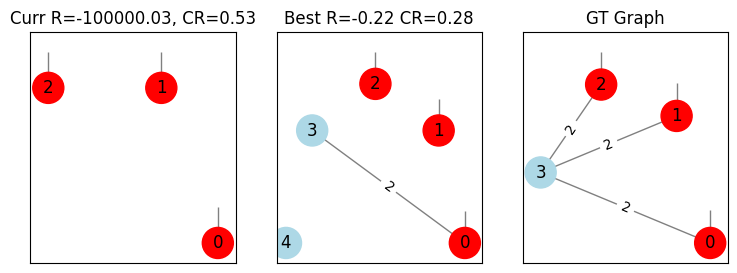

SARSA Agent q_vals:
[-0.04479437030143397, -0.022399125077033885, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0]
Action: addNode | Reward: -0.22398261950651727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


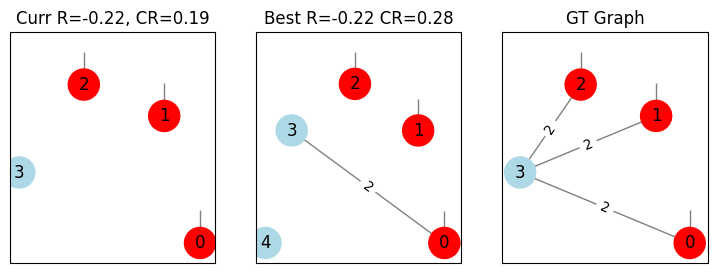

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, 0]
Action: increment:0:2 | Reward: -0.22399125077033882 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


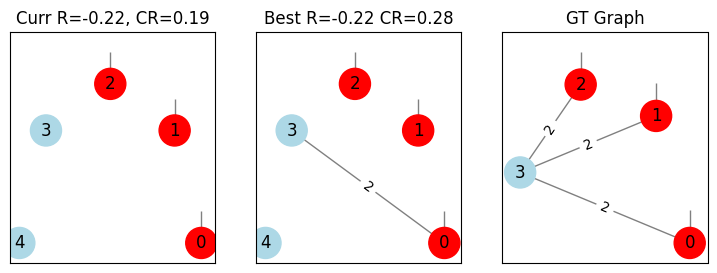

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, 0]
Action: increment:2:3 | Reward: -0.02815072308944289 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


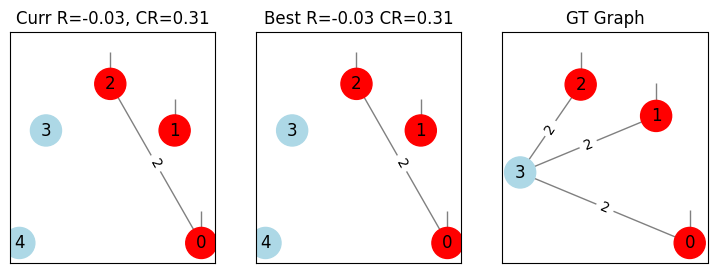

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, 0]
Action: increment:2:3 | Reward: -0.029669358326849245 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


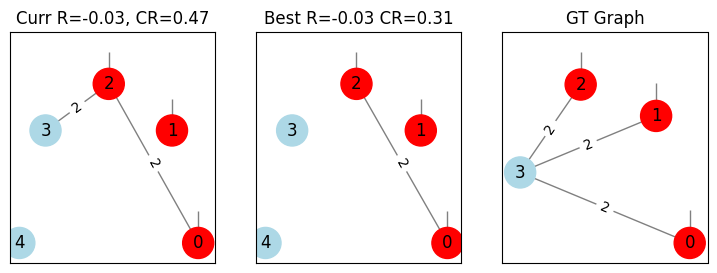

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0]
[Terminated] Action: increment:3:4 | Reward: -100000.03042659526 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


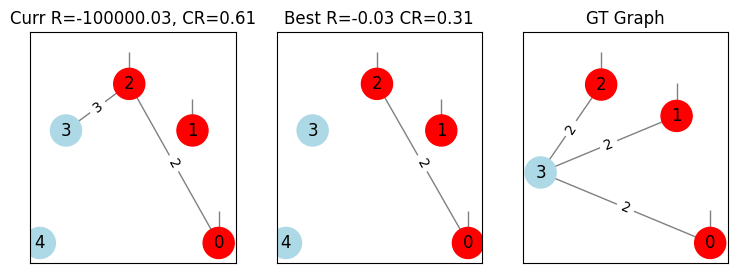

Problem 0, Agent sarsa:  40%|████      | 2/5 [00:42<01:03, 21.08s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


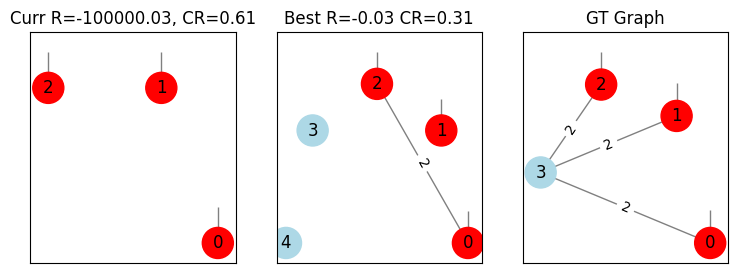

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, 0]
Action: increment:0:2 | Reward: -0.21723528831189515 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


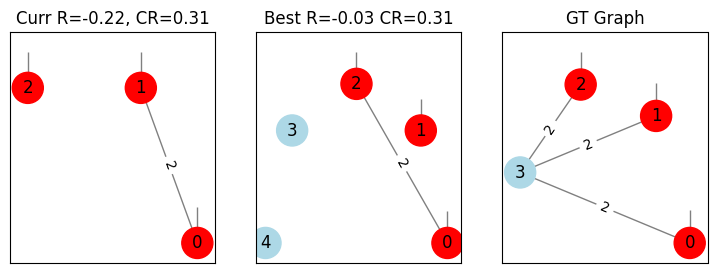

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, 0]
Action: increment:1:2 | Reward: -0.012401669295283009 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


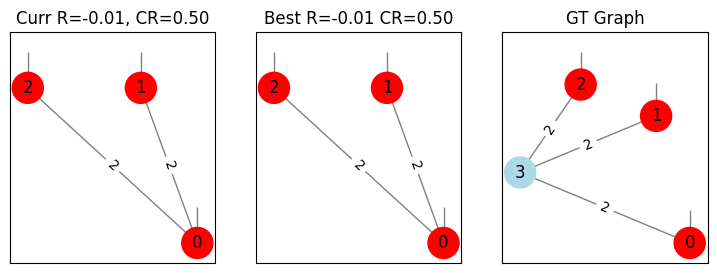

SARSA Agent q_vals:
[-0.04479437030143397, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
[Terminated] Action: increment:0:2 | Reward: -100000.01344411384 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


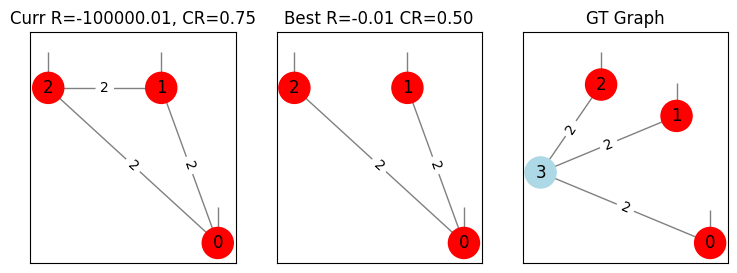

Problem 0, Agent sarsa:  60%|██████    | 3/5 [00:54<00:33, 16.92s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


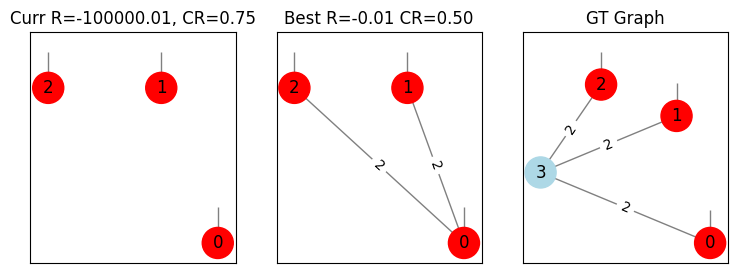

SARSA Agent q_vals:
[-0.0669647731528141, -0.04255833764636438, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: addNode | Reward: -0.22398261950651727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


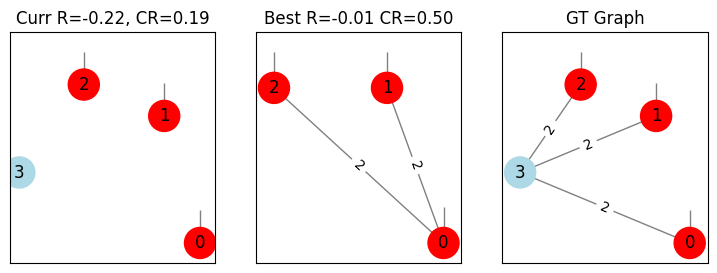

SARSA Agent q_vals:
[-0.0669647731528141, -0.060982854682425355, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.002815072308944289, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: increment:0:2 | Reward: -0.22399125077033882 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


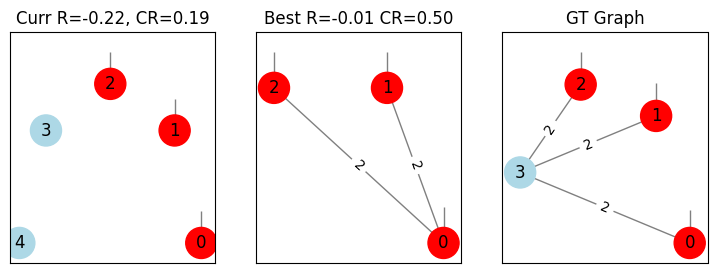

SARSA Agent q_vals:
[-0.0669647731528141, -0.060982854682425355, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.005645034276679373, -0.002966935832684925, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: increment:2:3 | Reward: -0.02815072308944289 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


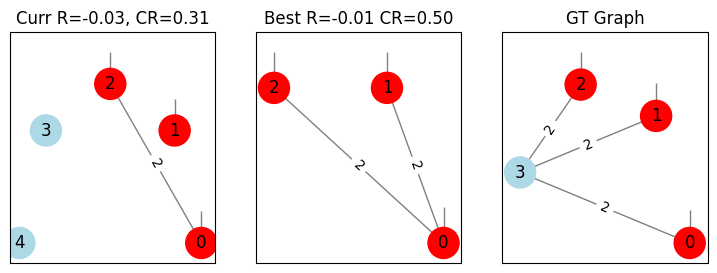

SARSA Agent q_vals:
[-0.0669647731528141, -0.060982854682425355, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.005645034276679373, -999.0059411397689, -10000.003042659526, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Bad action retaken (1)
Options: ['UNK', 'UNK', 'UNK', 'UNK', 'UNK', 'UNK', 'UNK', -10000.003042659526, 'UNK', 'UNK']
Action: increment:2:3 | Reward: -0.029669358326849245 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


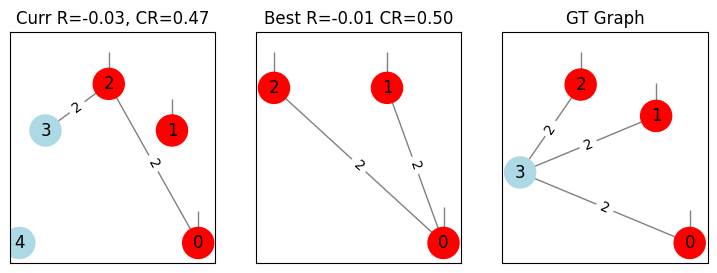

SARSA Agent q_vals:
[-0.0669647731528141, -0.060982854682425355, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.005645034276679373, -999.0059411397689, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
[Terminated] Action: increment:3:4 | Reward: -100000.03042659526 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


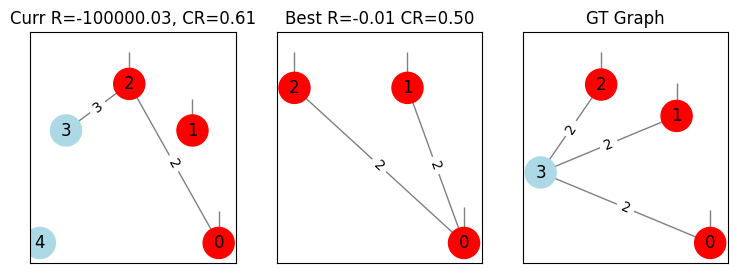

Problem 0, Agent sarsa:  80%|████████  | 4/5 [00:57<00:11, 11.55s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


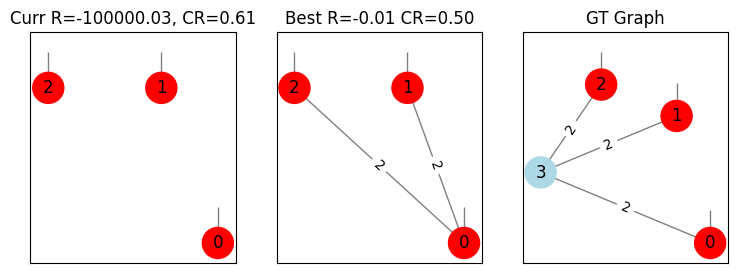

SARSA Agent q_vals:
[-0.08875874497095872, -0.060982854682425355, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.005645034276679373, -999.0059411397689, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: addNode | Reward: -0.22398261950651727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


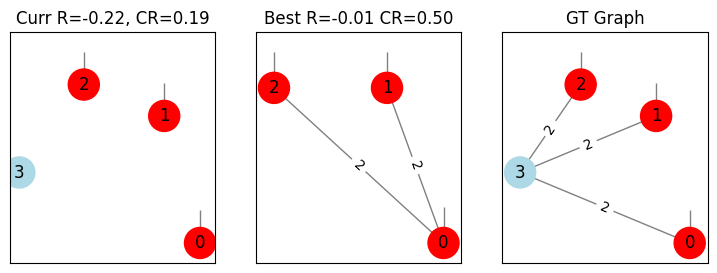

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -0.005645034276679373, -999.0059411397689, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: increment:0:2 | Reward: -0.22399125077033882 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


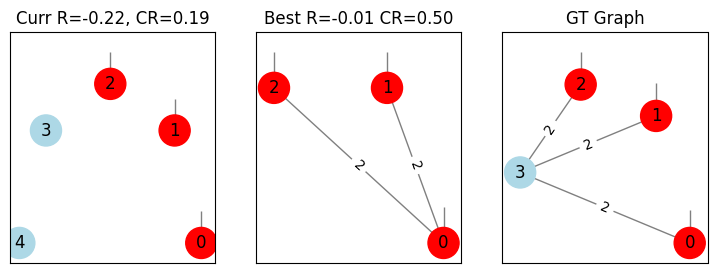

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -999.0059411397689, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0]
Action: increment:2:3 | Reward: -0.02815072308944289 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


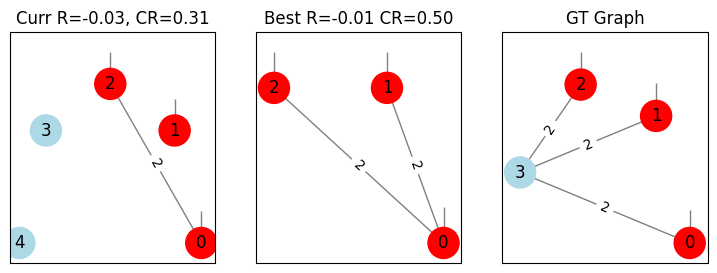

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, 0]
Action: increment:0:2 | Reward: -0.029669358326849245 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


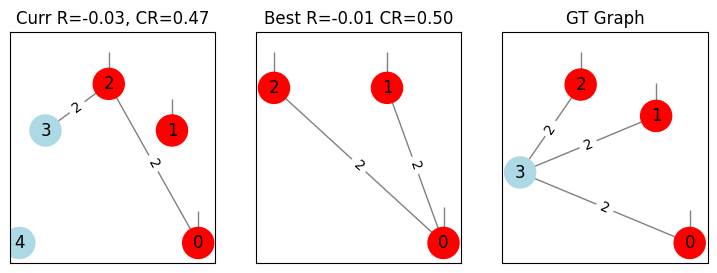

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0]
[Terminated] Action: increment:1:4 | Reward: -100000.02987084785 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.5


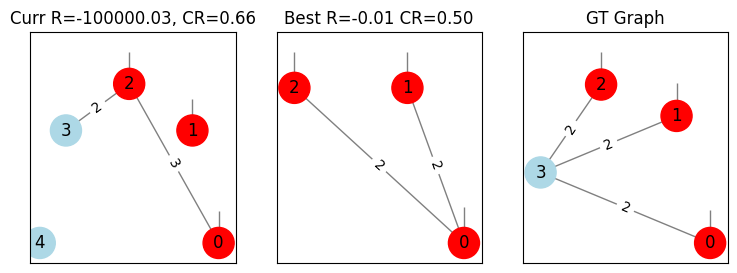

Problem 0, Agent sarsa: 100%|██████████| 5/5 [01:06<00:00, 13.25s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 0, Agent ql:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


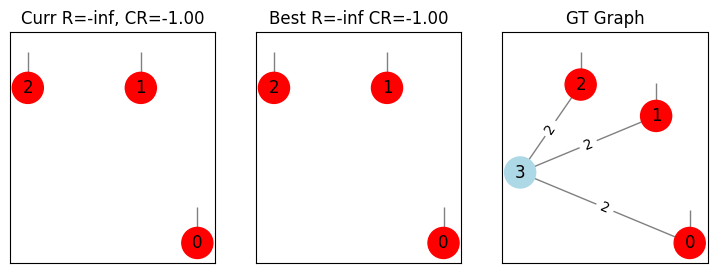

Action: addNode | Reward: -0.20725682202219387 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


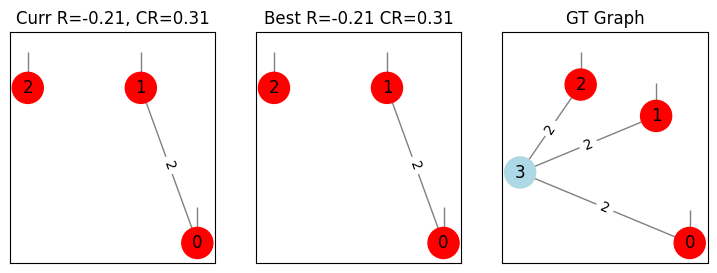

Action: increment:0:2 | Reward: -0.201509338669635 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


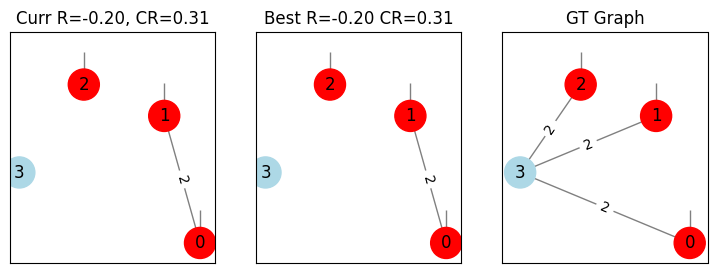

Action: increment:0:3 | Reward: -0.028158024440401084 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


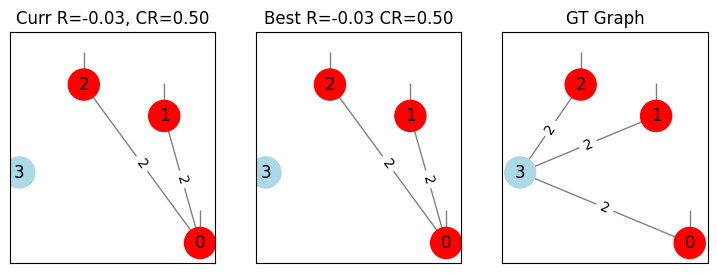

[Terminated] Action: increment:1:3 | Reward: -100000.00399588753 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


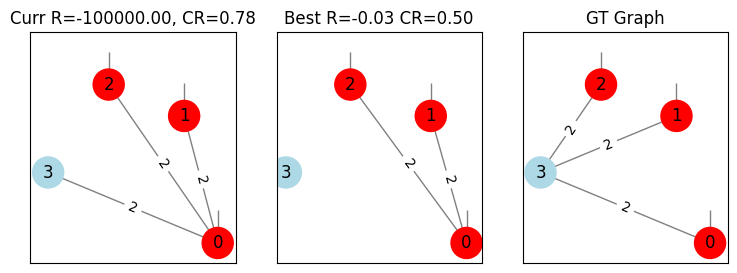

Problem 0, Agent ql:  20%|██        | 1/5 [00:16<01:04, 16.08s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


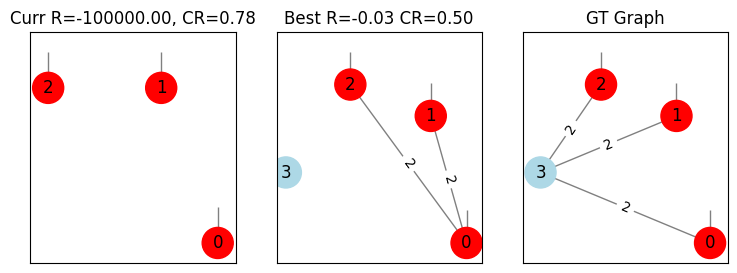

Action: increment:0:1 | Reward: -0.02926572689478156 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


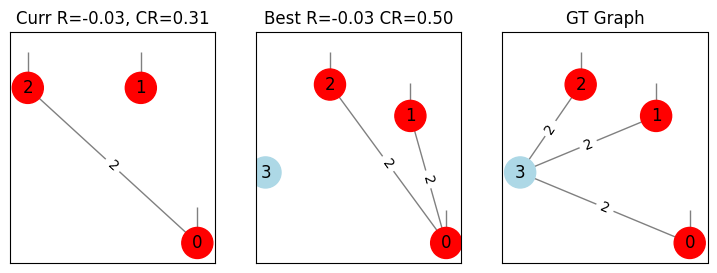

Action: increment:1:2 | Reward: -0.009085891816690922 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


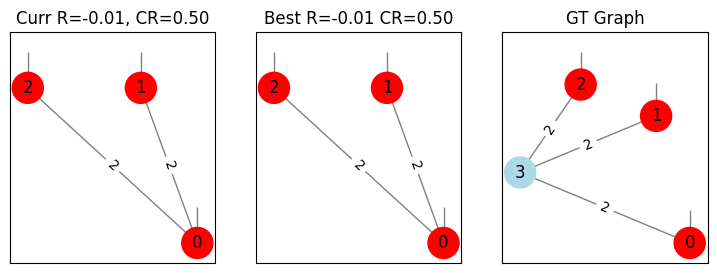

[Terminated] Action: addNode | Reward: -100000.0120517455 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


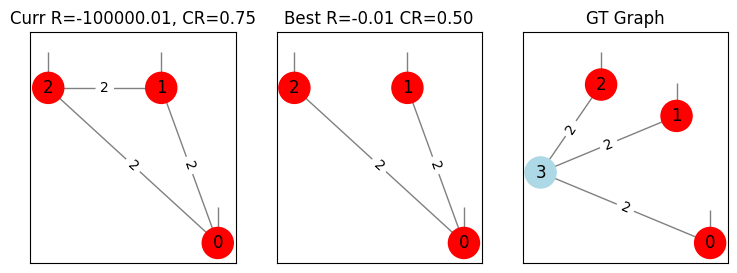

Problem 0, Agent ql:  40%|████      | 2/5 [00:31<00:47, 15.98s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


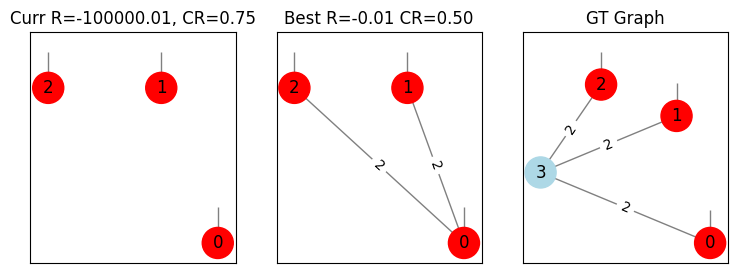

Action: addNode | Reward: -0.20725682202219387 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


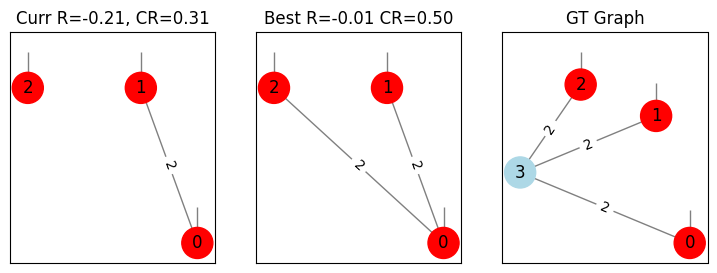

Action: increment:0:2 | Reward: -0.201509338669635 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


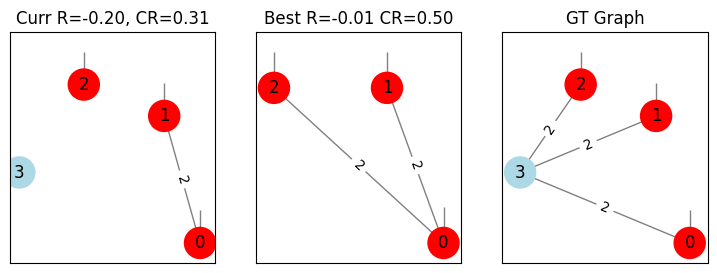

Action: increment:0:3 | Reward: -0.028158024440401084 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


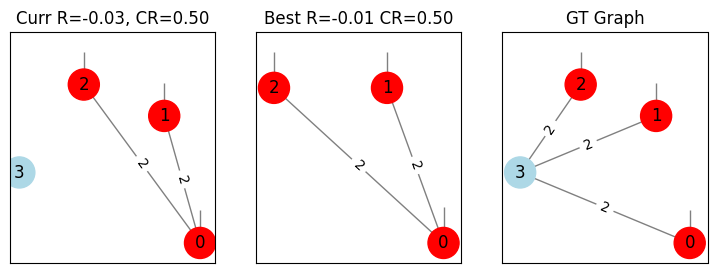

[Terminated] Action: increment:1:3 | Reward: -100000.00399588753 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


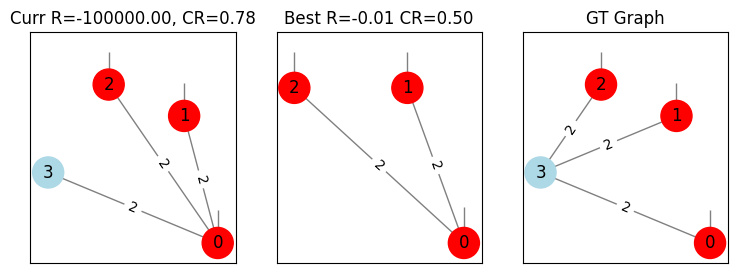

Problem 0, Agent ql:  60%|██████    | 3/5 [00:34<00:19,  9.98s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


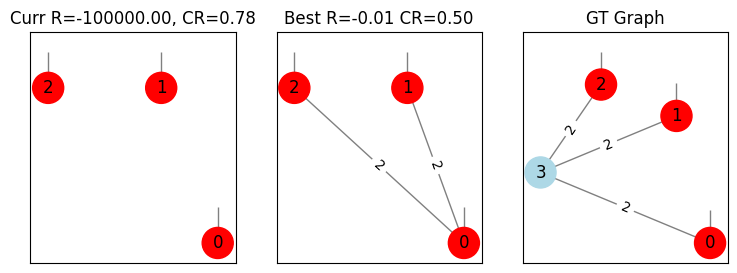

Action: addNode | Reward: -0.20725682202219387 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


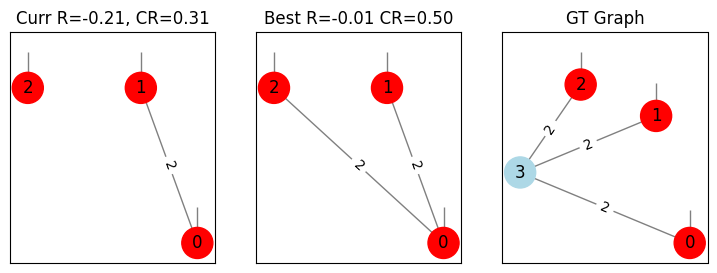

Action: increment:0:2 | Reward: -0.201509338669635 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


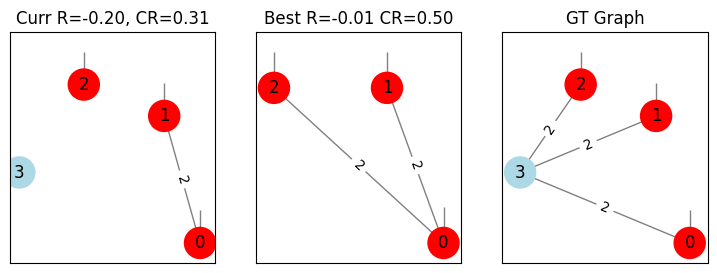

Action: increment:0:3 | Reward: -0.028158024440401084 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


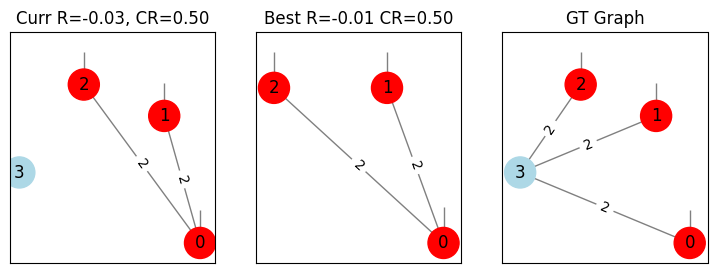

[Terminated] Action: increment:1:3 | Reward: -100000.00399588753 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.5


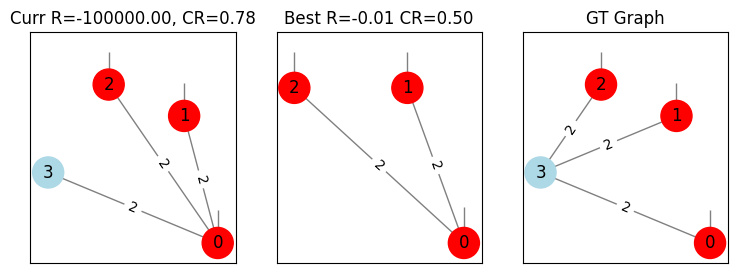

Problem 0, Agent ql:  80%|████████  | 4/5 [00:37<00:07,  7.29s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


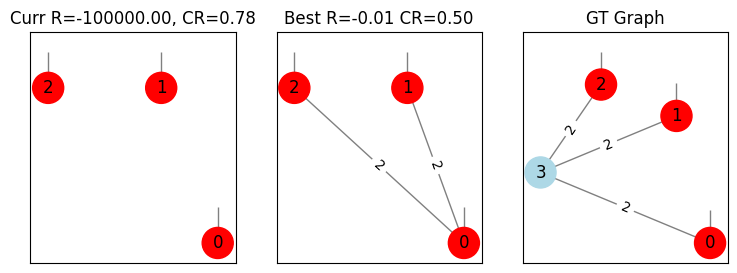

Action: increment:0:1 | Reward: -0.22400076561799256 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


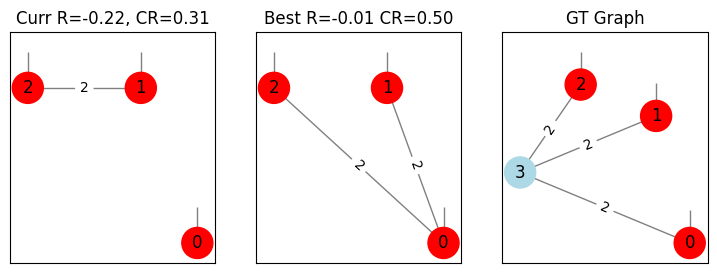

Action: increment:0:2 | Reward: -0.003871925542987024 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


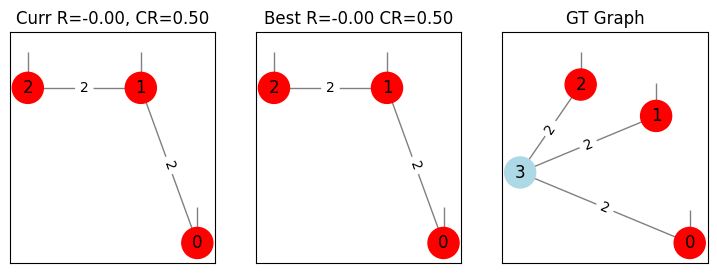

[Terminated] Action: increment:0:2 | Reward: -100000.0120517455 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.5


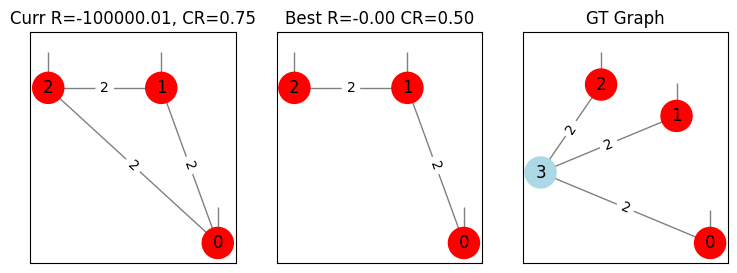

Problem 0, Agent ql: 100%|██████████| 5/5 [00:47<00:00,  9.58s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 1, Agent dqn:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


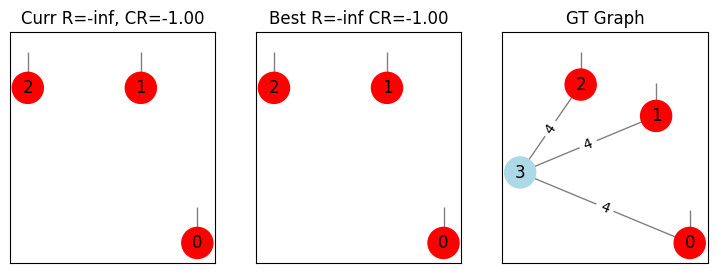

Action: addNode | Reward: -59.577886834790114 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


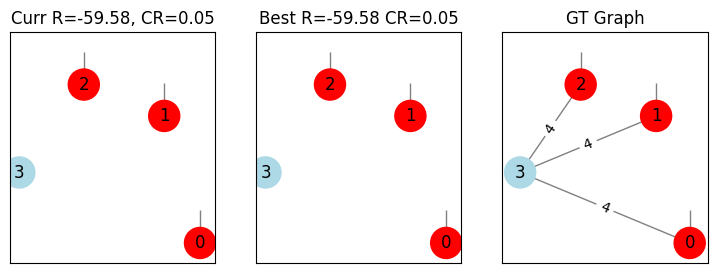

Action: increment:0:1 | Reward: -47.879788786913906 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


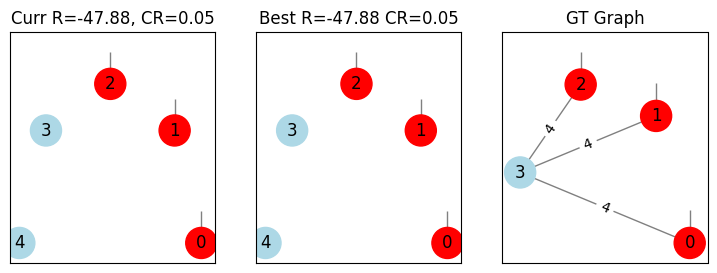

Action: increment:3:4 | Reward: -45.459731042696 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


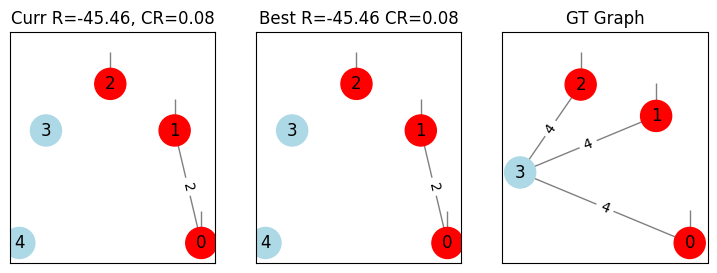

Action: increment:0:1 | Reward: -45.45947461274922 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


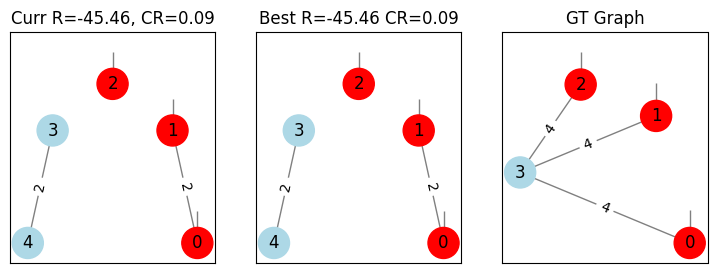

Action: addNode | Reward: -44.161813252976906 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


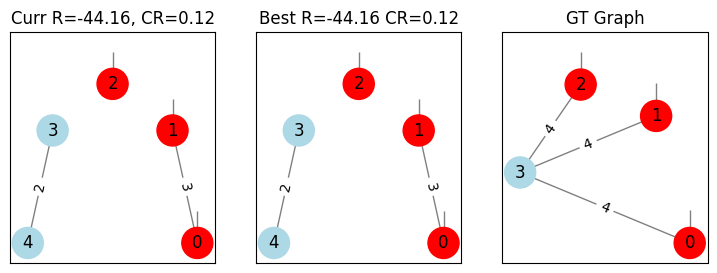

Action: addNode | Reward: -44.16190273408955 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


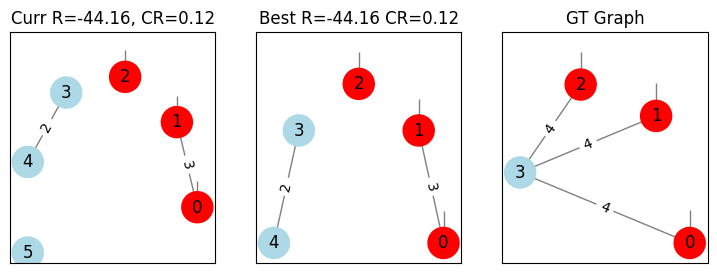

Action: increment:0:1 | Reward: -44.16262959318476 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.3125


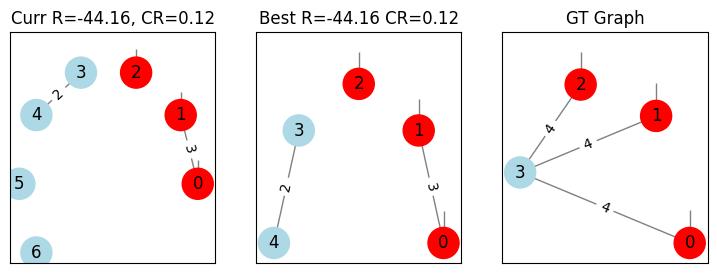

Action: increment:0:6 | Reward: -44.162497468068835 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.3125


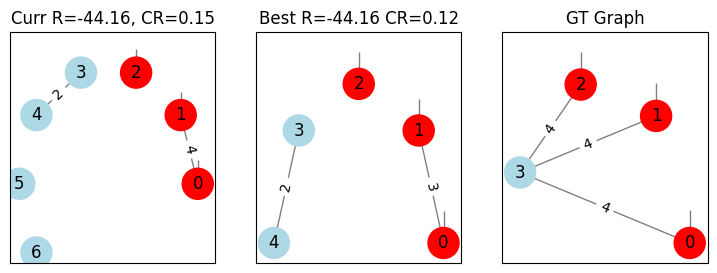

Action: increment:0:1 | Reward: -44.158761007092394 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.3125


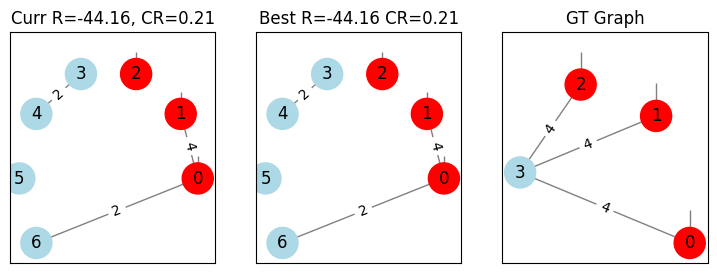

[Terminated] Action: increment:0:1 | Reward: -44.131801070489054 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.3125


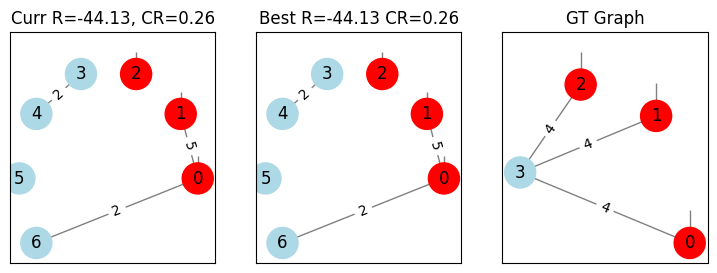

Problem 1, Agent dqn:  20%|██        | 1/5 [01:09<04:39, 69.94s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


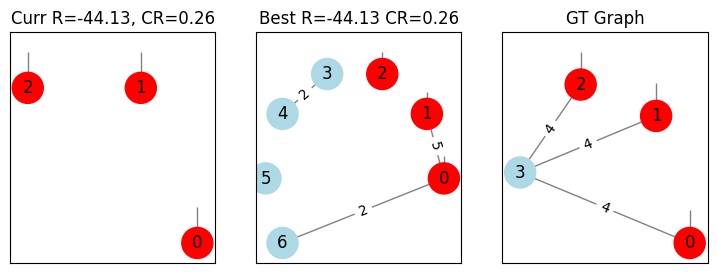

Action: increment:0:1 | Reward: -59.577886834790114 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


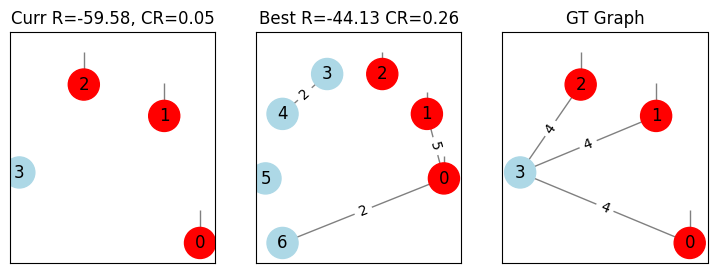

Action: increment:0:1 | Reward: -45.460393156334845 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


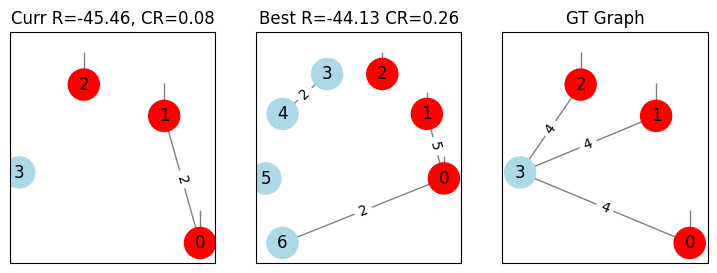

Action: increment:0:1 | Reward: -44.16261118541506 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


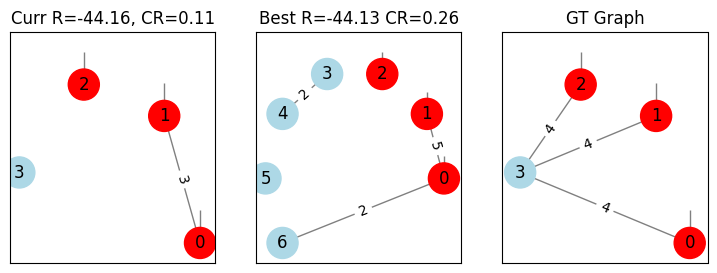

Action: increment:0:1 | Reward: -44.144190040576916 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


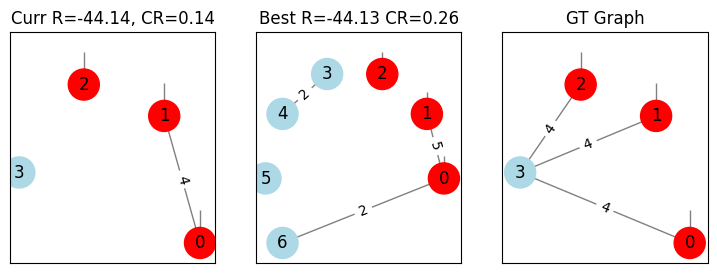

Action: increment:0:1 | Reward: -44.14191859705 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


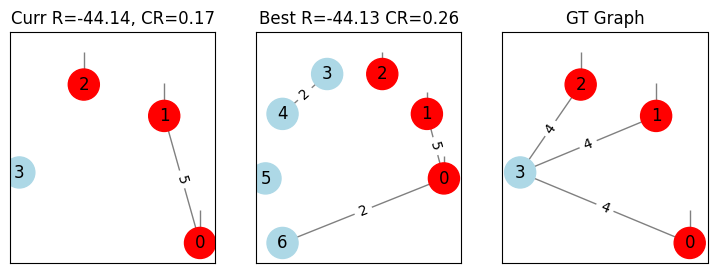

Action: increment:0:1 | Reward: -44.13330495683942 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


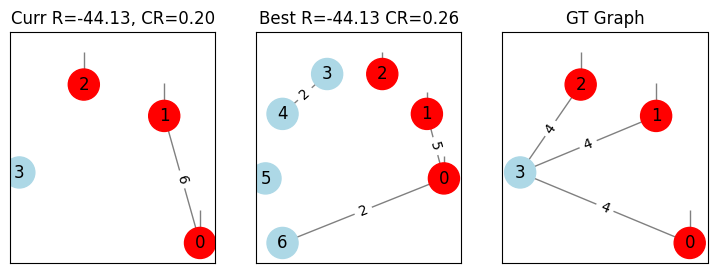

Action: increment:0:1 | Reward: -44.13309361900146 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


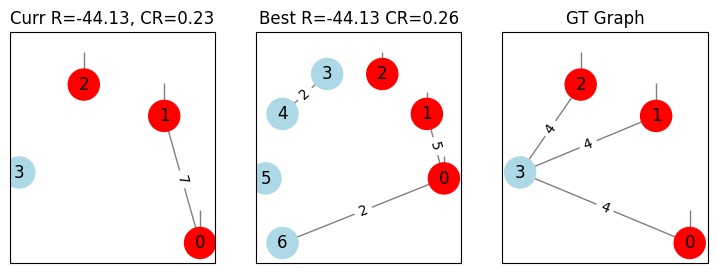

Action: increment:0:1 | Reward: -44.131515266244 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


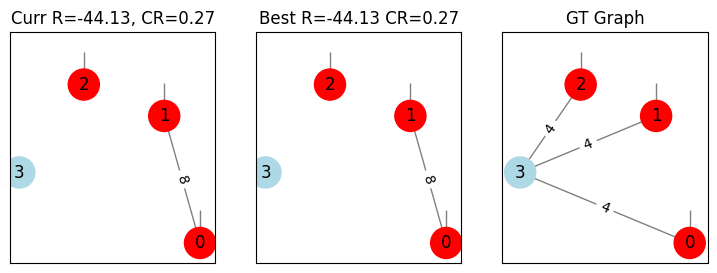

Action: increment:0:2 | Reward: -44.13063985915561 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


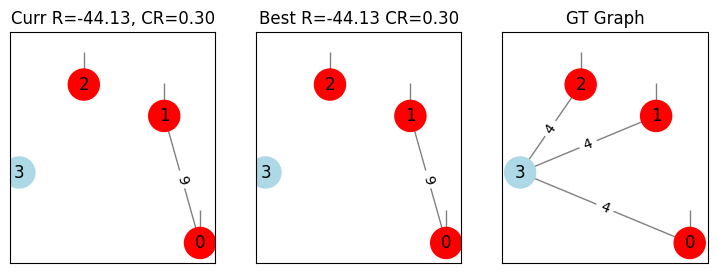

[Terminated] Action: increment:0:2 | Reward: -100018.1339456839 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


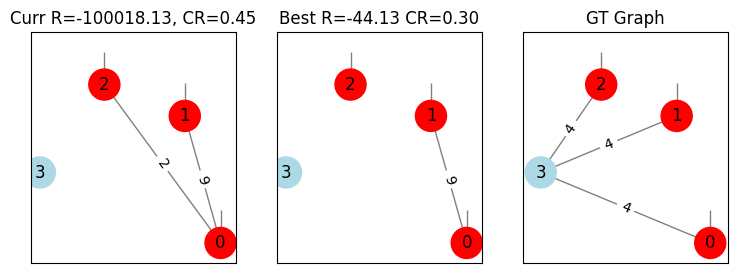

Problem 1, Agent dqn:  40%|████      | 2/5 [01:59<02:53, 57.73s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


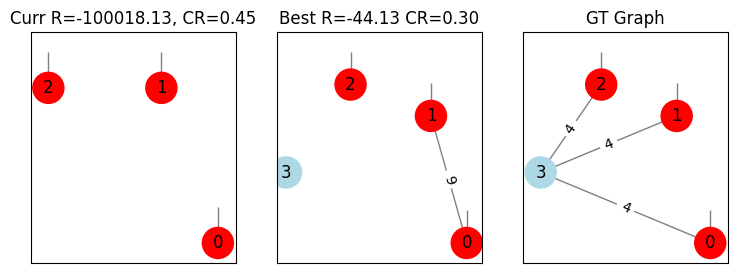

Action: addNode | Reward: -59.577886834790114 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


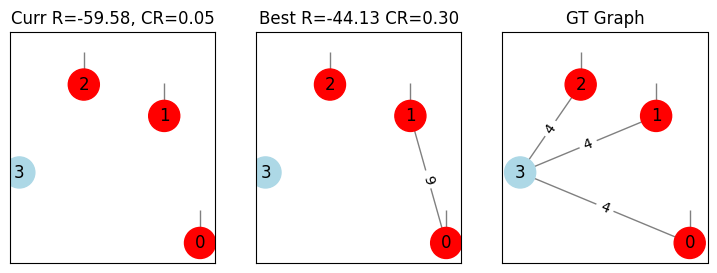

Action: increment:0:1 | Reward: -47.879788786913906 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


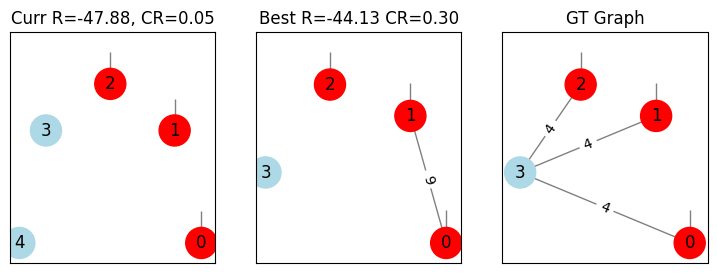

Action: increment:0:1 | Reward: -45.459731042696 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


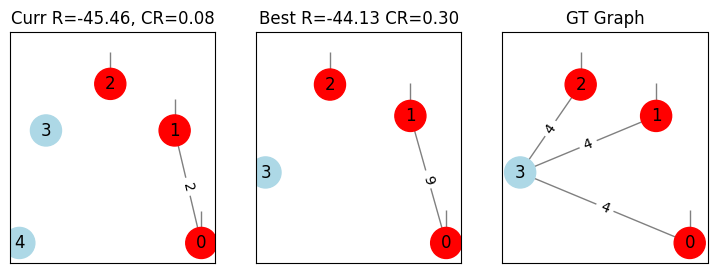

Action: increment:0:1 | Reward: -44.16407713103442 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


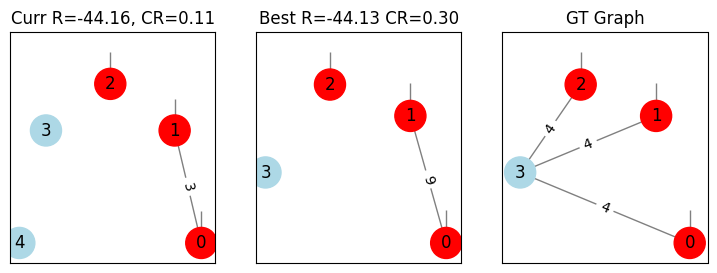

Action: increment:0:1 | Reward: -44.130918234678795 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


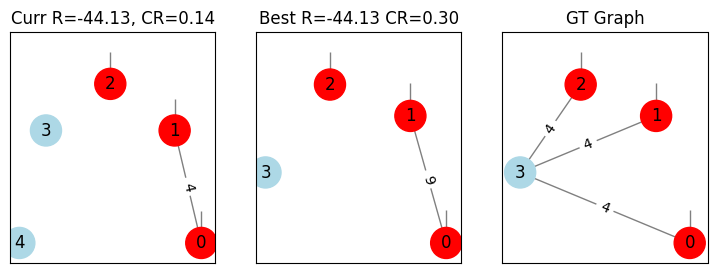

Action: increment:0:1 | Reward: -44.13538680100745 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


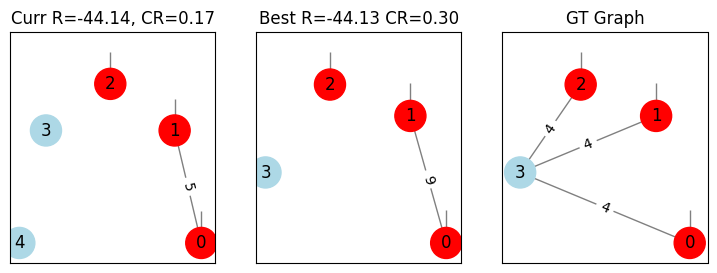

Action: increment:0:1 | Reward: -44.13147166826385 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


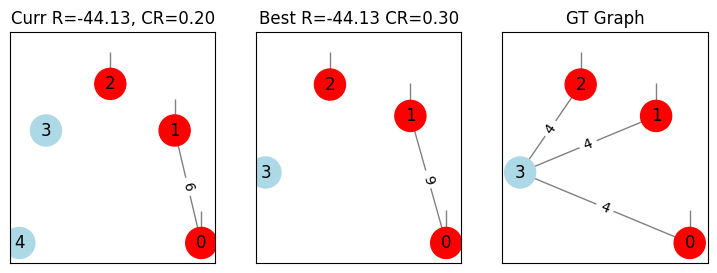

Action: increment:0:1 | Reward: -44.130225123553764 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


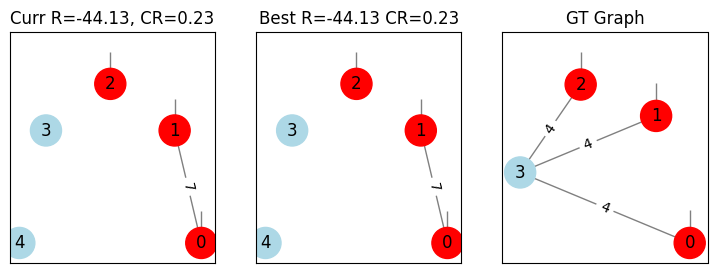

Action: increment:0:1 | Reward: -44.129315883181505 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


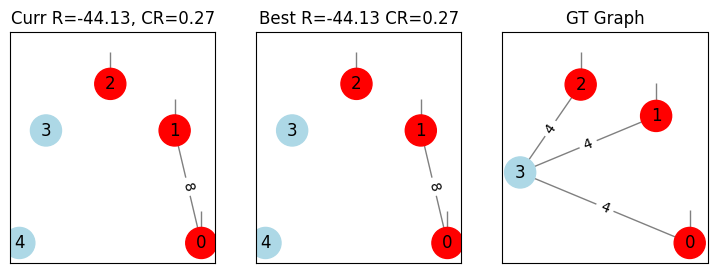

[Terminated] Action: increment:2:3 | Reward: -44.129068022885306 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


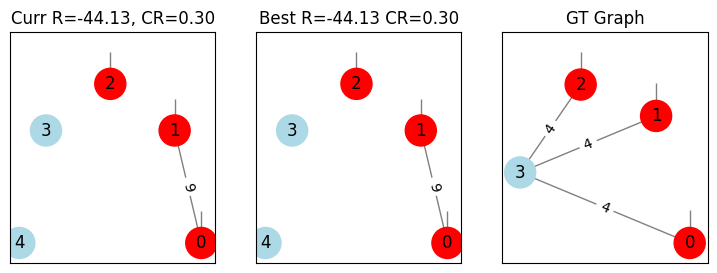

Problem 1, Agent dqn:  60%|██████    | 3/5 [02:40<01:40, 50.47s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


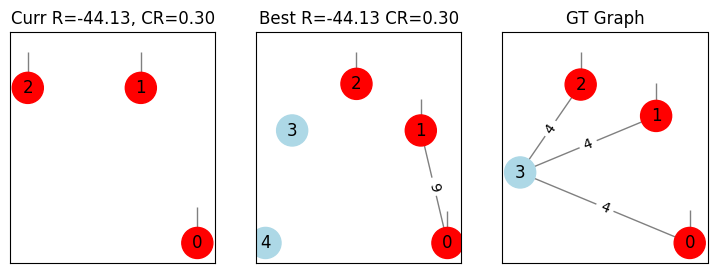

Action: addNode | Reward: -59.577886834790114 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


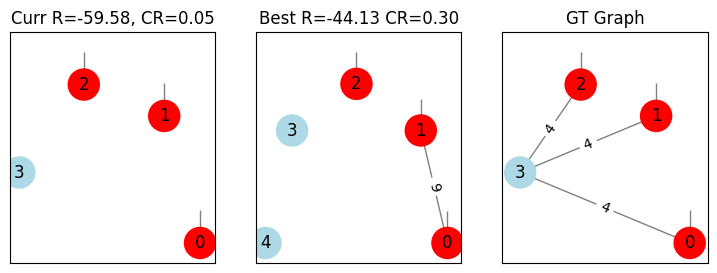

Action: increment:0:1 | Reward: -47.879788786913906 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


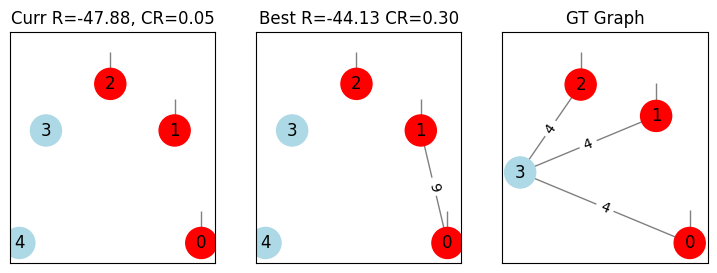

Action: increment:0:1 | Reward: -45.459731042696 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


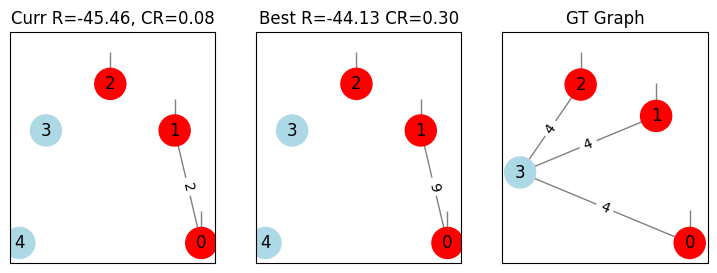

Action: increment:0:1 | Reward: -44.16407713103442 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


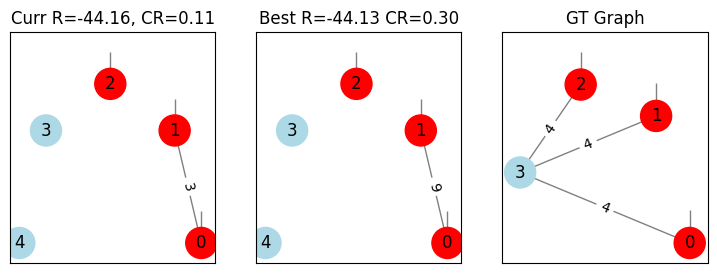

Action: increment:0:1 | Reward: -44.130918234678795 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


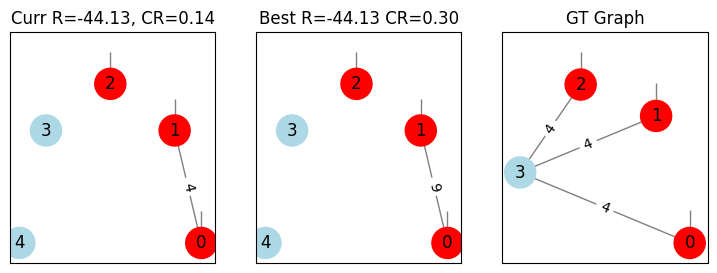

Action: increment:0:3 | Reward: -44.13538680100745 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


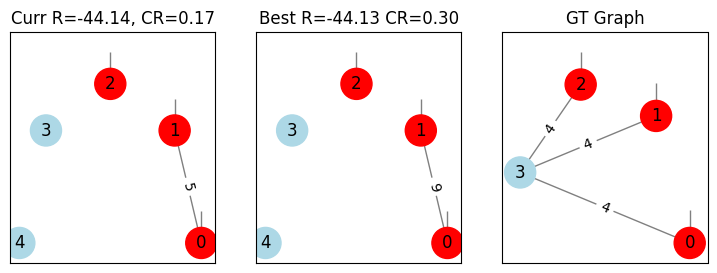

Action: increment:1:2 | Reward: -44.129084299943955 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


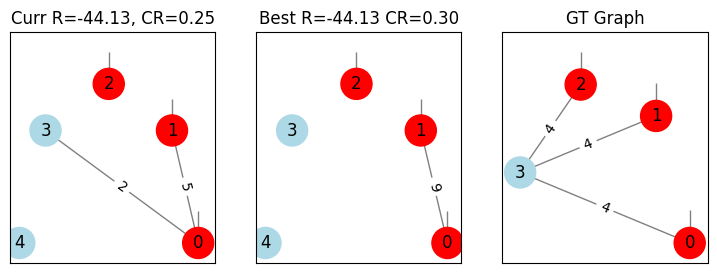

[Terminated] Action: increment:0:1 | Reward: -100018.1333050458 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


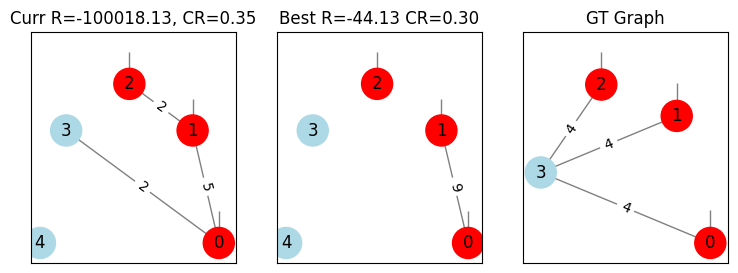

Problem 1, Agent dqn:  80%|████████  | 4/5 [02:57<00:37, 37.27s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


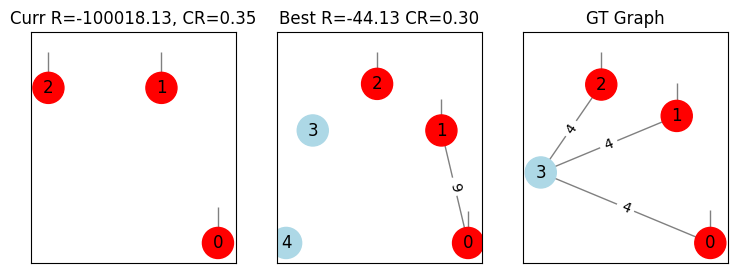

Action: addNode | Reward: -59.577886834790114 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


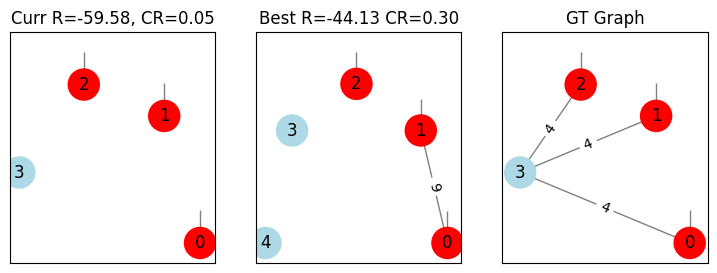

Action: increment:0:1 | Reward: -47.879788786913906 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


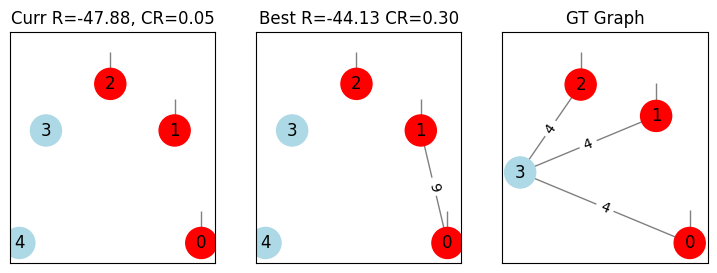

Action: increment:0:1 | Reward: -45.459731042696 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


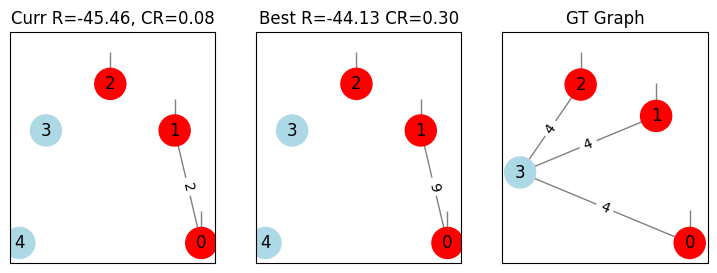

Action: increment:0:1 | Reward: -44.16407713103442 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


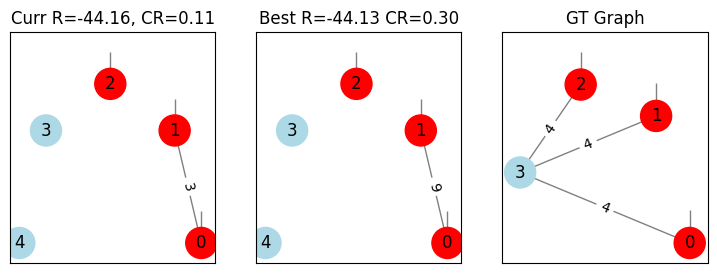

Action: increment:0:1 | Reward: -44.130918234678795 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


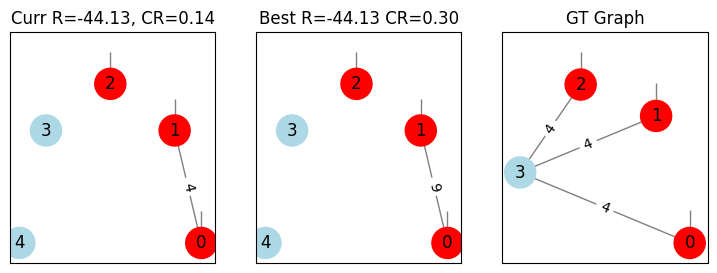

Action: increment:0:1 | Reward: -44.13538680100745 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


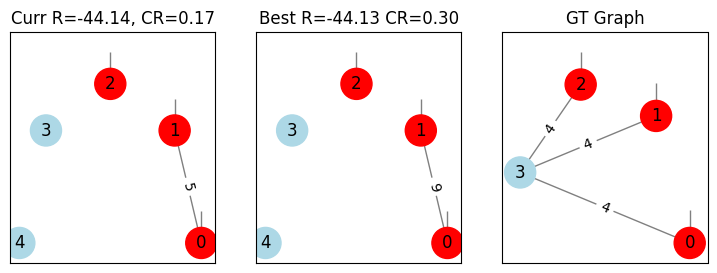

Action: increment:0:1 | Reward: -44.13147166826385 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


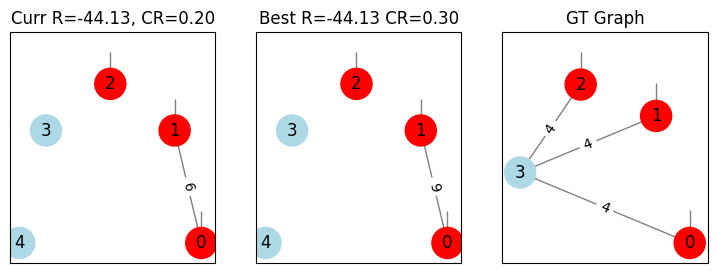

Action: increment:0:1 | Reward: -44.130225123553764 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


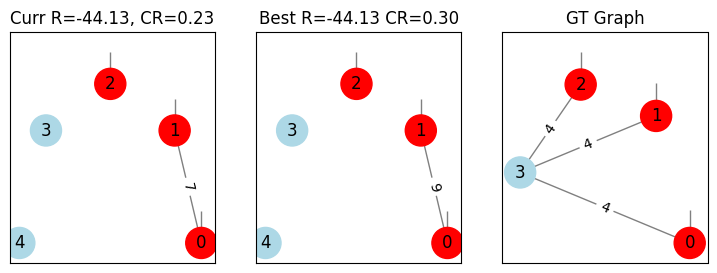

Action: increment:0:1 | Reward: -44.129315883181505 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


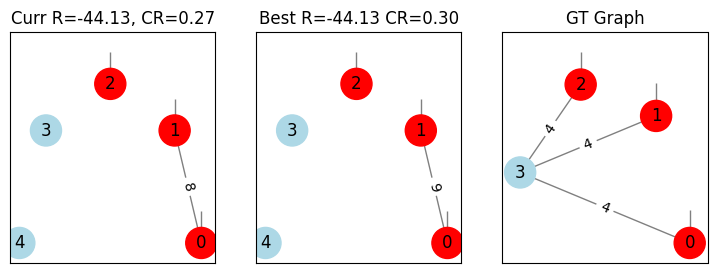

[Terminated] Action: increment:0:2 | Reward: -44.129068022885306 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


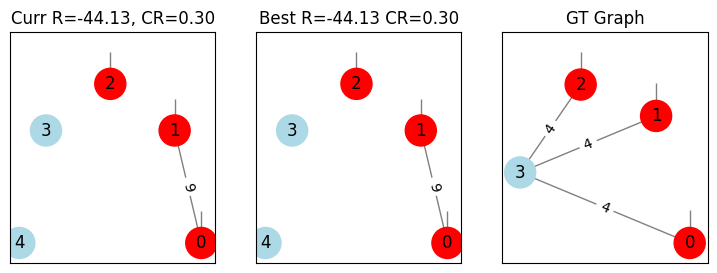

Problem 1, Agent dqn: 100%|██████████| 5/5 [03:04<00:00, 36.92s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 1, Agent sarsa:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


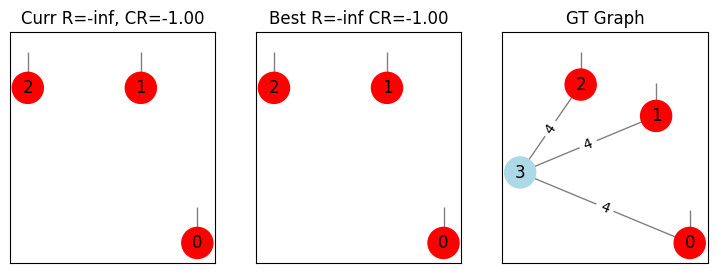

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, 0]
Action: increment:0:2 | Reward: -40.55637867698065 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


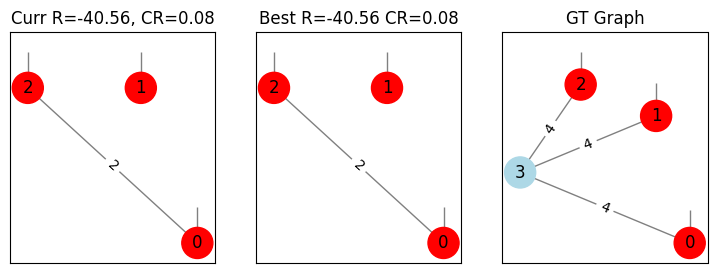

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, 0]
Action: increment:0:1 | Reward: -39.985811947878766 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


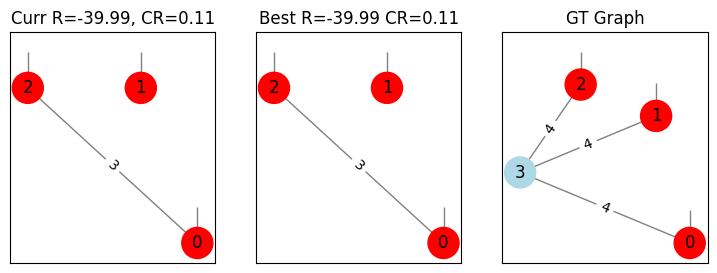

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, 0]
Action: addNode | Reward: -16.14347253086947 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


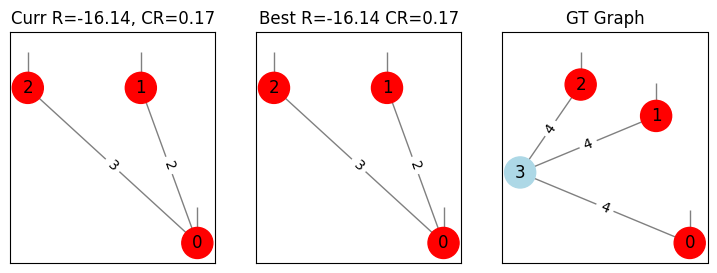

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, 0]
Action: addNode | Reward: -16.143753923395998 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


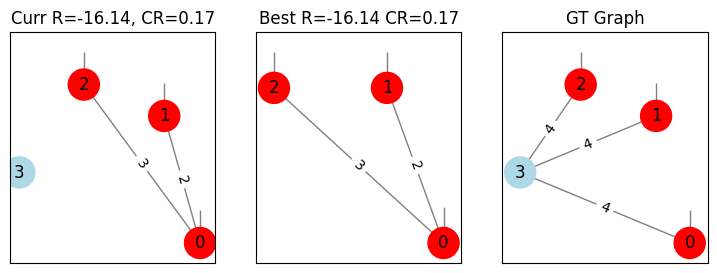

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, 0]
Action: increment:0:3 | Reward: -16.143693802077916 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


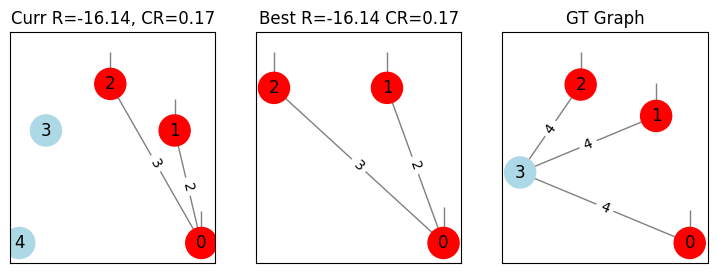

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, 0]
Action: increment:3:4 | Reward: -16.142985000388858 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


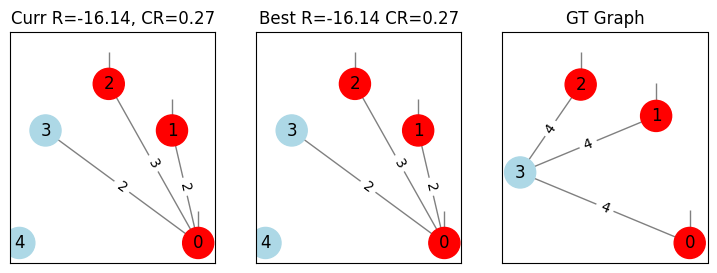

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, 0]
Action: increment:1:4 | Reward: -16.143660900523678 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


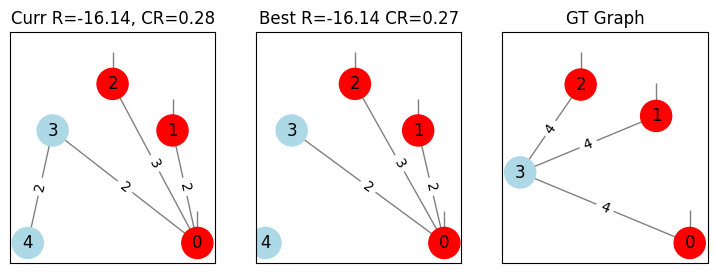

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, 0]
Action: increment:0:3 | Reward: -1.804371055318264 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


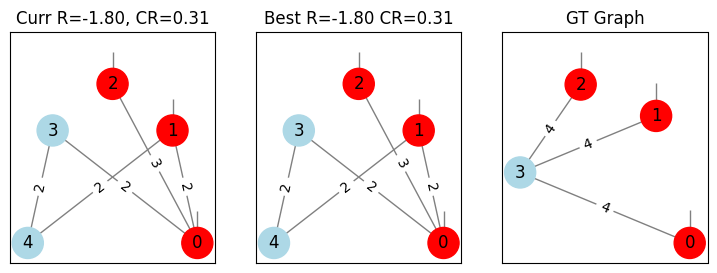

SARSA Agent q_vals:
[-0.08875874497095872, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
[Terminated] Action: increment:0:3 | Reward: -100001.80335896209 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


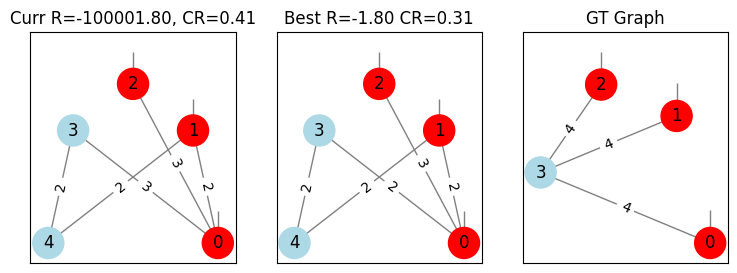

Problem 1, Agent sarsa:  20%|██        | 1/5 [00:56<03:45, 56.34s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


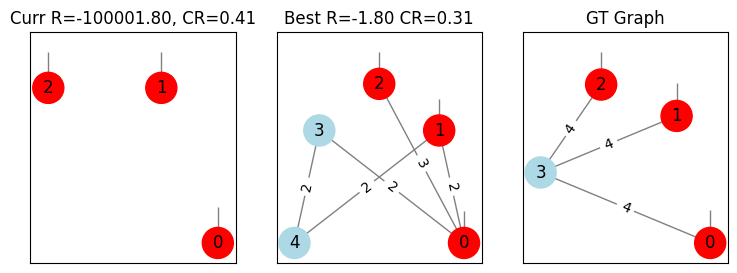

SARSA Agent q_vals:
[-6.045461582749579, -0.07784763321545697, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
Action: addNode | Reward: -59.57801733717491 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


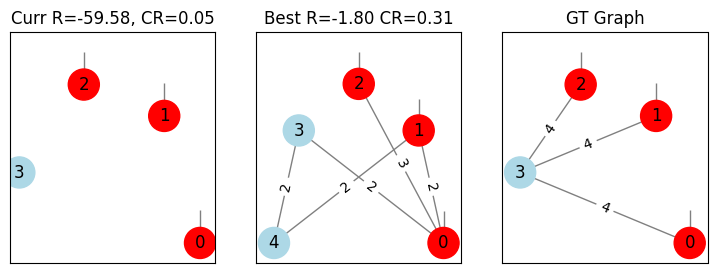

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -0.022395783041377113, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
Action: increment:0:3 | Reward: -59.57757460268802 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


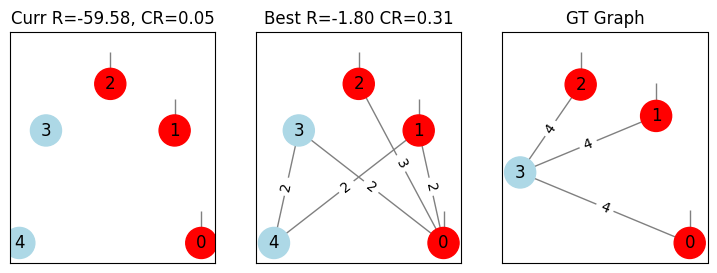

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -0.022465944396881817, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
Action: increment:2:3 | Reward: -59.57751050749463 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


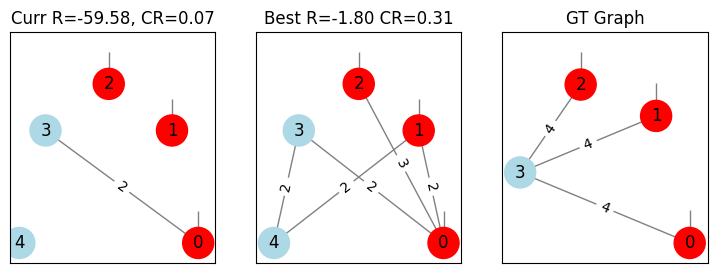

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -10000.003005482453, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
Bad action retaken (2)
Options: ['UNK', 'UNK', 'UNK', -10000.003005482453, 'UNK', 'UNK', 'UNK', 'UNK', 'UNK', 'UNK']
Action: increment:0:4 | Reward: -40.55601132862175 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


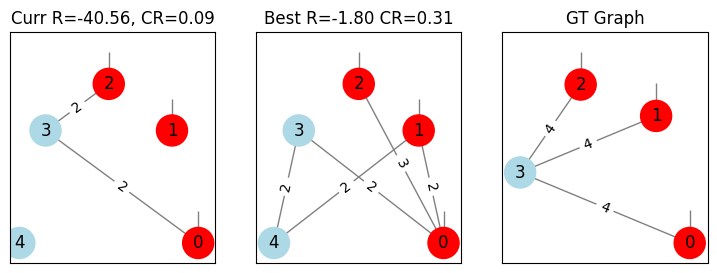

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -9004.058226252439, 0, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0]
Action: increment:0:2 | Reward: -40.555213182311924 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


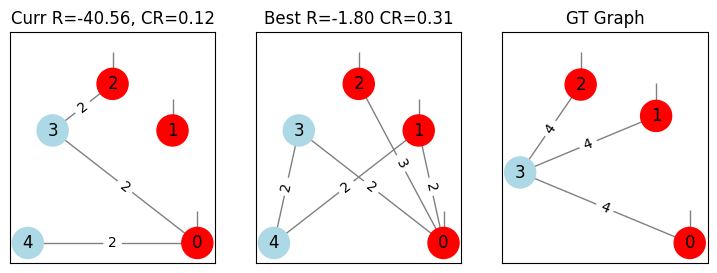

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, 0]
Action: increment:0:2 | Reward: -40.554048967368054 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


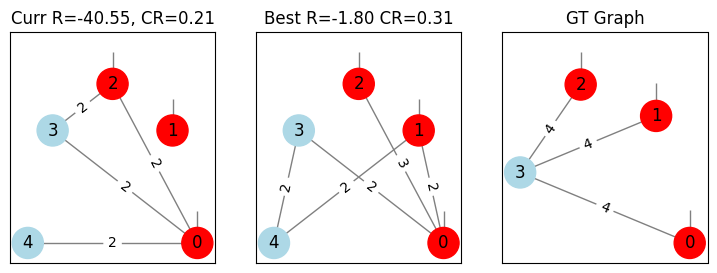

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, 0]
Action: increment:0:3 | Reward: -39.94701836896697 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


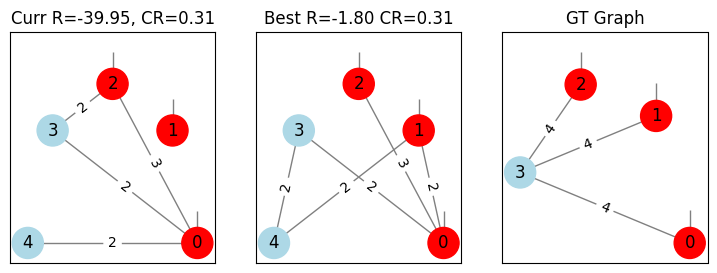

SARSA Agent q_vals:
[-6.045461582749579, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0]
[Terminated] Action: increment:2:3 | Reward: -100039.94670882635 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


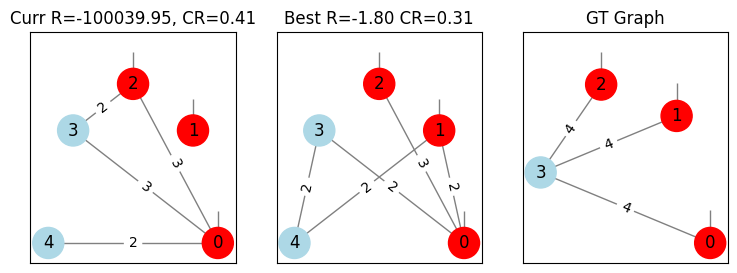

Problem 1, Agent sarsa:  40%|████      | 2/5 [01:44<02:34, 51.42s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


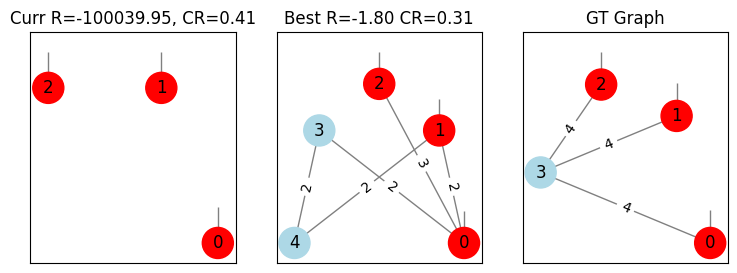

SARSA Agent q_vals:
[-12.001119919314078, -6.030057668888547, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0]
Action: addNode | Reward: -59.57801733717491 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


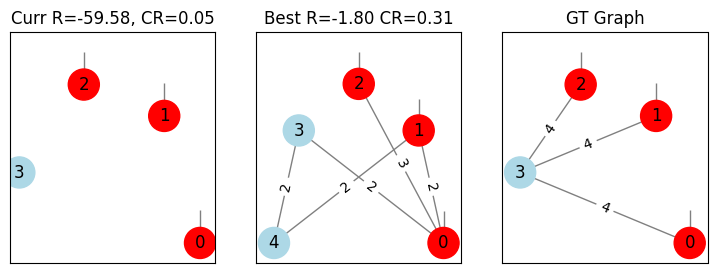

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, 0]
Action: increment:0:1 | Reward: -59.57757460268802 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


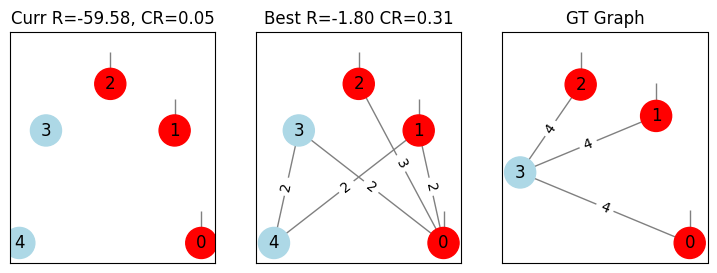

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, 0]
Action: increment:2:3 | Reward: -45.46142052040271 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


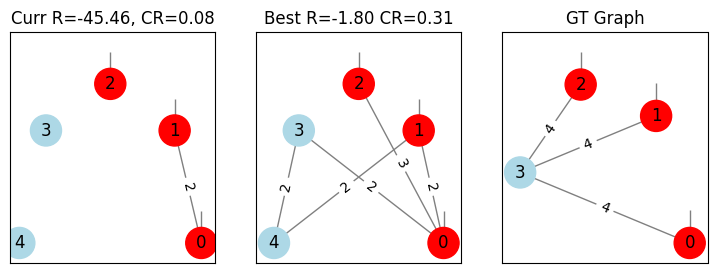

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, 0]
Action: increment:0:3 | Reward: -45.46254229033016 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


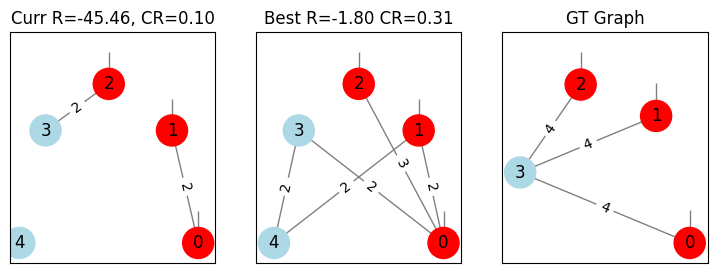

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, 0]
Action: increment:2:3 | Reward: -22.236273587472084 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


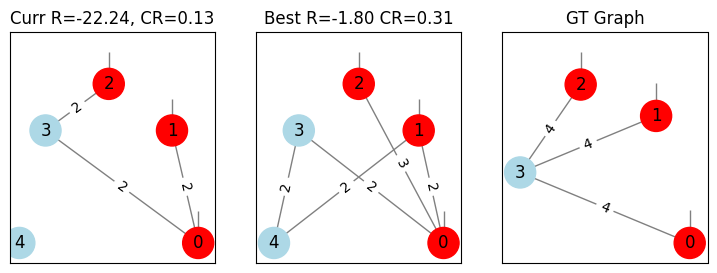

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, 0]
Action: increment:0:1 | Reward: -22.235821252927337 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


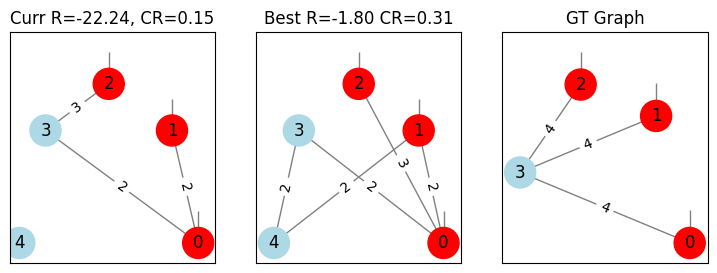

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, 0]
Action: increment:0:1 | Reward: -18.701340875654793 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


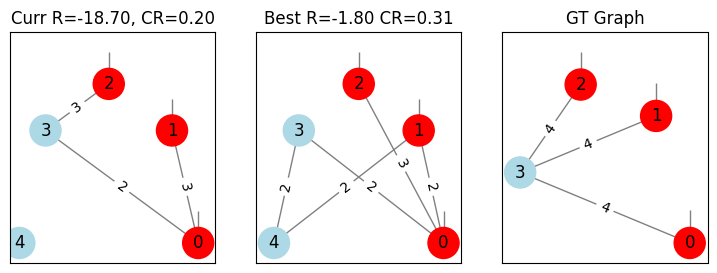

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, 0]
Action: increment:1:3 | Reward: -18.132534876611658 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


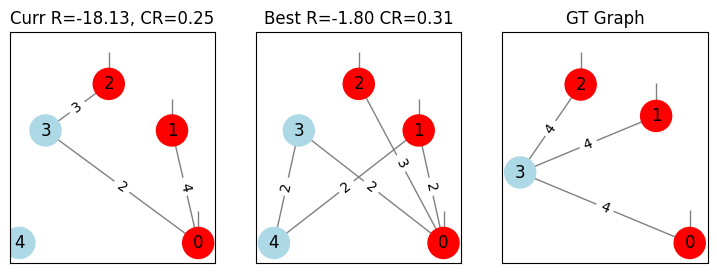

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -4.055637867698065, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0]
[Terminated] Action: increment:0:3 | Reward: -100001.8138048535 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


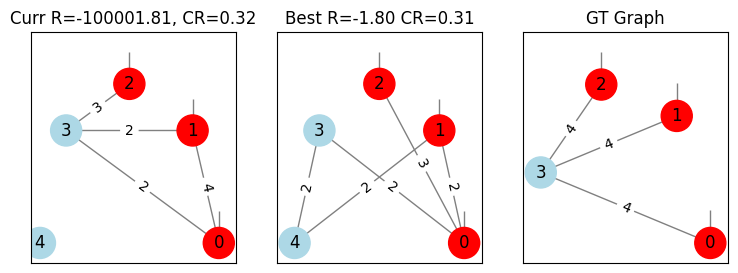

Problem 1, Agent sarsa:  60%|██████    | 3/5 [02:35<01:42, 51.23s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


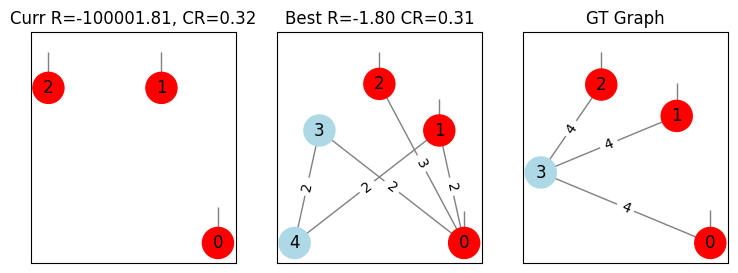

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -3.9985811947878767, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0]
Action: increment:0:2 | Reward: -40.55637867698065 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


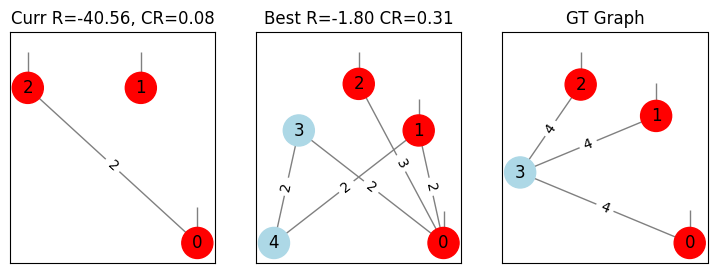

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -1.6143472530869472, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0]
Action: increment:0:1 | Reward: -39.985811947878766 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


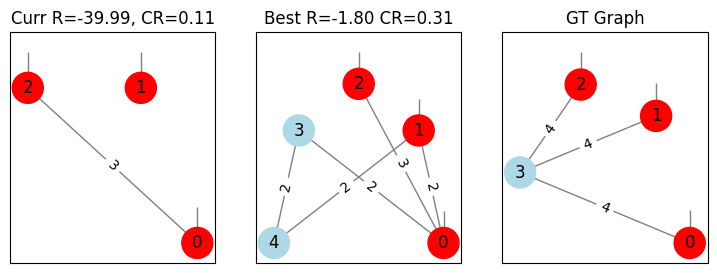

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -1.6143753923395998, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0]
Action: addNode | Reward: -16.14347253086947 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


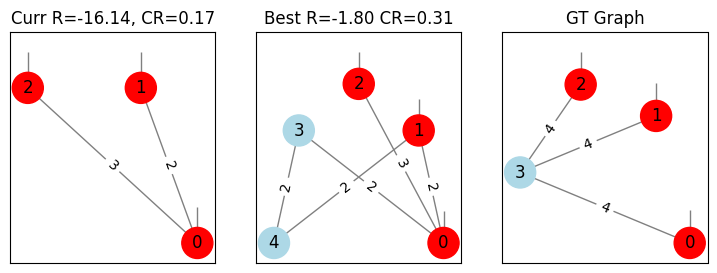

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, 0]
Action: increment:0:2 | Reward: -16.143753923395998 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


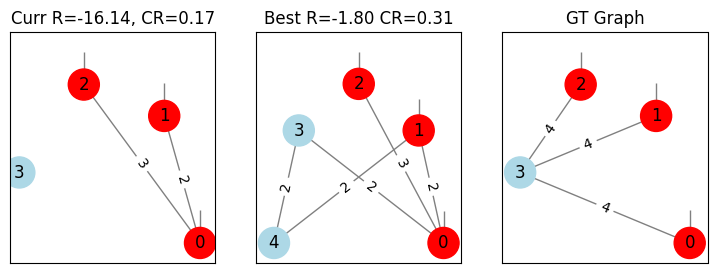

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, 0]
Action: increment:0:1 | Reward: -15.039735887468 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


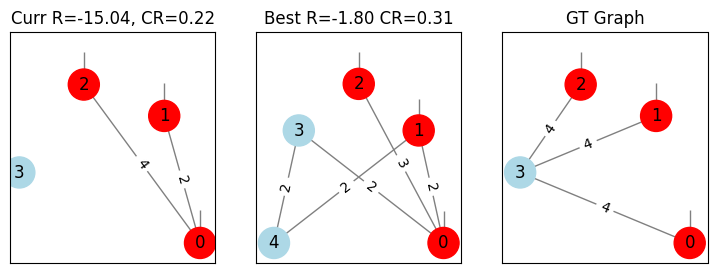

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, 0]
Action: increment:0:1 | Reward: -1.111514691430362 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


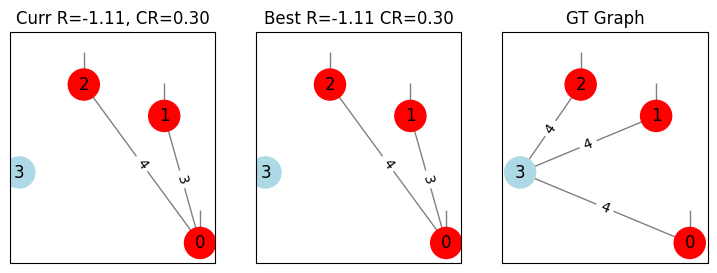

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -0.021723528831189515, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0]
[Terminated] Action: increment:0:2 | Reward: -100000.00566842518 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


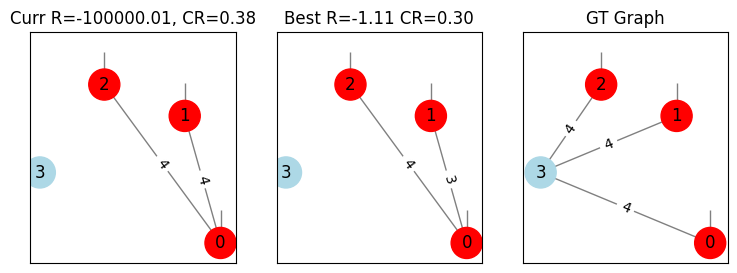

Problem 1, Agent sarsa:  80%|████████  | 4/5 [02:57<00:39, 39.59s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


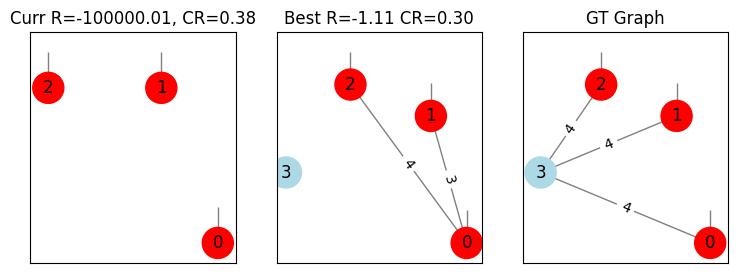

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, 0]
Action: addNode | Reward: -45.46186203361557 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


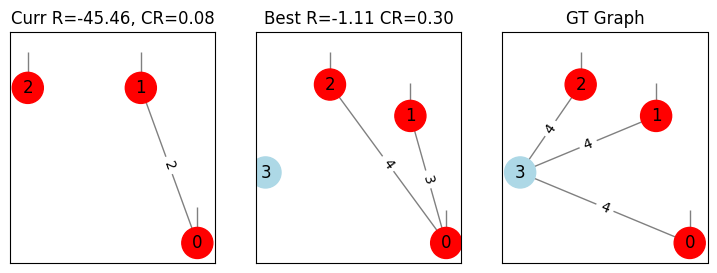

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, 0]
Action: increment:0:1 | Reward: -45.460663734025914 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


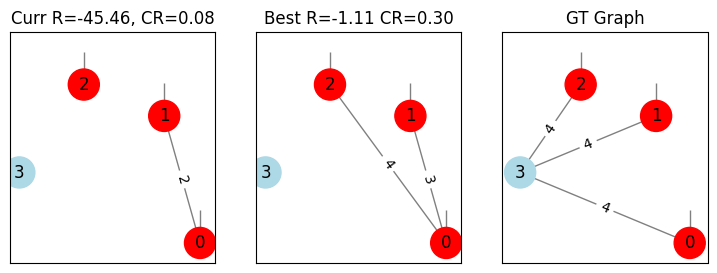

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, 0]
Action: increment:0:1 | Reward: -44.16337766451986 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


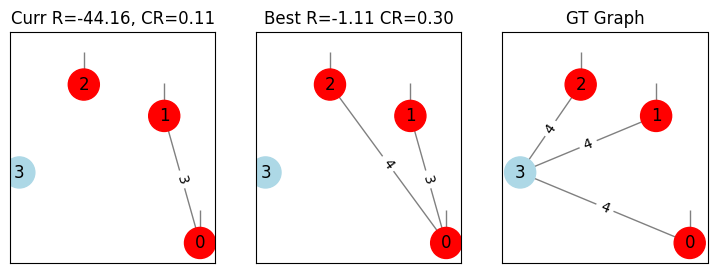

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, 0]
Action: increment:0:3 | Reward: -44.13058127528364 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125

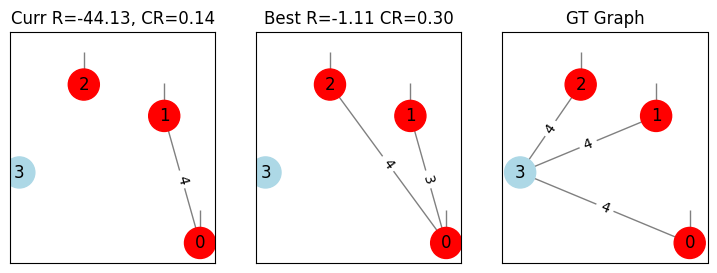

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, 0]
Action: increment:0:2 | Reward: -44.16193689309877 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compressi

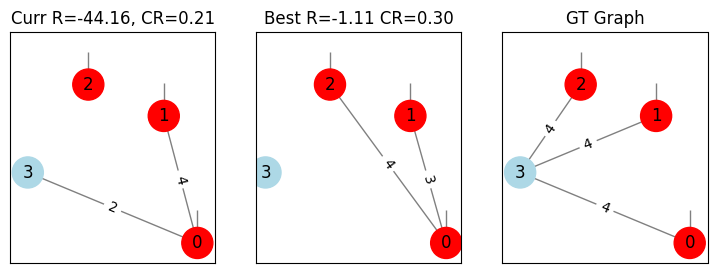

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0]
[Terminated] Action: increment:2:3 | Reward: -100018.13274508926 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2',

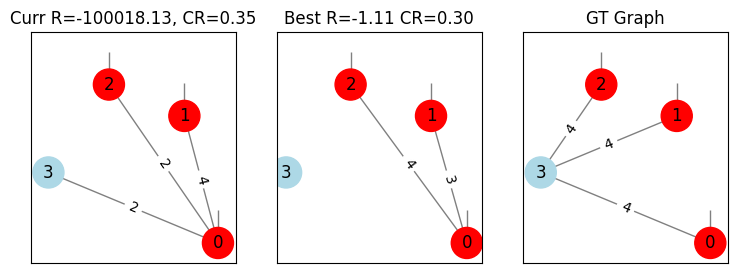

Problem 1, Agent sarsa: 100%|██████████| 5/5 [03:34<00:00, 42.91s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 1, Agent ql:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


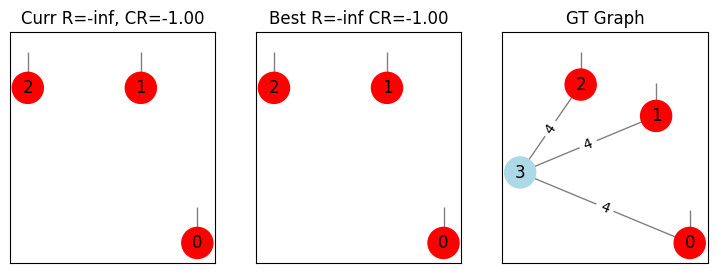

Action: increment:0:1 | Reward: -45.31826684535736 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


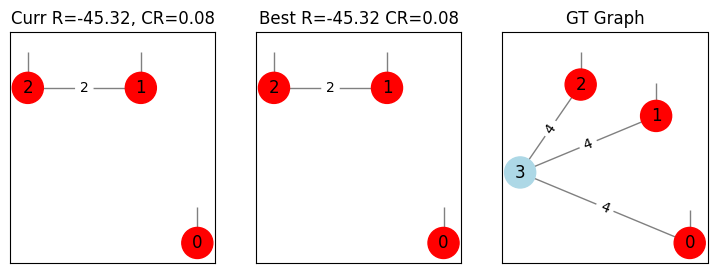

Action: increment:1:2 | Reward: -24.67178526254329 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


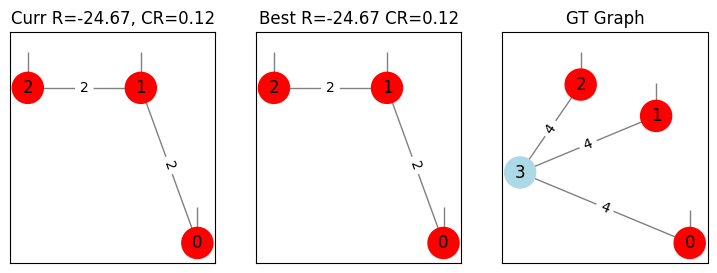

Action: increment:1:2 | Reward: -16.56483768988166 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


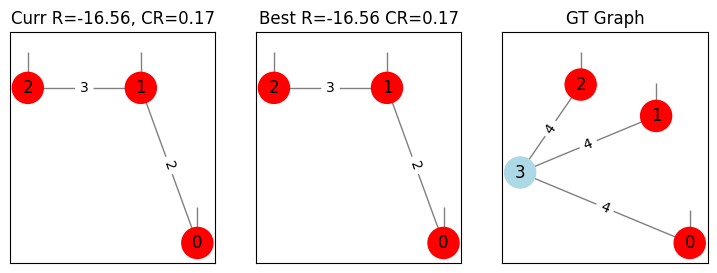

Action: addNode | Reward: -15.571739487628482 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


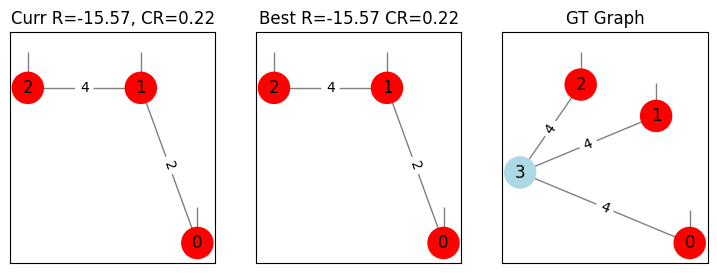

Action: increment:0:1 | Reward: -15.570943563467983 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


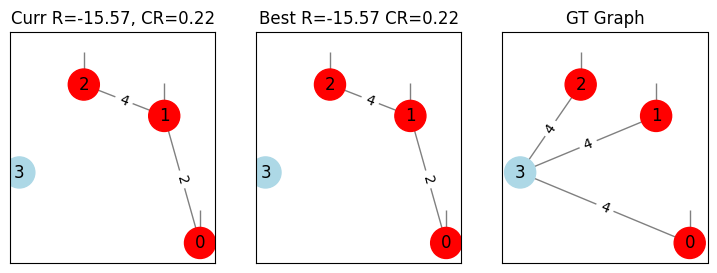

Action: increment:0:1 | Reward: -3.786476813720679 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


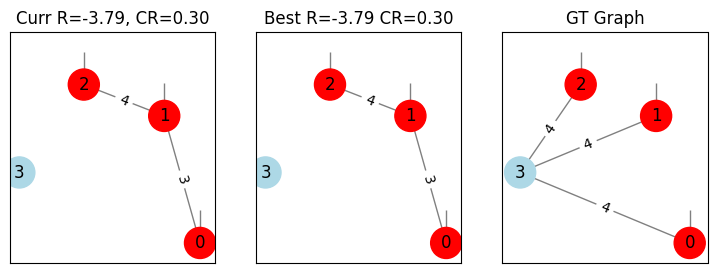

[Terminated] Action: increment:2:3 | Reward: -100000.00468630614 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


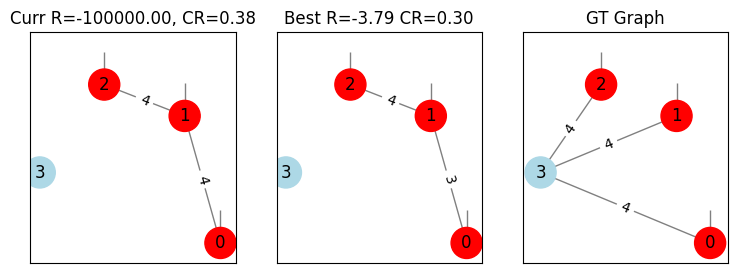

Problem 1, Agent ql:  20%|██        | 1/5 [00:43<02:52, 43.15s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


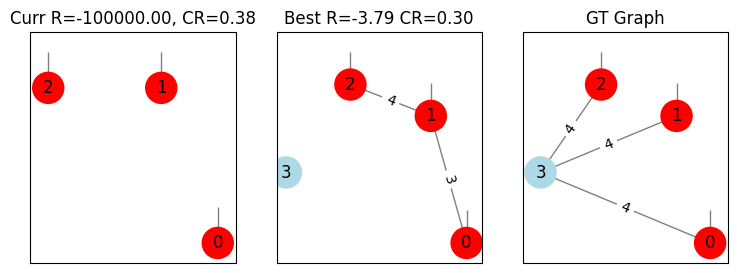

Action: addNode | Reward: -47.8798687456525 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


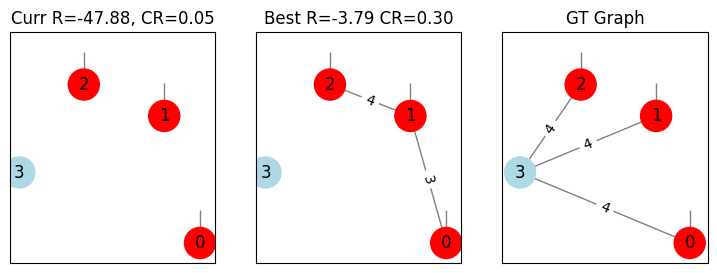

Action: increment:0:2 | Reward: -59.57844105652819 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


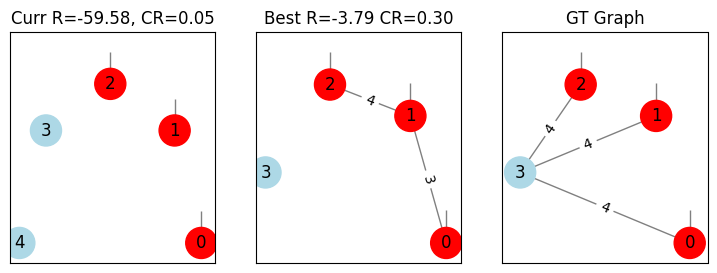

Action: increment:0:4 | Reward: -40.55603496796908 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


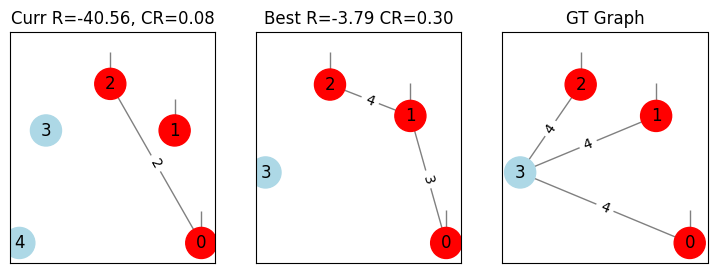

Action: increment:1:3 | Reward: -40.555940893358624 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


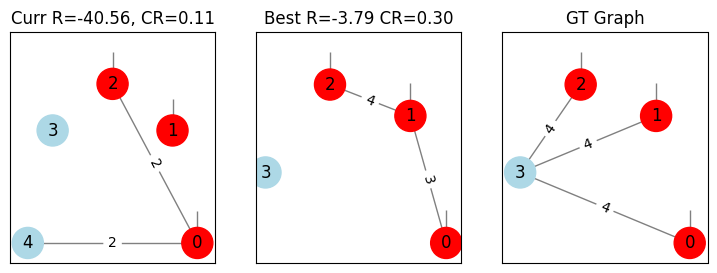

Action: increment:0:2 | Reward: -40.55532137927585 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


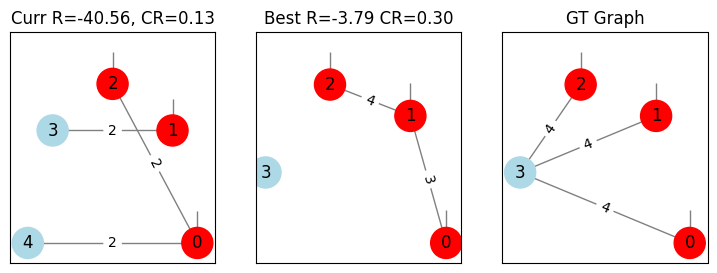

Action: increment:1:3 | Reward: -39.98744057717104 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


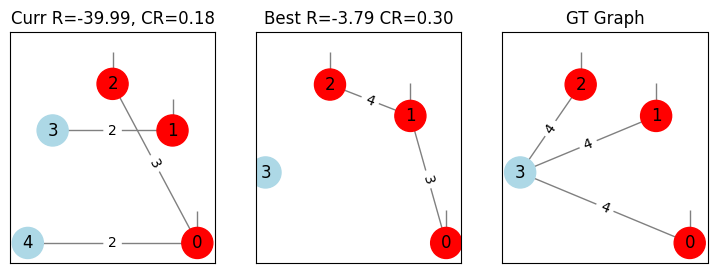

Action: increment:1:2 | Reward: -39.98607550689332 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


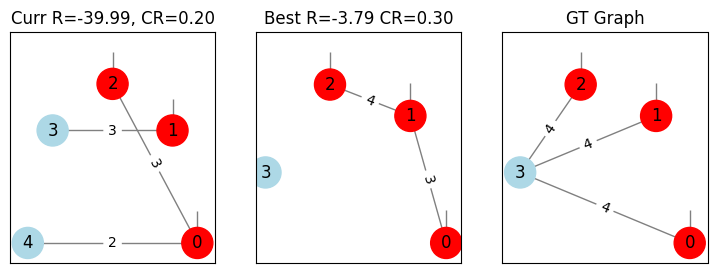

Action: increment:2:3 | Reward: -16.946008012944837 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


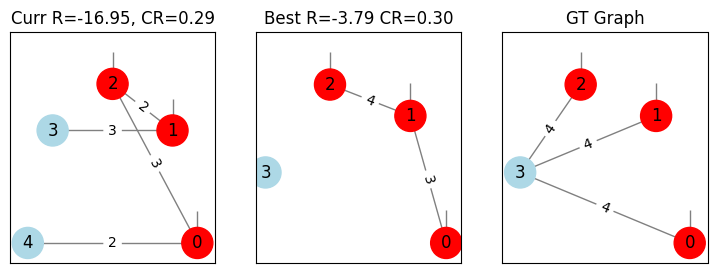

[Terminated] Action: increment:0:2 | Reward: -100003.78827185897 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


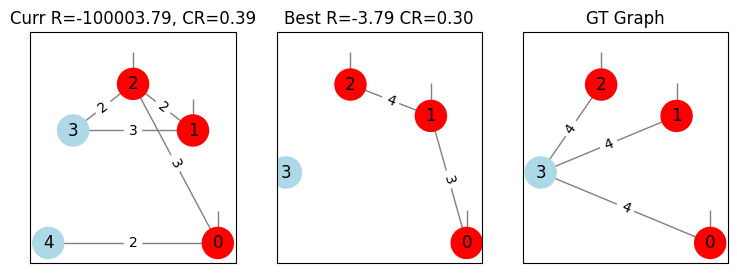

Problem 1, Agent ql:  40%|████      | 2/5 [01:39<02:33, 51.14s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


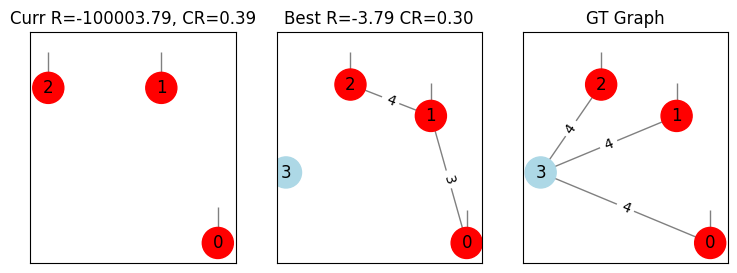

Action: addNode | Reward: -47.8798687456525 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


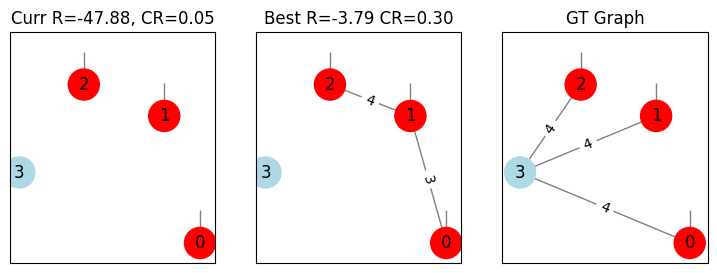

Action: increment:0:2 | Reward: -59.57844105652819 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


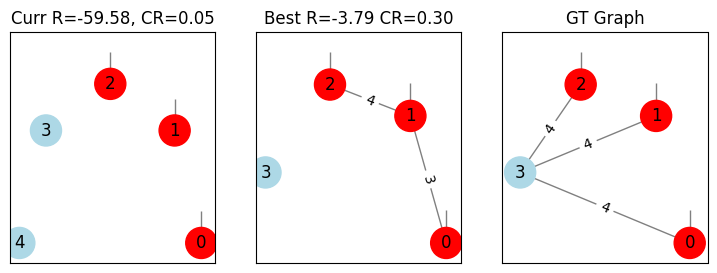

Action: increment:0:4 | Reward: -40.55603496796908 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


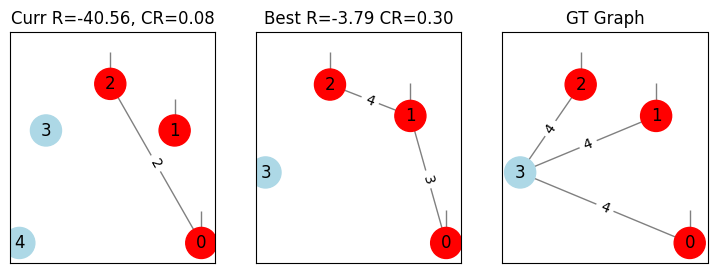

Action: increment:0:3 | Reward: -40.555940893358624 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


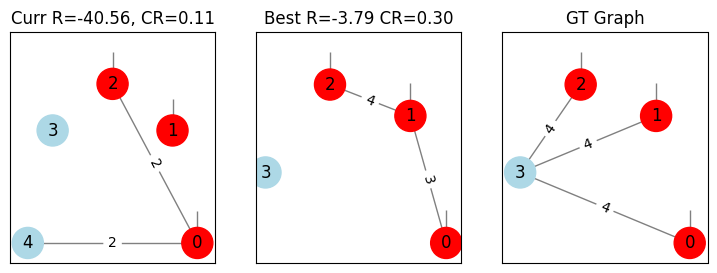

Action: increment:0:4 | Reward: -40.554815924520234 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


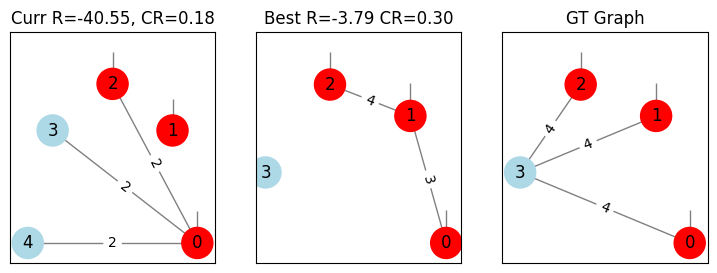

Action: increment:1:2 | Reward: -40.55521529570252 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


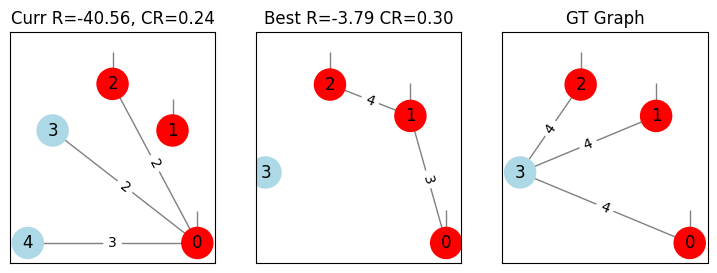

Action: addNode | Reward: -25.397785442407713 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


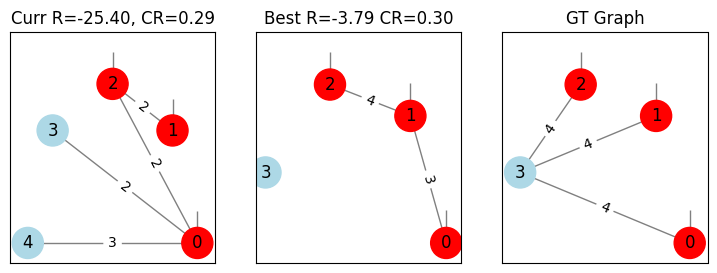

Action: increment:0:3 | Reward: -25.429850903472556 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.3125


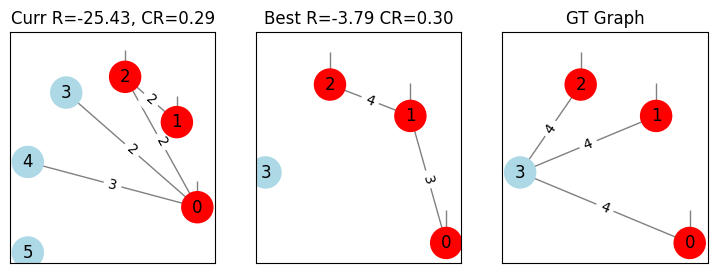

[Terminated] Action: increment:3:4 | Reward: -100025.42910787348 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.3125


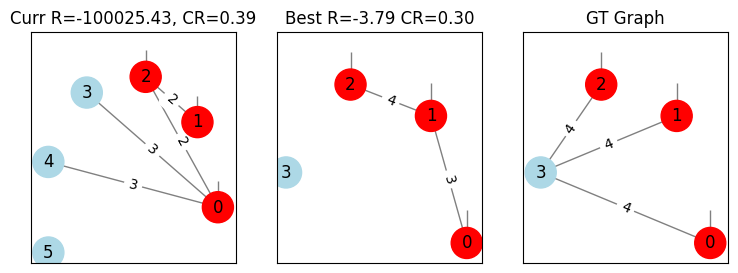

Problem 1, Agent ql:  60%|██████    | 3/5 [02:13<01:26, 43.02s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


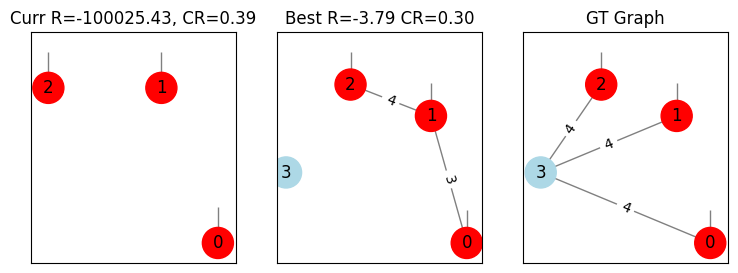

Action: increment:0:1 | Reward: -40.556174997745615 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


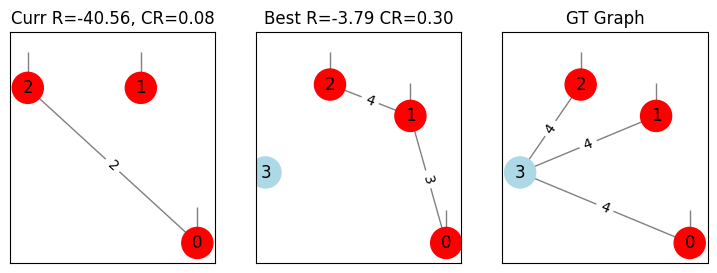

Action: increment:1:2 | Reward: -22.236323804269638 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


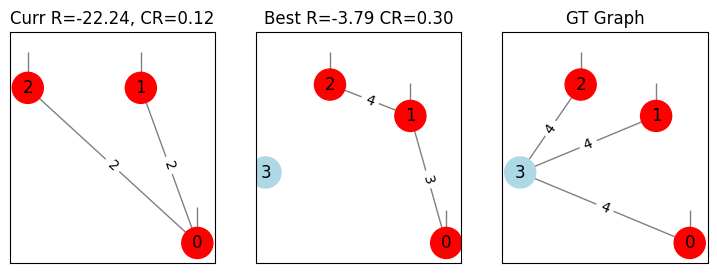

Action: addNode | Reward: -5.155194486411723 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


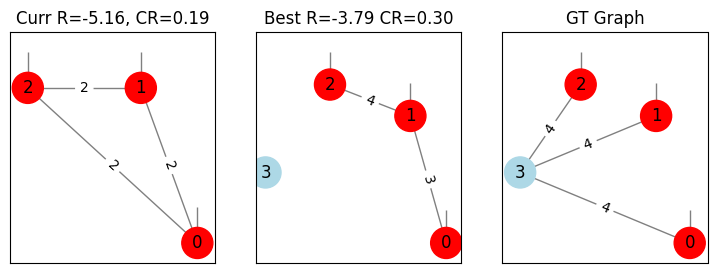

Action: increment:0:1 | Reward: -6.647930164164485 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


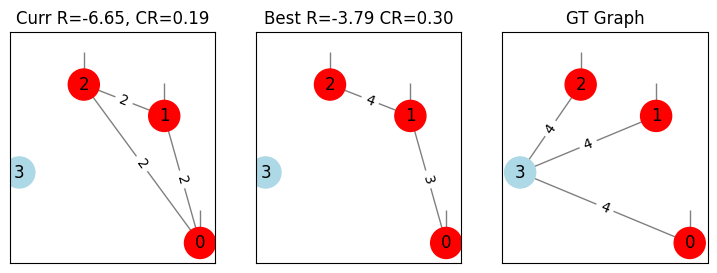

Action: increment:0:1 | Reward: -1.3646239252383507 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


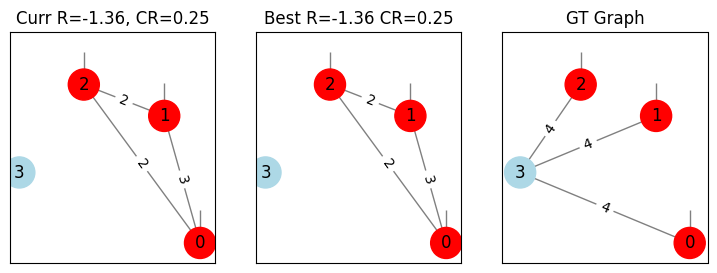

Action: increment:0:3 | Reward: -0.1691534950860848 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


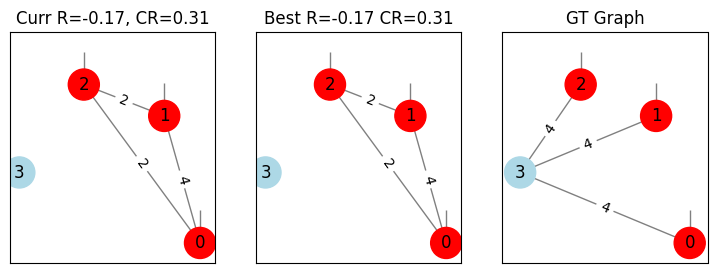

[Terminated] Action: increment:0:1 | Reward: -100000.29117021774 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


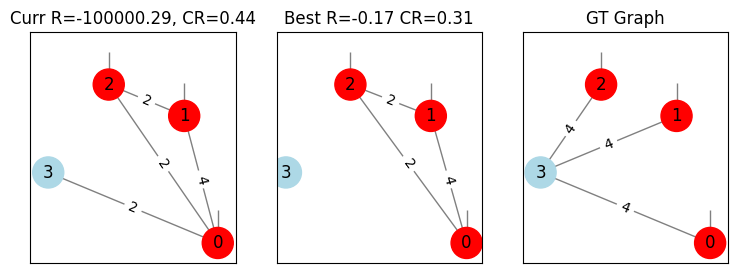

Problem 1, Agent ql:  80%|████████  | 4/5 [03:14<00:50, 50.28s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


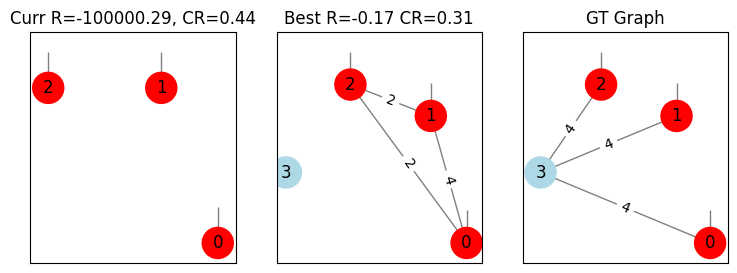

Action: increment:1:2 | Reward: -47.8798687456525 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:1:2'] | Compression constraint 0.3125


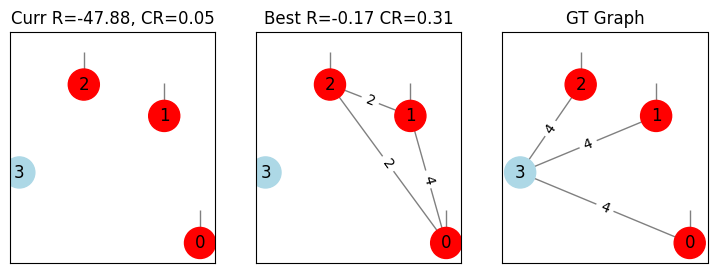

Action: increment:0:1 | Reward: -45.31550397269345 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


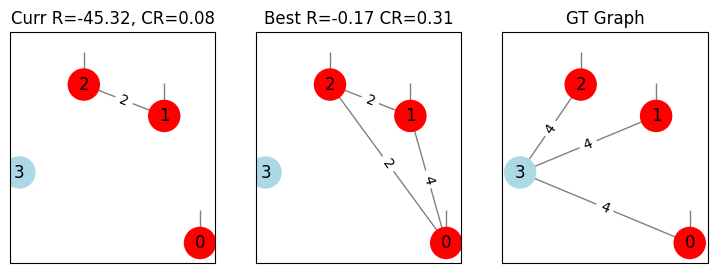

Action: increment:0:2 | Reward: -24.67243037150172 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


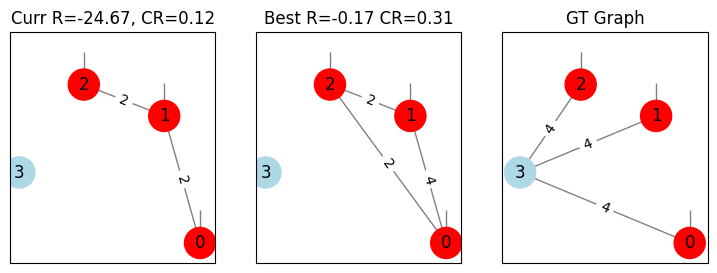

Action: increment:0:1 | Reward: -6.647930164164485 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


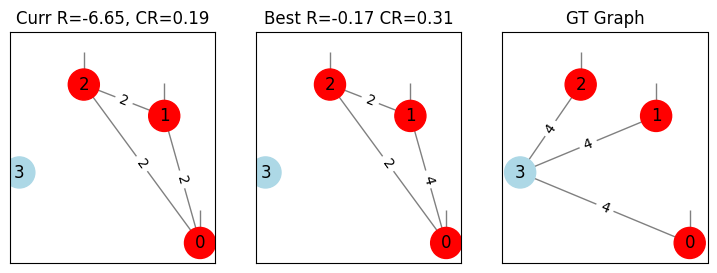

Action: increment:0:1 | Reward: -1.3646239252383507 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


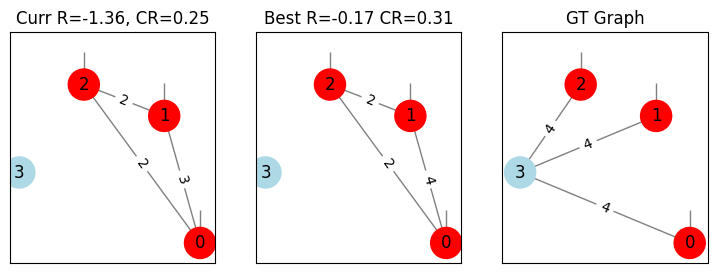

Action: increment:0:3 | Reward: -0.1691534950860848 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


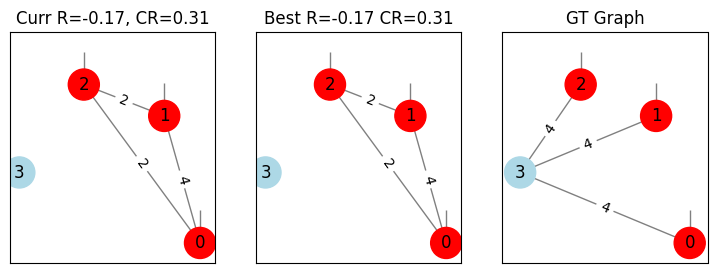

[Terminated] Action: increment:0:1 | Reward: -100000.29117021774 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.3125


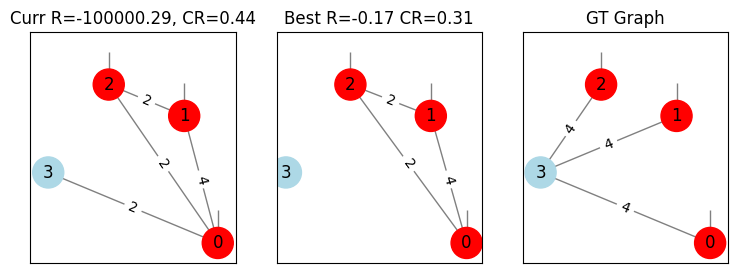

Problem 1, Agent ql: 100%|██████████| 5/5 [03:32<00:00, 42.54s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 2, Agent dqn:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


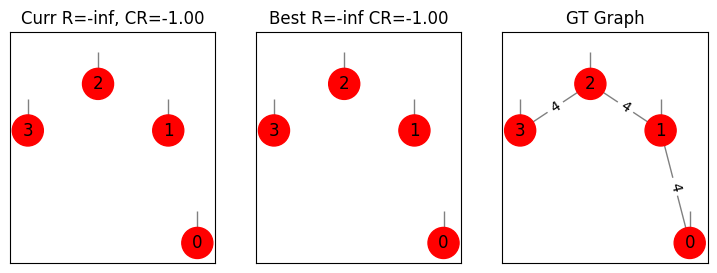

Action: increment:2:3 | Reward: -36.40920127693727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


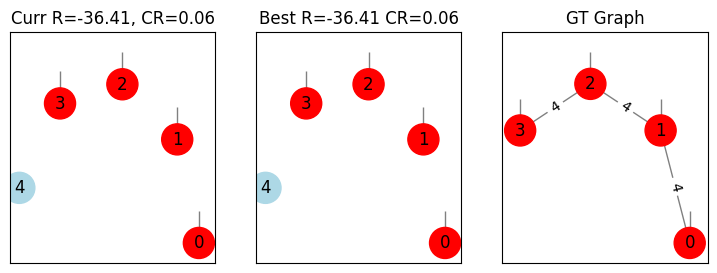

Action: increment:0:4 | Reward: -34.52576564986538 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


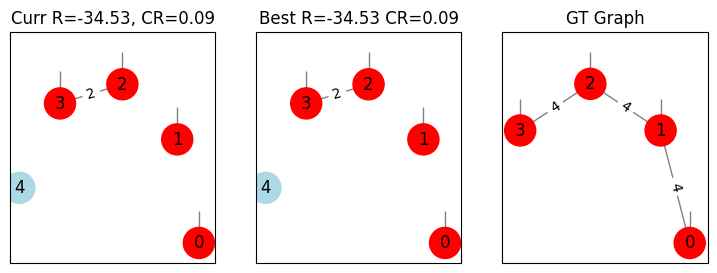

Action: increment:0:1 | Reward: -34.52552794692101 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


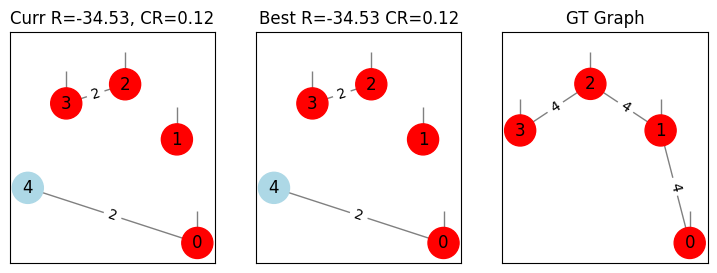

Action: addNode | Reward: -22.0699845479054 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


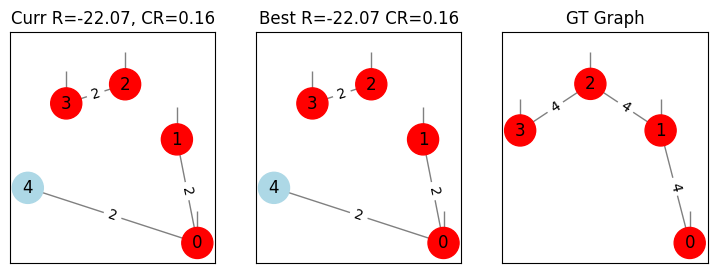

Action: addNode | Reward: -22.07016605090778 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


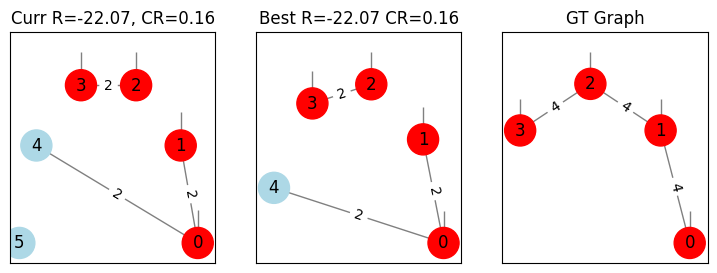

Action: increment:0:1 | Reward: -22.06959238179039 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


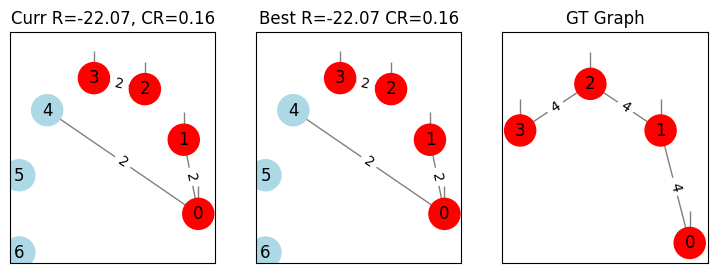

Action: increment:0:1 | Reward: -18.486455804419982 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.625


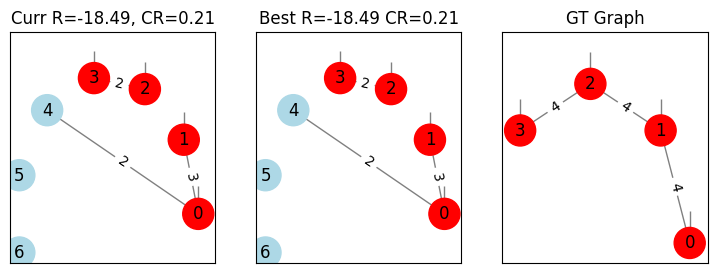

Action: increment:0:1 | Reward: -18.485311664197788 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.625


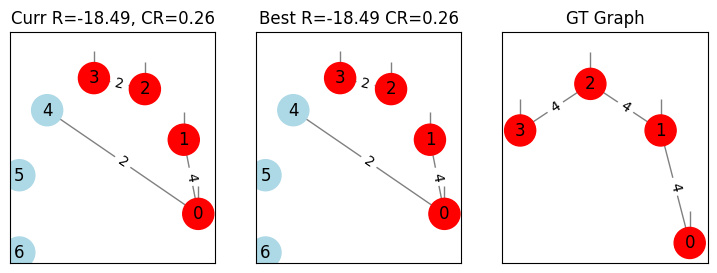

Action: increment:0:1 | Reward: -18.48325634365917 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.625


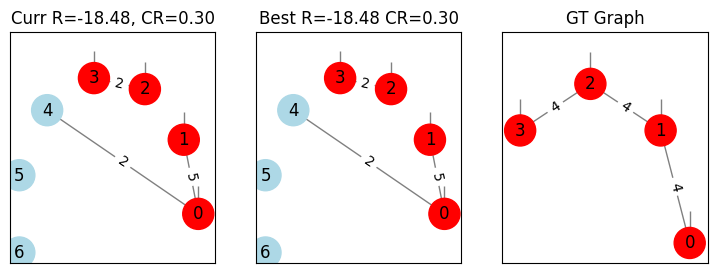

[Terminated] Action: increment:0:1 | Reward: -18.48447924344378 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:0:6', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:1:6', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:2:6', 'increment:3:4', 'increment:3:5', 'increment:3:6', 'increment:4:5', 'increment:4:6', 'increment:5:6'] | Compression constraint 0.625


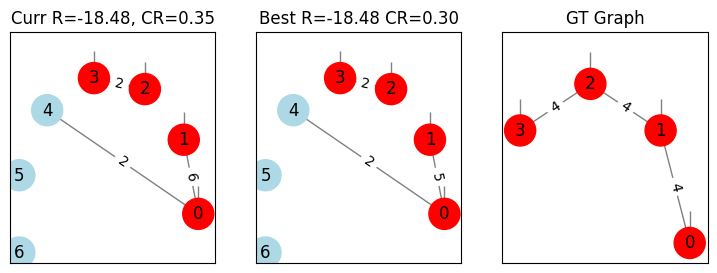

Problem 2, Agent dqn:  20%|██        | 1/5 [00:55<03:43, 55.97s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


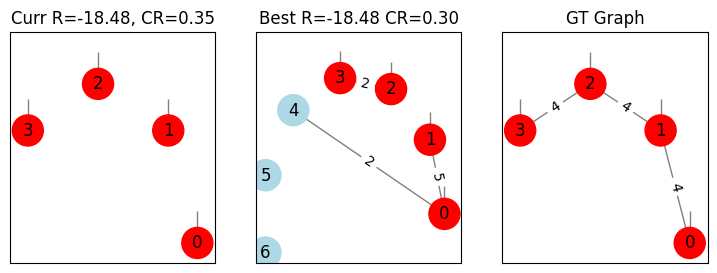

Action: addNode | Reward: -36.40920127693727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


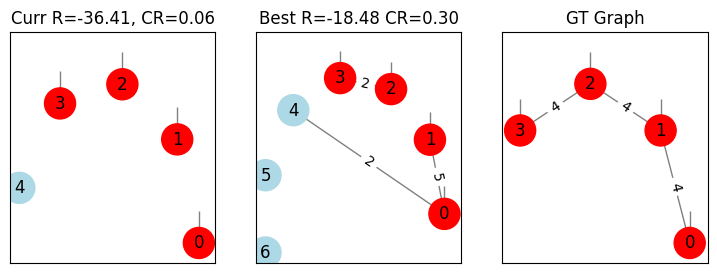

Action: increment:0:1 | Reward: -36.408457754464465 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


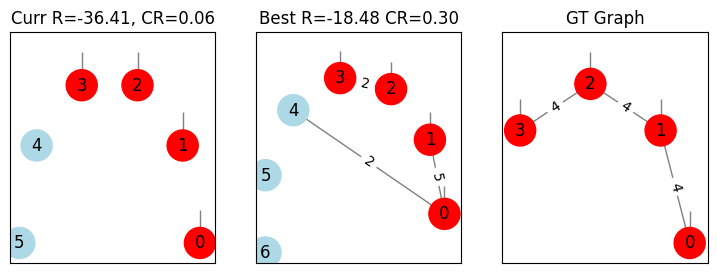

Action: increment:0:1 | Reward: -24.863974530809205 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


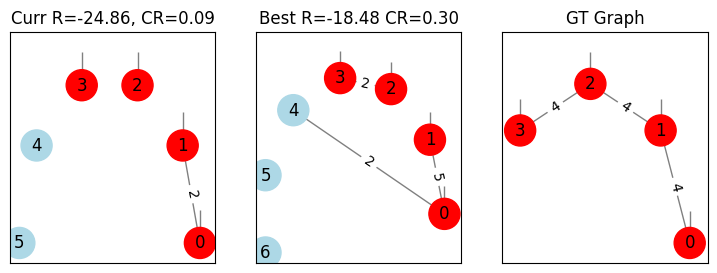

Action: increment:0:1 | Reward: -21.671419976687584 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


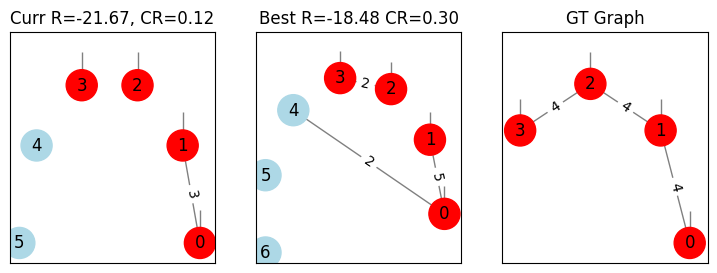

Action: increment:0:1 | Reward: -21.670100046444666 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


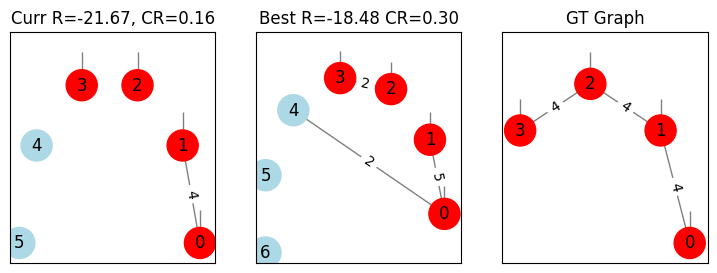

Action: increment:0:1 | Reward: -21.669919296839307 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


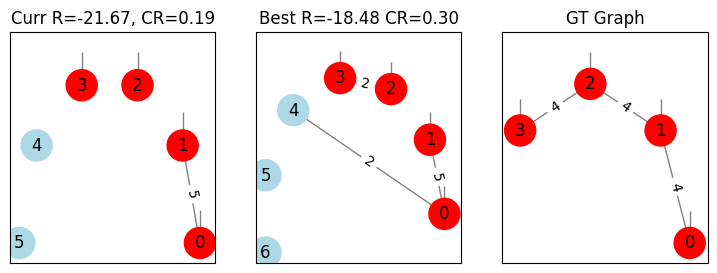

Action: increment:0:1 | Reward: -21.67009327552839 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


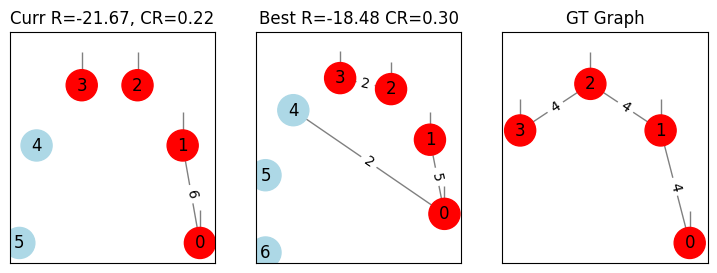

Action: increment:0:1 | Reward: -21.669514168702676 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


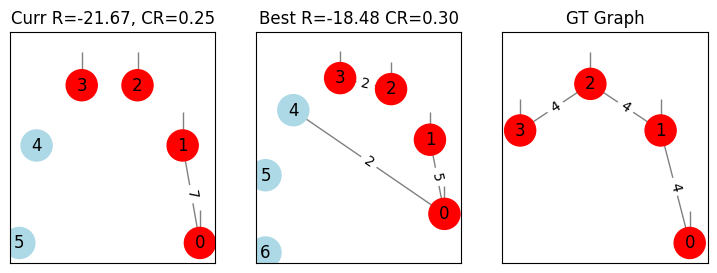

Action: increment:0:1 | Reward: -21.669711525521436 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


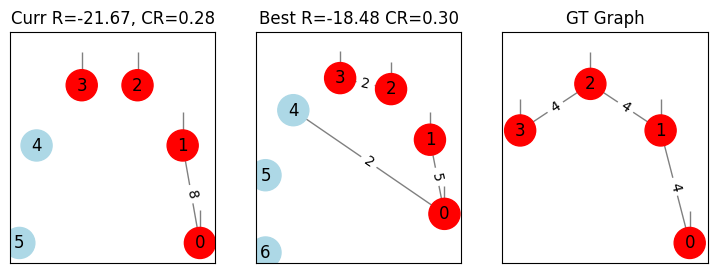

[Terminated] Action: increment:0:2 | Reward: -21.669753615505982 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


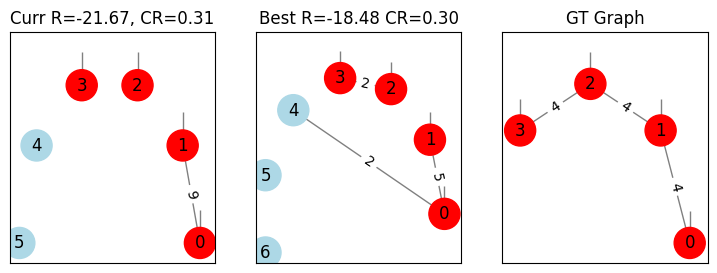

Problem 2, Agent dqn:  40%|████      | 2/5 [01:33<02:14, 44.84s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


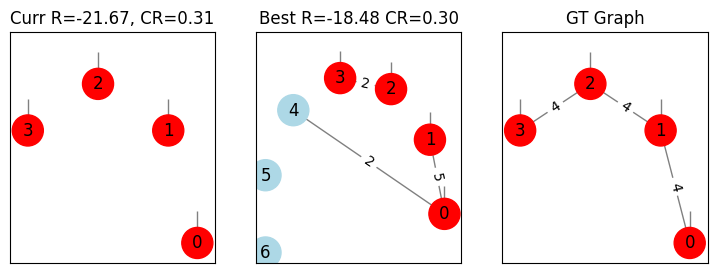

Action: addNode | Reward: -36.40920127693727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


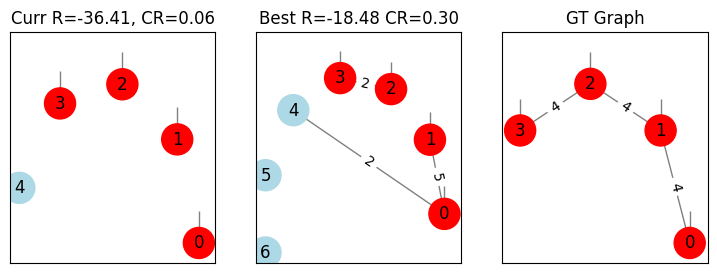

Action: increment:1:2 | Reward: -36.408457754464465 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


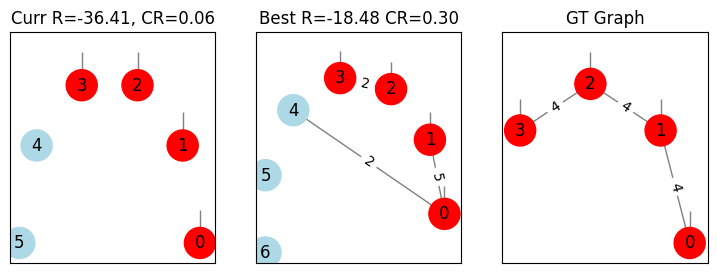

Action: increment:0:1 | Reward: -30.42190142599104 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


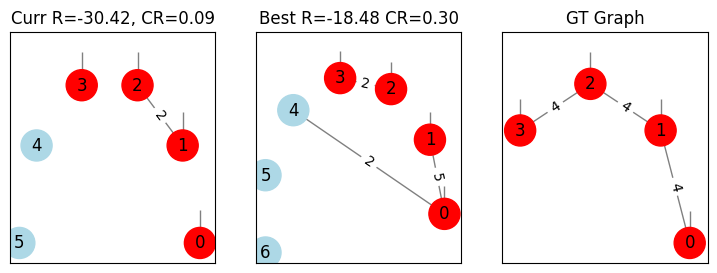

Action: increment:0:1 | Reward: -17.63775612787167 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


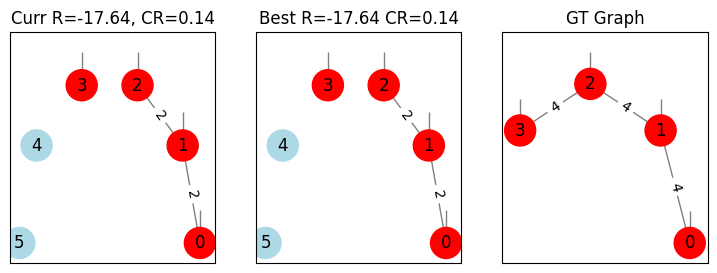

Action: increment:0:1 | Reward: -14.156442003953085 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


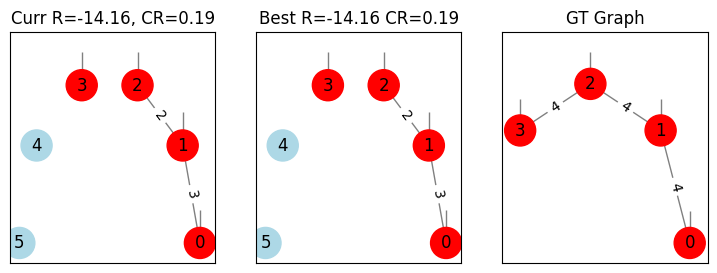

Action: increment:0:1 | Reward: -14.151703941479386 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


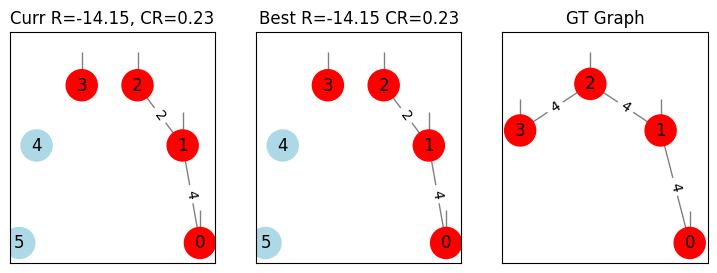

Action: increment:0:1 | Reward: -14.136089289106078 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


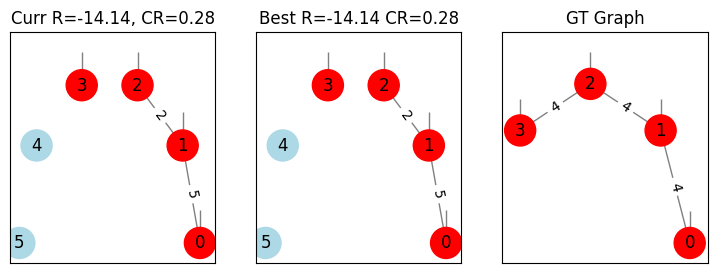

Action: increment:0:1 | Reward: -14.134577839526294 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


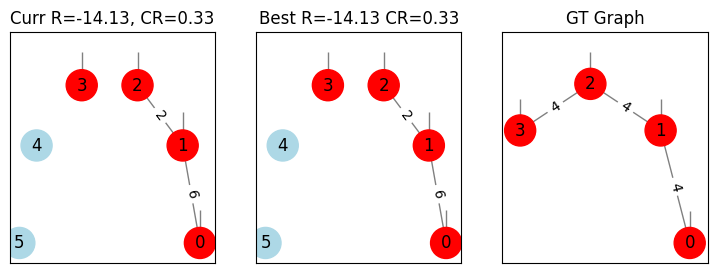

Action: increment:0:1 | Reward: -14.135393999461701 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


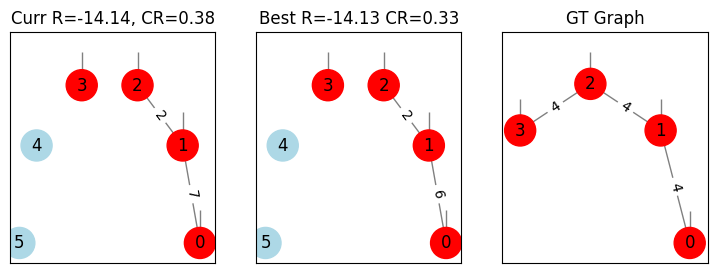

[Terminated] Action: increment:0:1 | Reward: -14.134891552968709 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


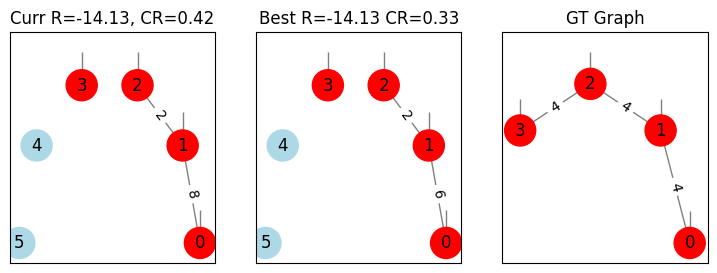

Problem 2, Agent dqn:  60%|██████    | 3/5 [02:15<01:27, 43.59s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


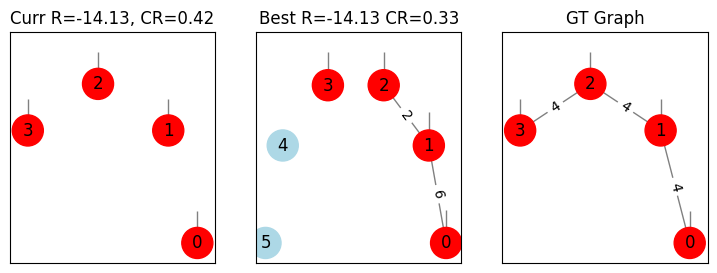

Action: addNode | Reward: -36.40920127693727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


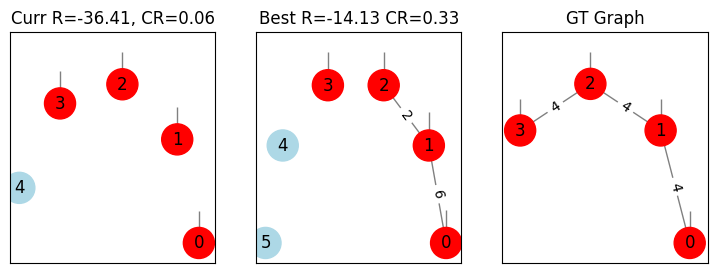

Action: increment:0:1 | Reward: -36.408457754464465 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


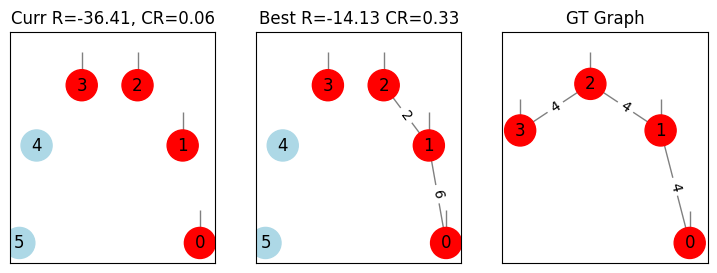

Action: increment:0:1 | Reward: -24.863974530809205 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


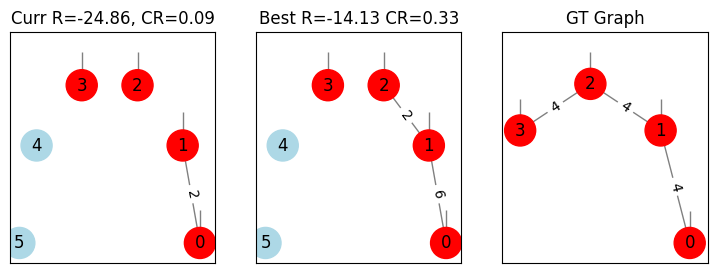

Action: increment:0:1 | Reward: -21.671419976687584 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


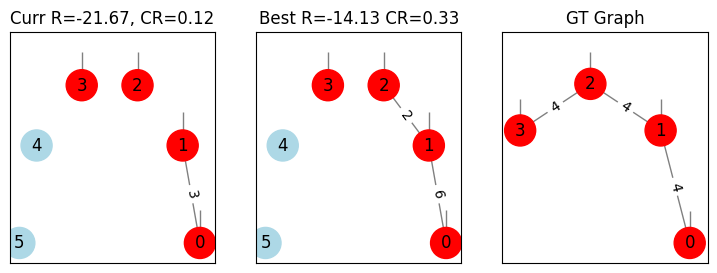

Action: increment:0:1 | Reward: -21.670100046444666 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


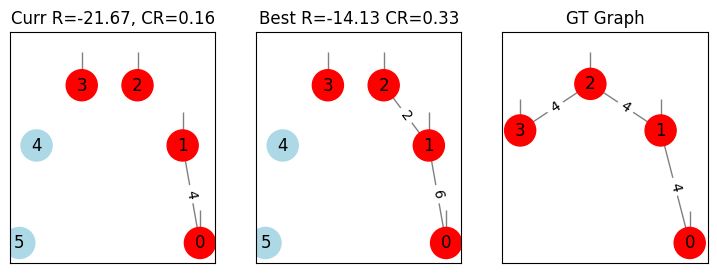

Action: increment:0:1 | Reward: -21.669919296839307 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


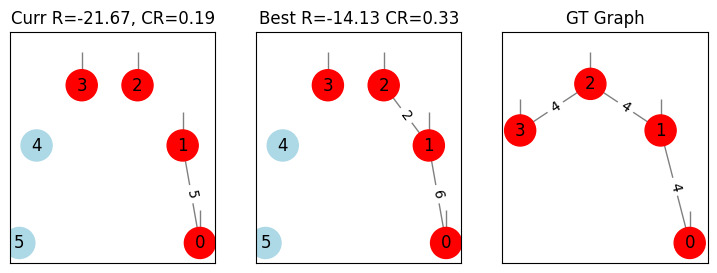

Action: increment:0:1 | Reward: -21.67009327552839 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


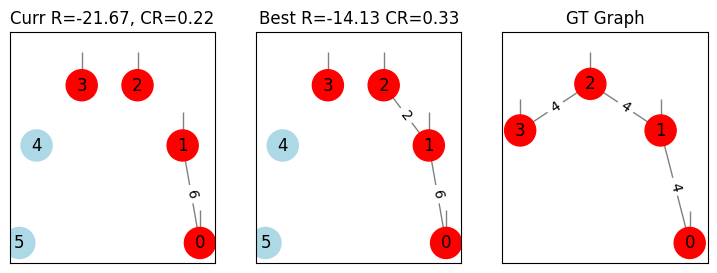

Action: increment:0:1 | Reward: -21.669514168702676 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


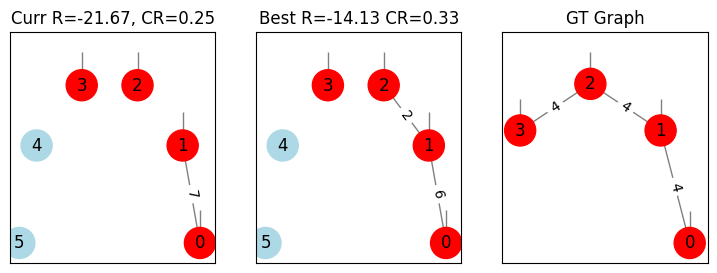

Action: increment:0:1 | Reward: -21.669711525521436 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


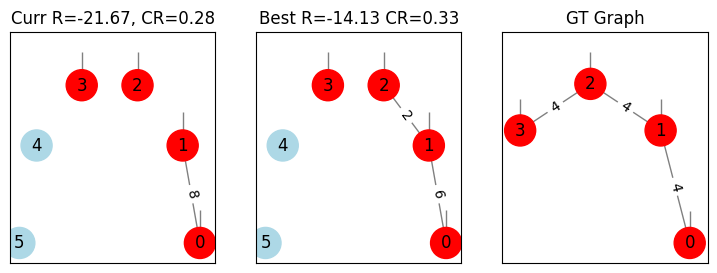

[Terminated] Action: increment:0:2 | Reward: -21.669753615505982 | Feasible: ['increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


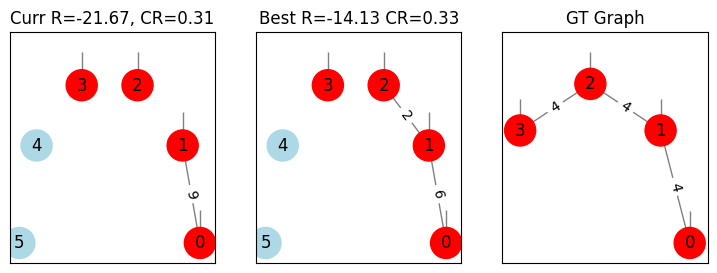

Problem 2, Agent dqn:  80%|████████  | 4/5 [02:22<00:29, 29.26s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


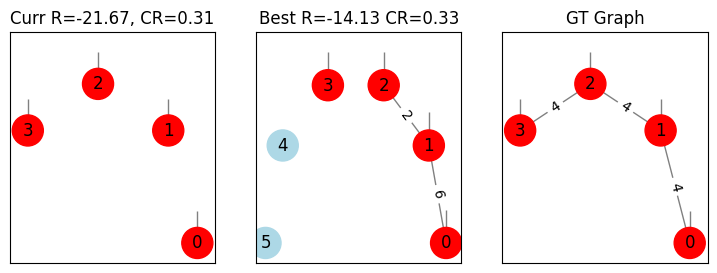

Action: addNode | Reward: -35.16002654075129 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


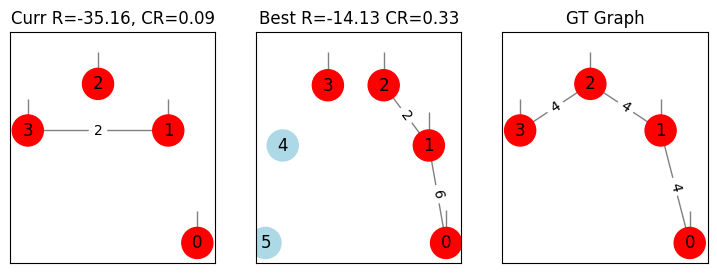

Action: increment:0:2 | Reward: -35.15992079725828 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


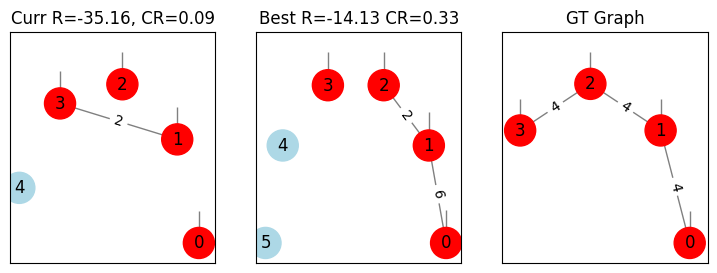

Action: increment:0:1 | Reward: -34.603620754315145 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


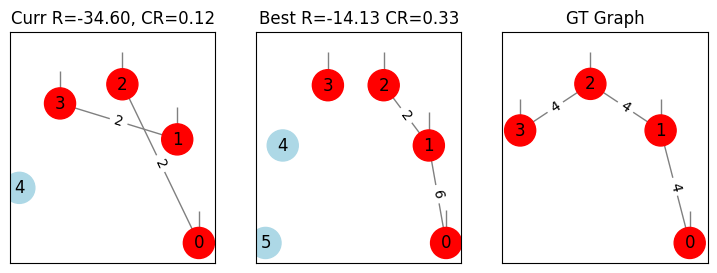

Action: increment:0:1 | Reward: -17.522554966235198 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


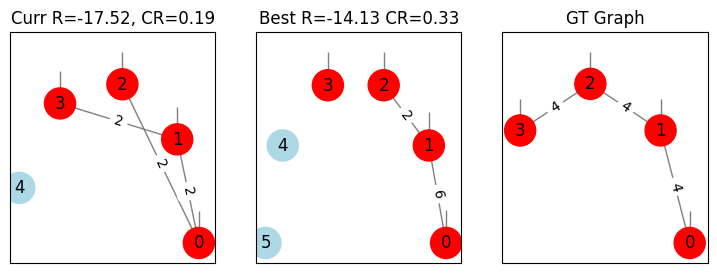

Action: increment:0:1 | Reward: -13.850740334723916 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


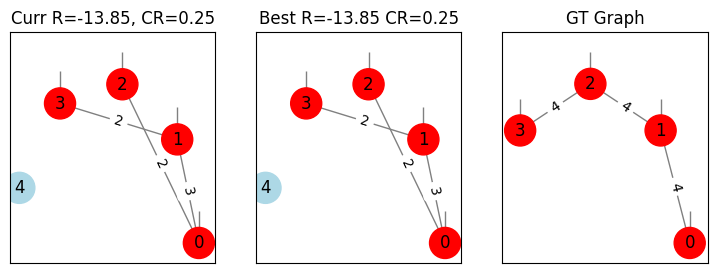

Action: increment:0:1 | Reward: -11.303498707305156 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


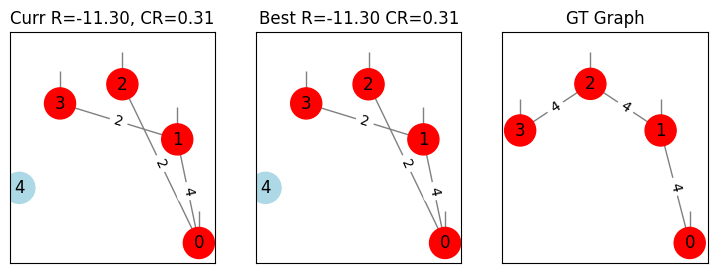

Action: increment:0:1 | Reward: -10.714785401701036 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


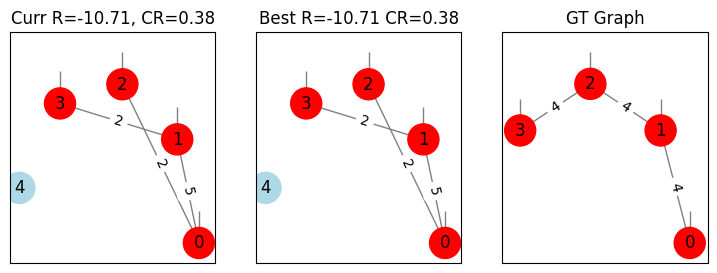

Action: increment:0:1 | Reward: -10.645683066825981 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


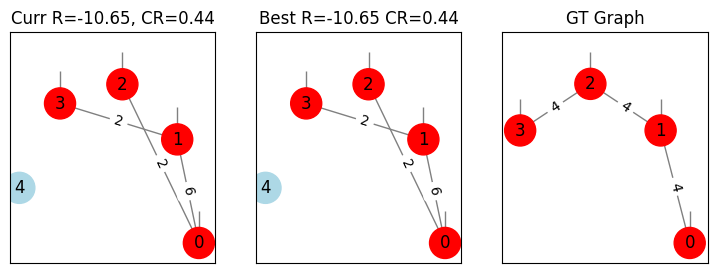

Action: increment:0:1 | Reward: -10.643326643831543 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


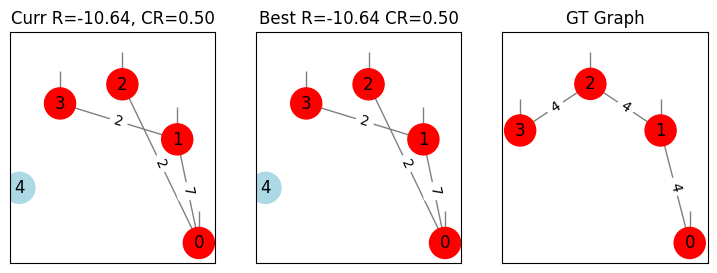

[Terminated] Action: increment:0:3 | Reward: -10.643854251129667 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


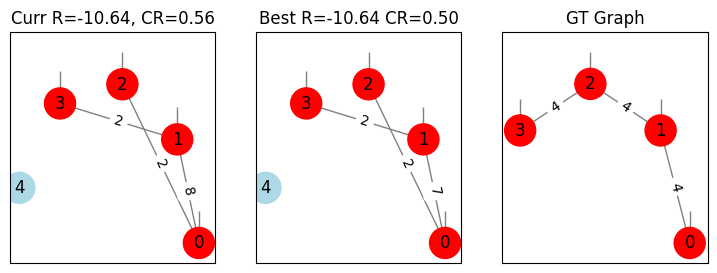

Problem 2, Agent dqn: 100%|██████████| 5/5 [03:36<00:00, 43.31s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 2, Agent sarsa:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


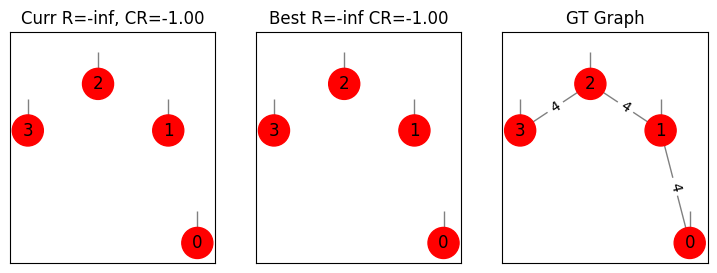

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, 0]
Action: increment:0:2 | Reward: -30.422578912778413 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'incr

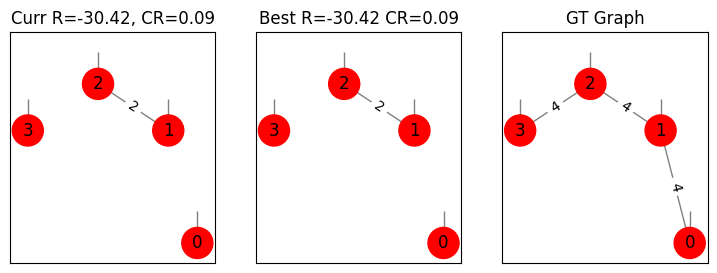

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, 0]
Action: addNode | Reward: -19.66550817671964 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increme

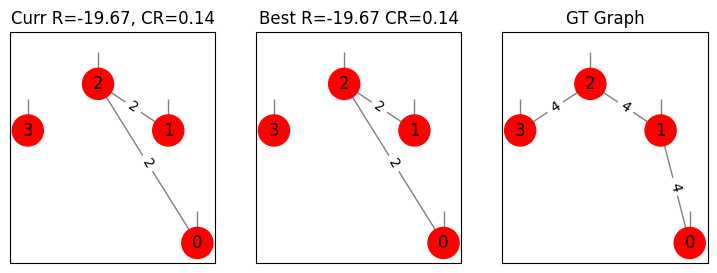

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, 0]
Action: increment:1:3 | Reward: -19.665512856242408 | Feasible: ['addNode', 'increment:0:1

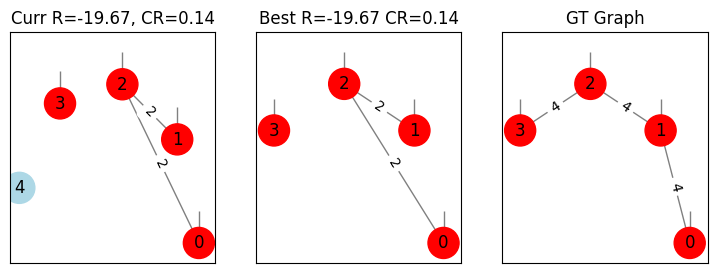

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, 0]
Action: increment:1:4 | Reward: -17.843106130874425 | Feasible: ['inc

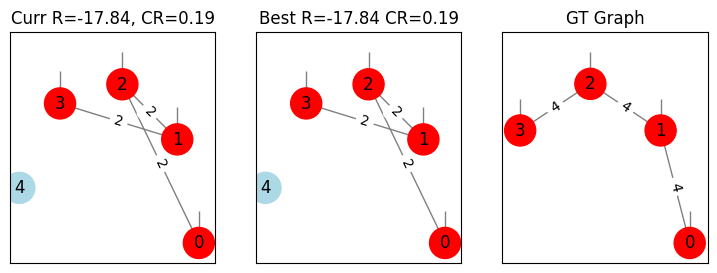

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, 0]
Action: increment:1:3 | Reward: -17.843325410566

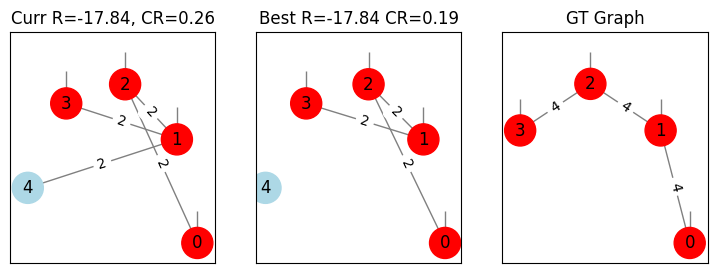

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, 0]
Action: addNode | Reward: -

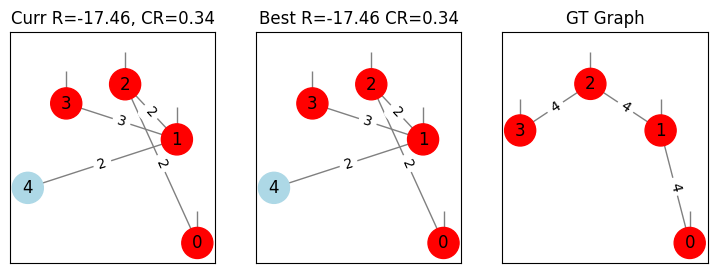

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, 0]
Action:

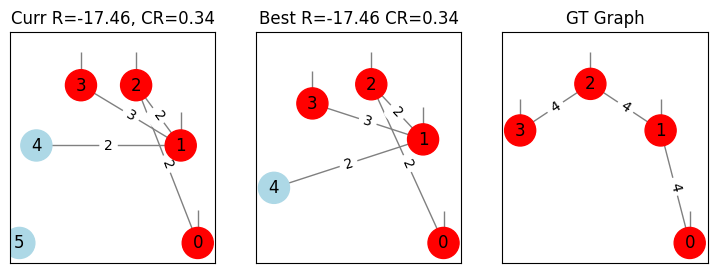

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

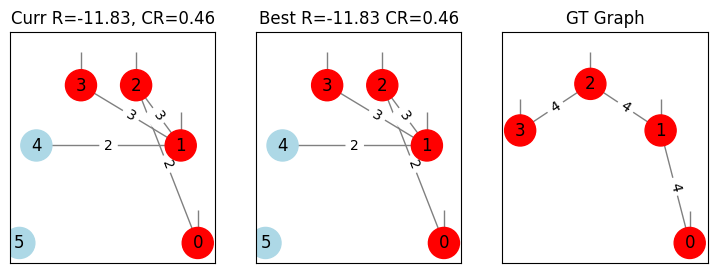

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

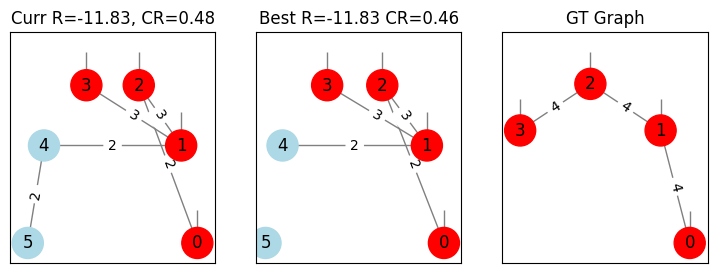

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

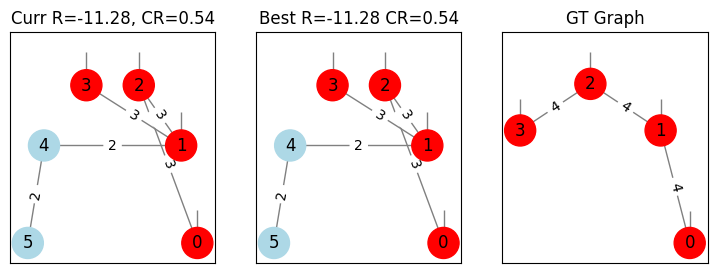

Problem 2, Agent sarsa:  20%|██        | 1/5 [01:23<05:32, 83.19s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


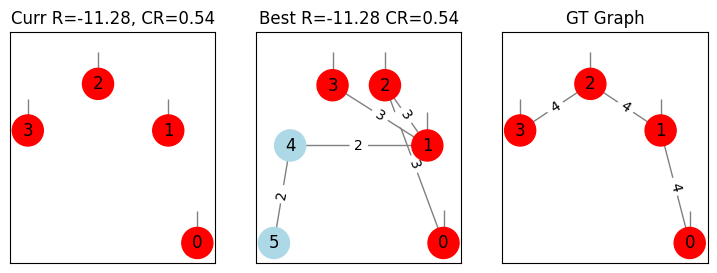

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

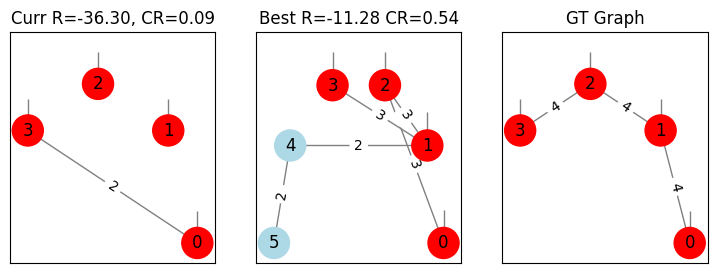

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

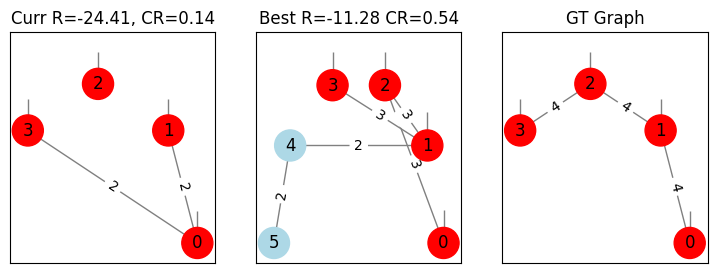

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

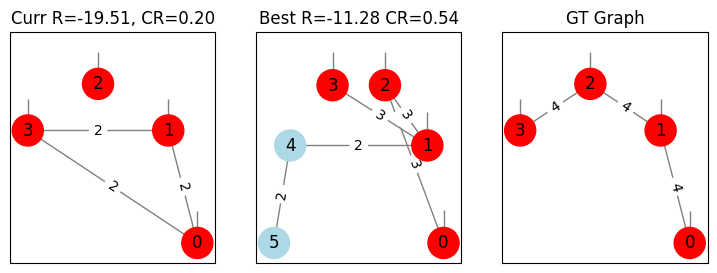

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

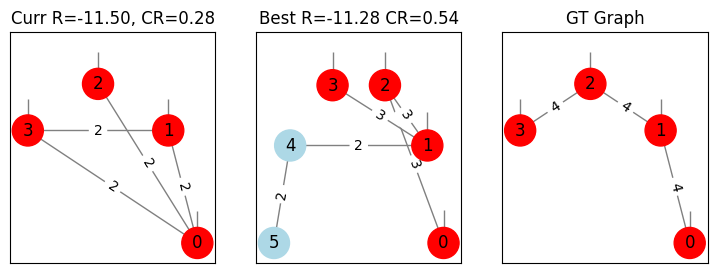

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

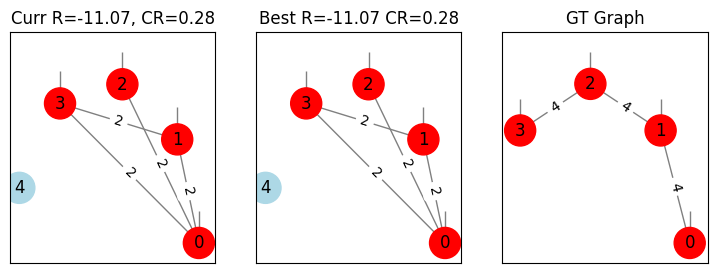

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

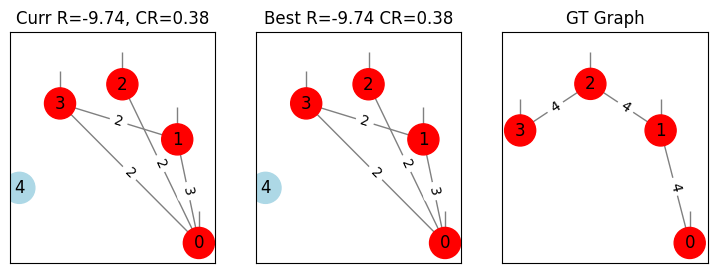

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

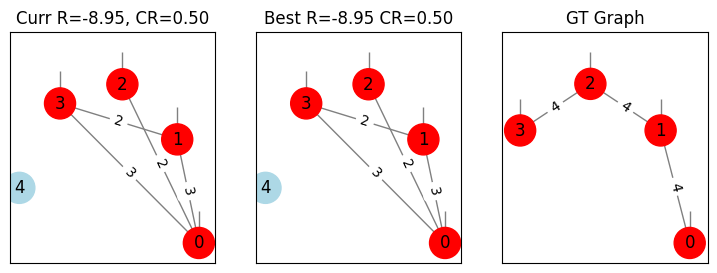

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

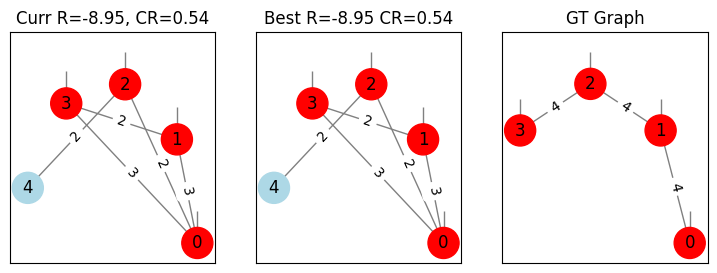

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

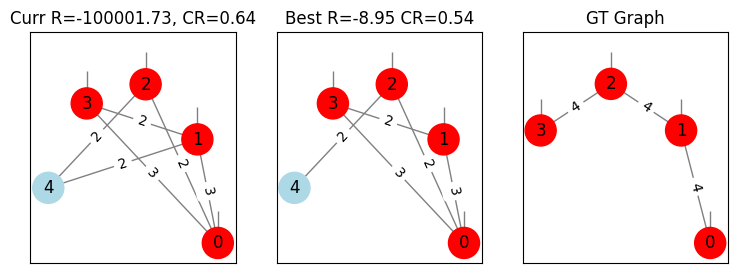

Problem 2, Agent sarsa:  40%|████      | 2/5 [03:17<05:03, 101.31s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


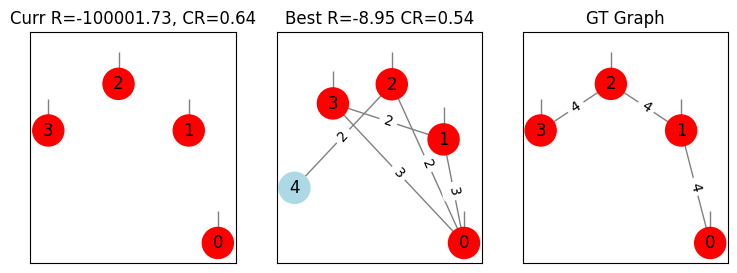

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

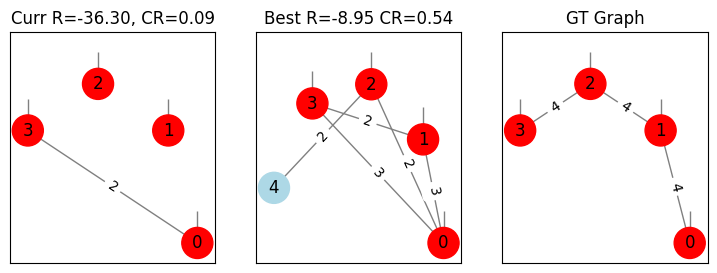

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

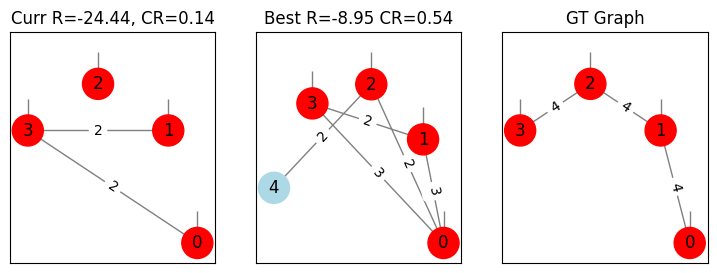

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

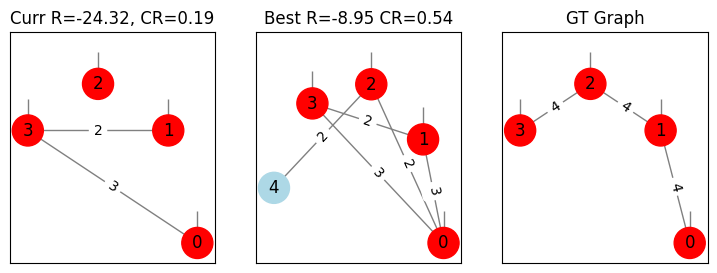

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

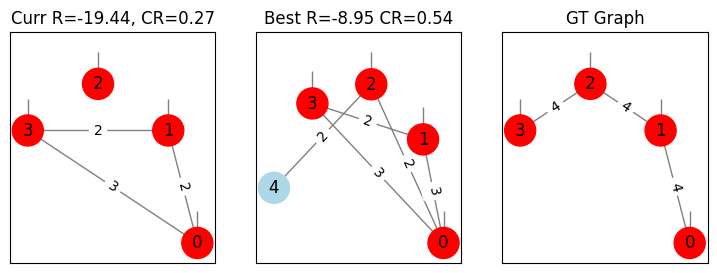

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

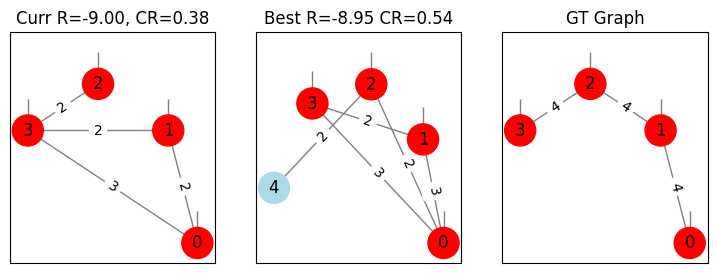

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

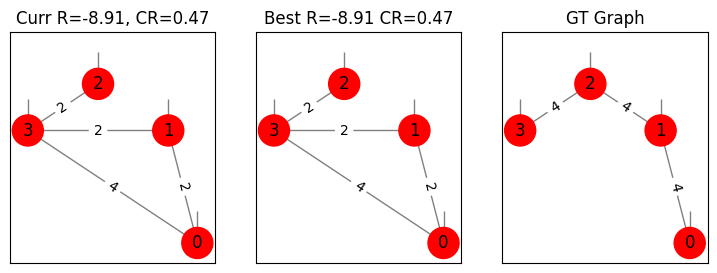

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

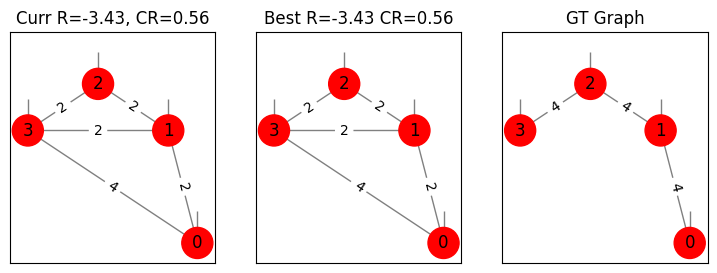

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

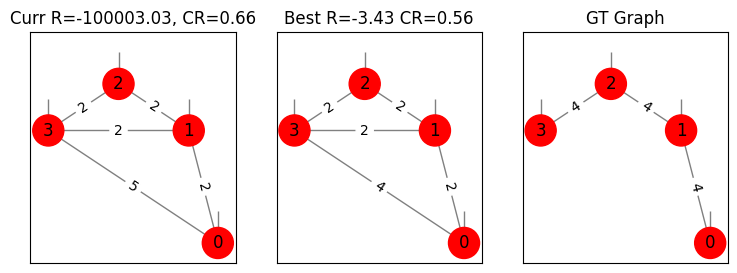

Problem 2, Agent sarsa:  60%|██████    | 3/5 [04:31<02:58, 89.07s/it] 

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


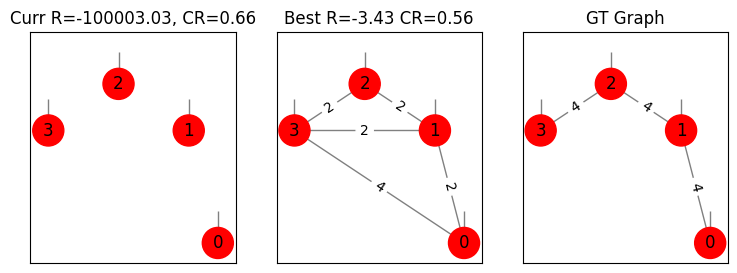

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

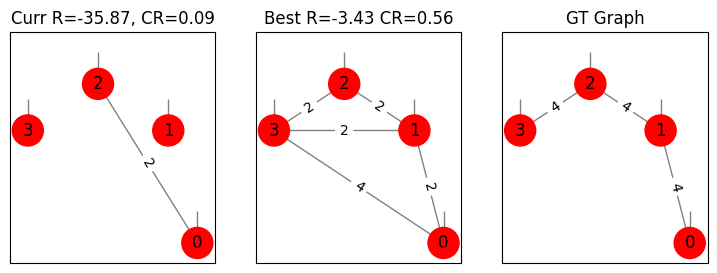

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

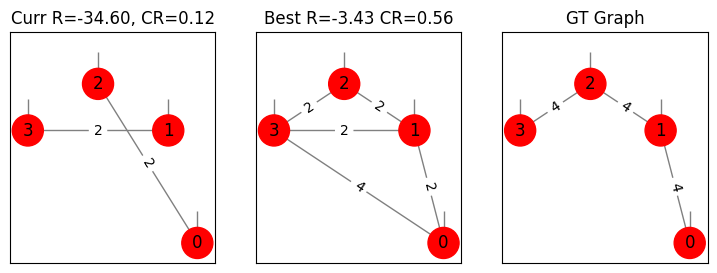

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

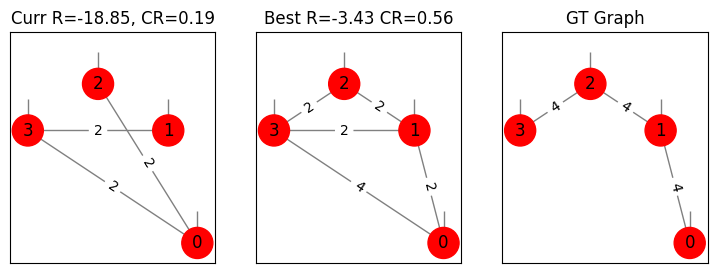

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

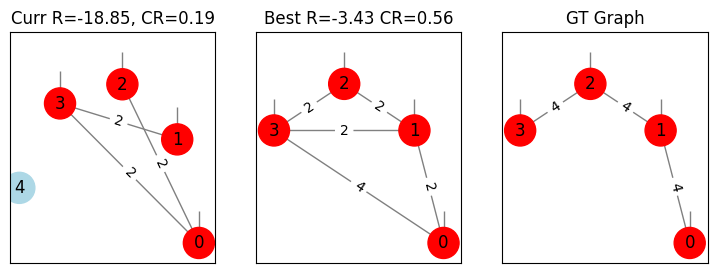

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

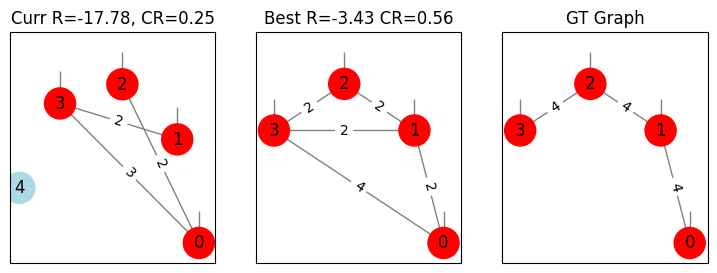

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

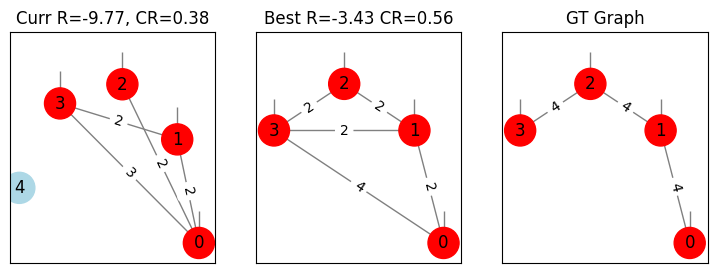

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

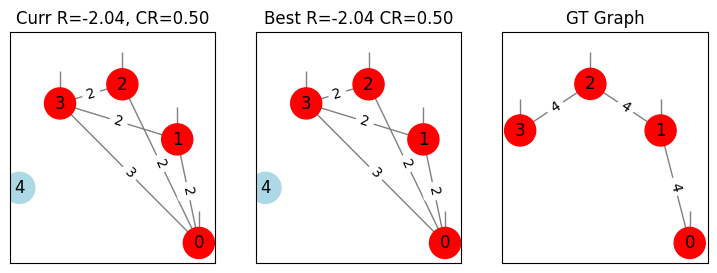

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

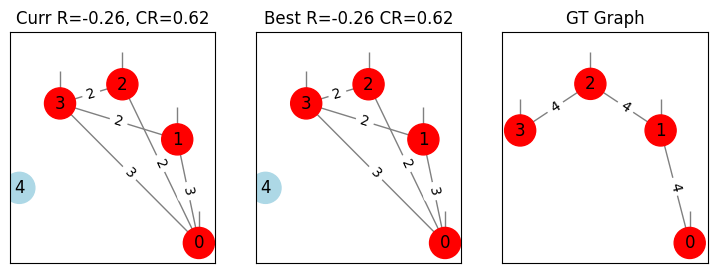

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

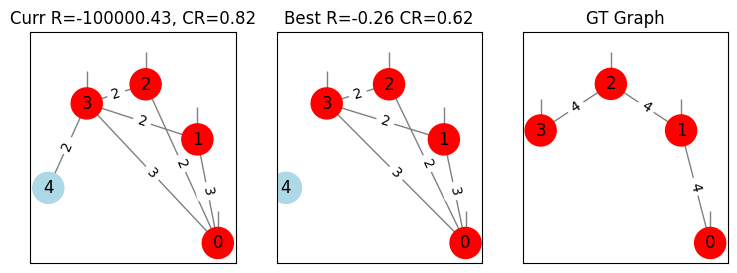

Problem 2, Agent sarsa:  80%|████████  | 4/5 [06:06<01:31, 91.19s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


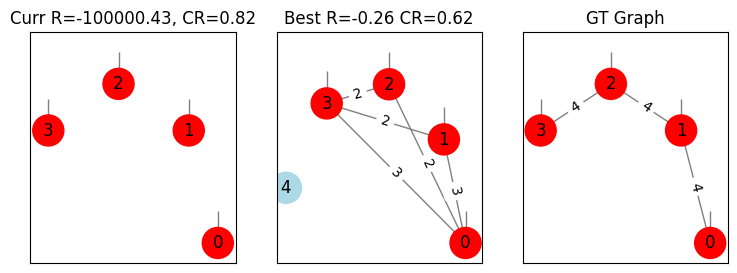

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

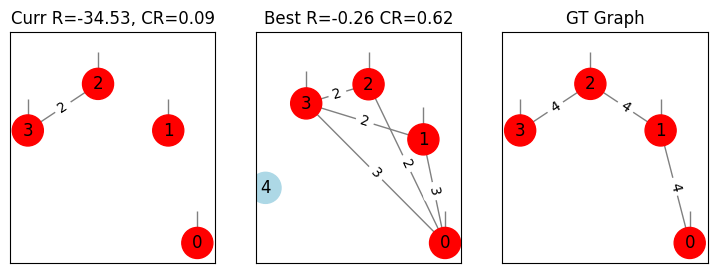

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

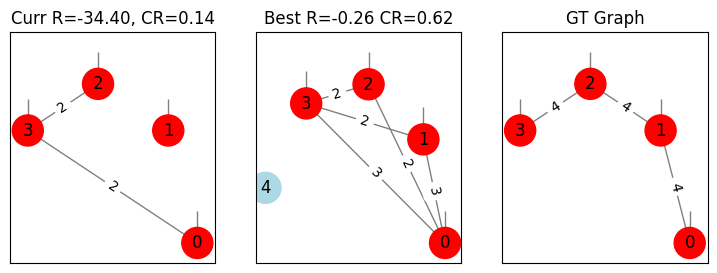

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

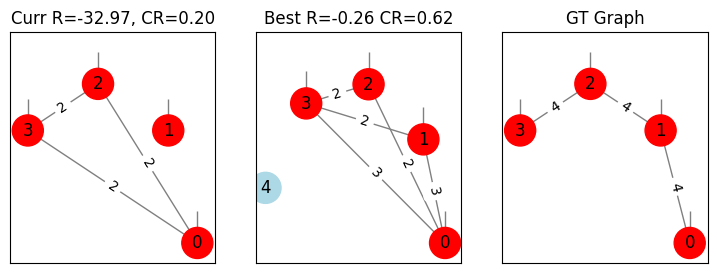

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

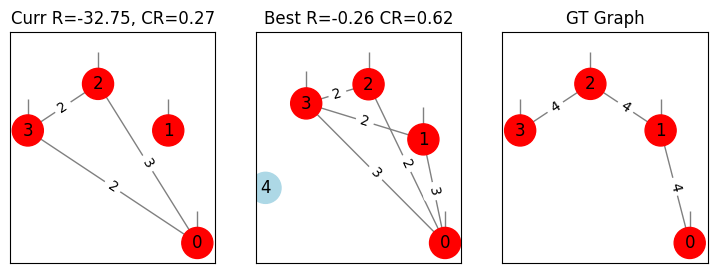

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

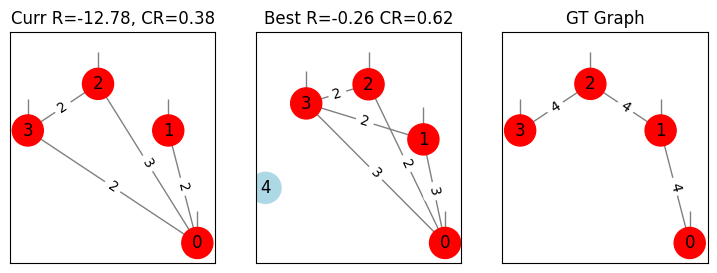

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

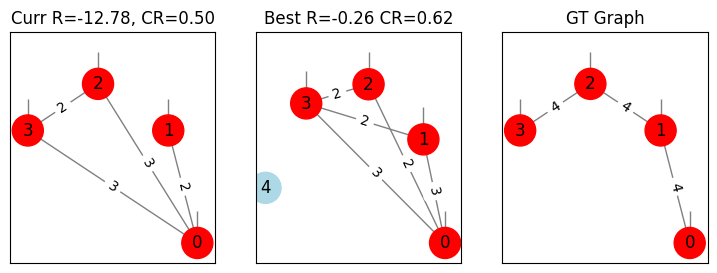

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

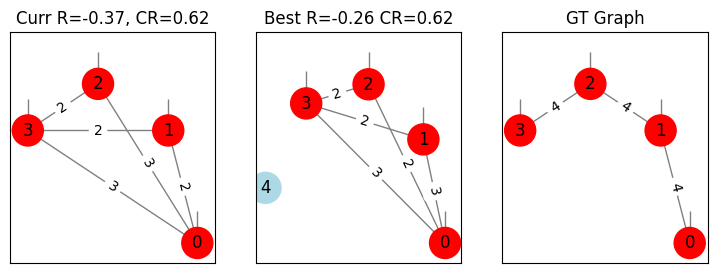

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

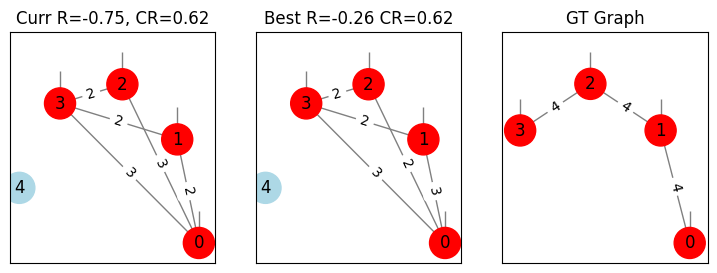

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

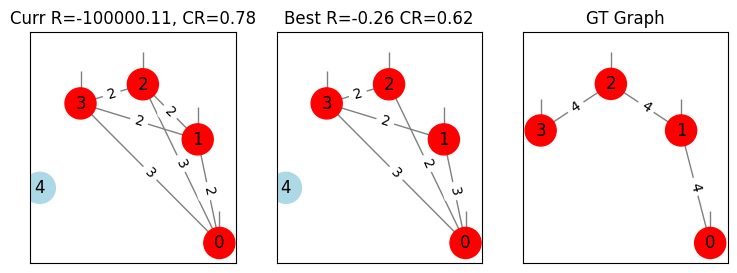

Problem 2, Agent sarsa: 100%|██████████| 5/5 [07:44<00:00, 92.93s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 2, Agent ql:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


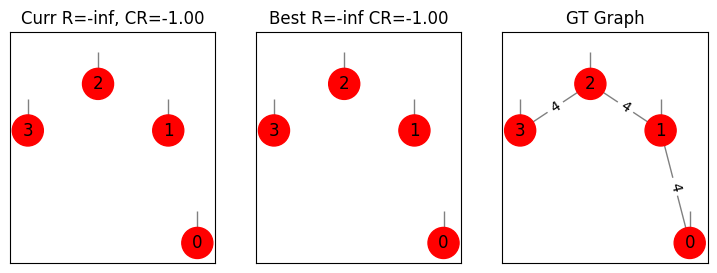

Action: increment:0:2 | Reward: -34.525837057968666 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


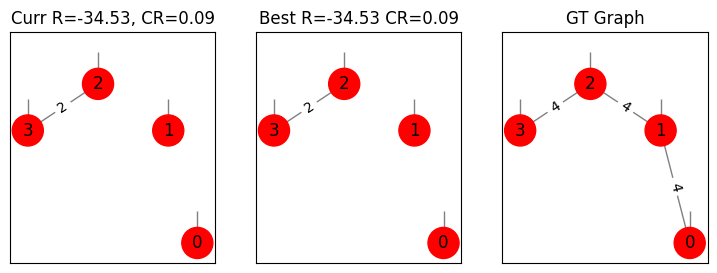

Action: increment:0:2 | Reward: -33.77608932431628 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


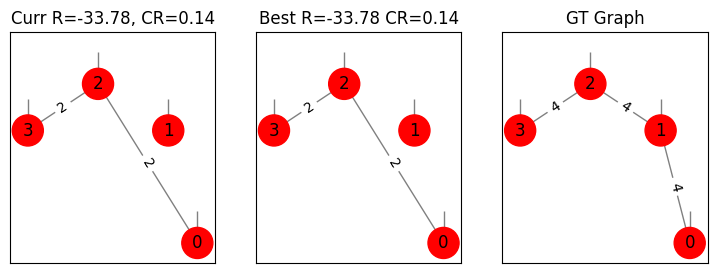

Action: increment:1:2 | Reward: -33.57211771509314 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


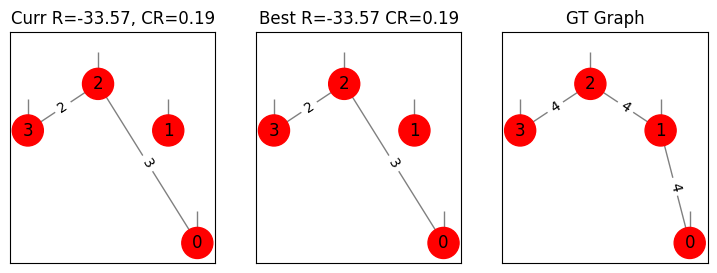

Action: increment:2:3 | Reward: -14.943563797153363 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


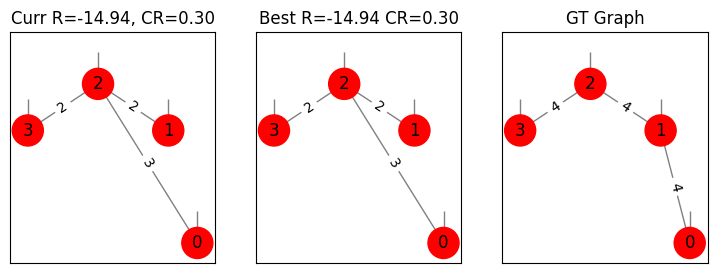

Action: increment:0:1 | Reward: -12.790135314506106 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


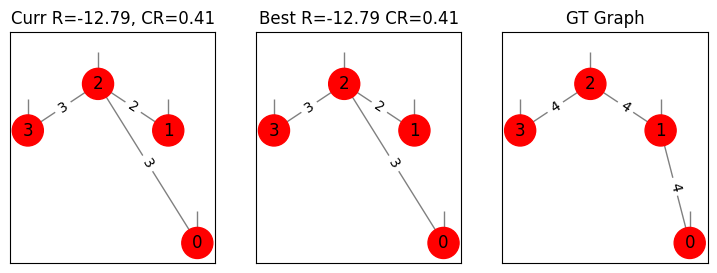

Action: increment:1:2 | Reward: -1.1341780999841369 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


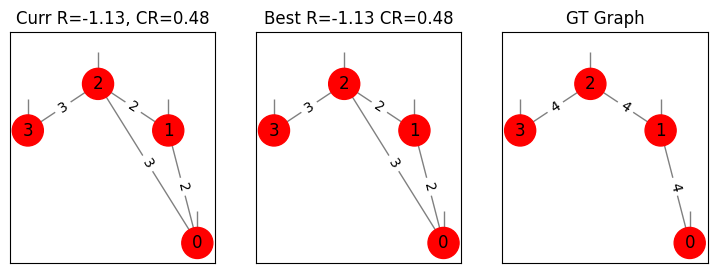

[Terminated] Action: increment:0:3 | Reward: -100000.26423114164 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


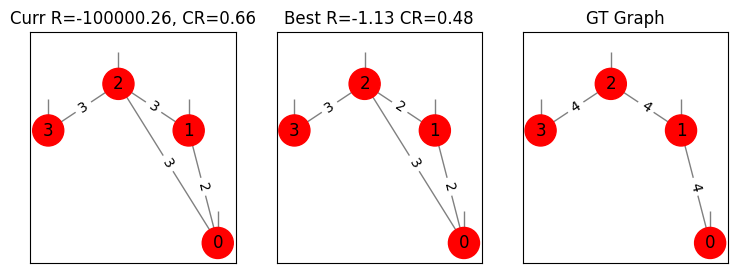

Problem 2, Agent ql:  20%|██        | 1/5 [00:57<03:50, 57.53s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


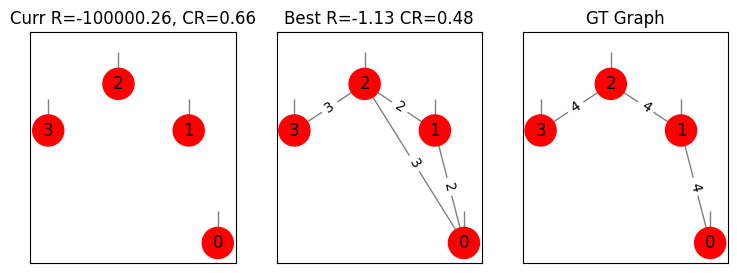

Action: addNode | Reward: -36.29904935584385 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


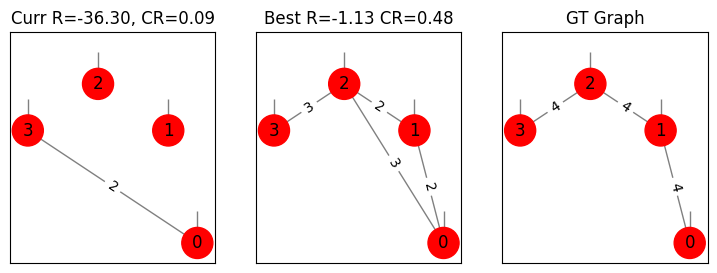

Action: increment:1:2 | Reward: -36.30003665432389 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


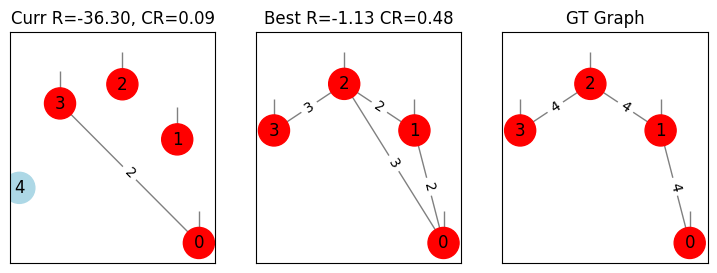

Action: increment:2:3 | Reward: -30.393270213194874 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


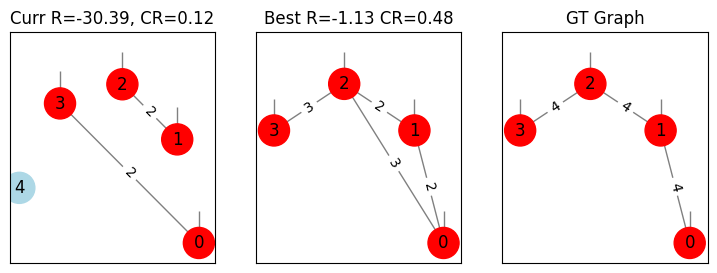

Action: increment:2:3 | Reward: -19.473537730250058 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


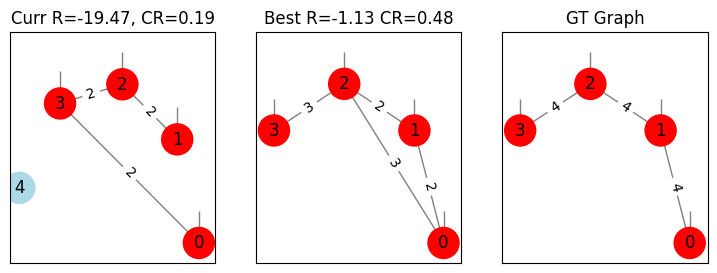

Action: increment:0:4 | Reward: -16.55709214783846 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


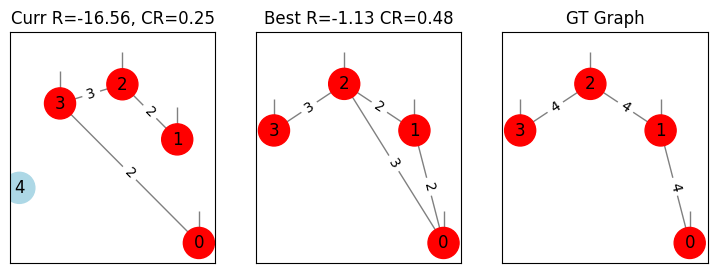

Action: increment:0:3 | Reward: -16.55791110990277 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


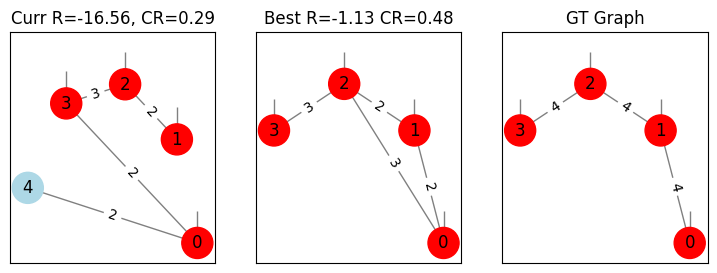

Action: increment:2:4 | Reward: -16.077551090969358 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


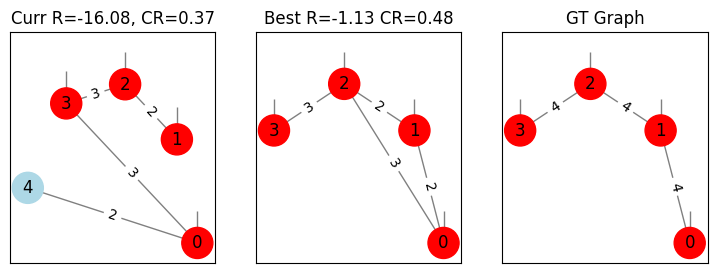

Action: increment:2:3 | Reward: -12.926630809849495 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


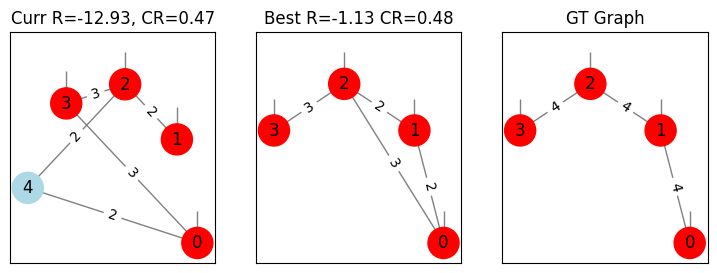

Action: increment:3:4 | Reward: -12.781035236268199 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


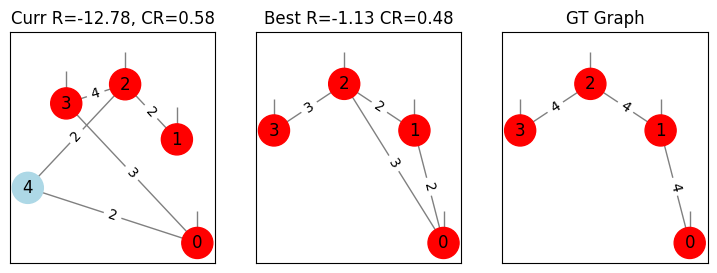

[Terminated] Action: increment:0:4 | Reward: -100012.78948228461 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


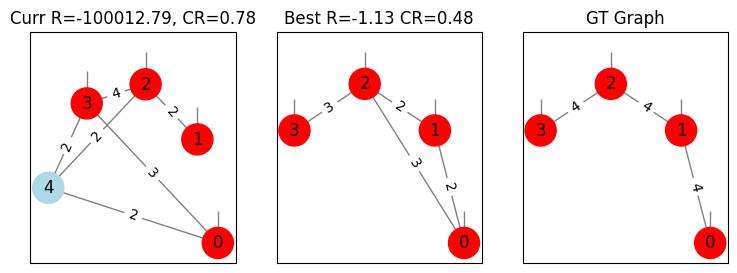

Problem 2, Agent ql:  40%|████      | 2/5 [02:34<04:01, 80.66s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


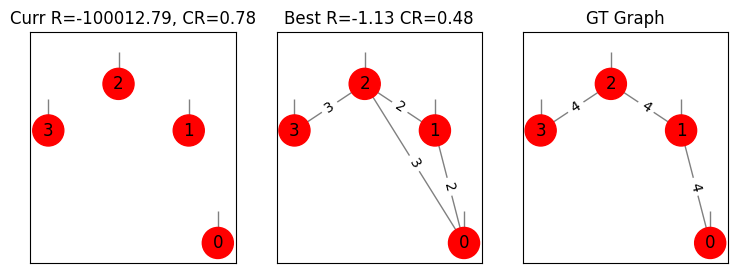

Action: addNode | Reward: -36.29904935584385 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


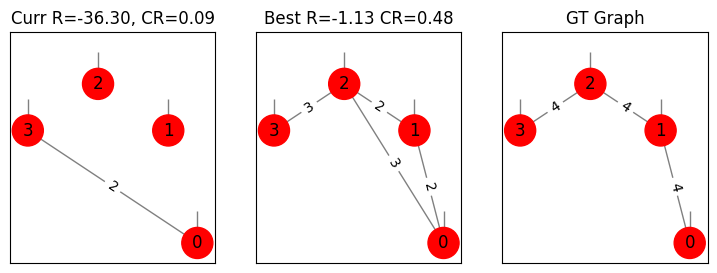

Action: increment:1:2 | Reward: -36.30003665432389 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


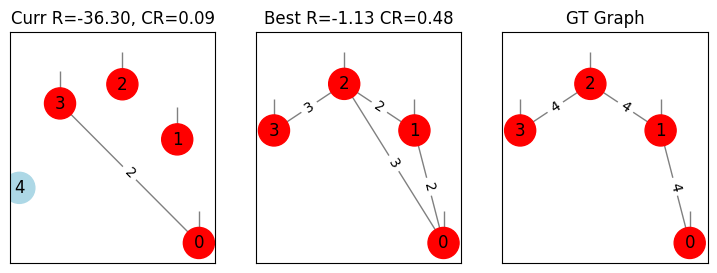

Action: increment:0:4 | Reward: -30.393270213194874 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


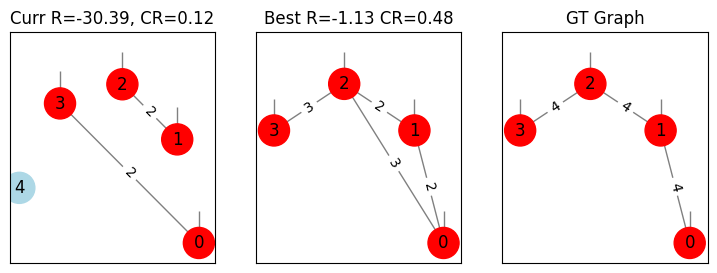

Action: increment:2:3 | Reward: -30.39567746261782 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


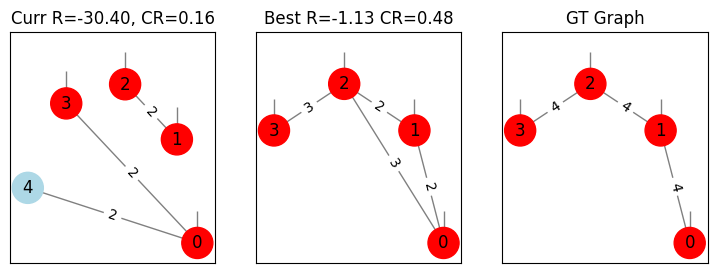

Action: increment:0:3 | Reward: -19.473683570777506 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


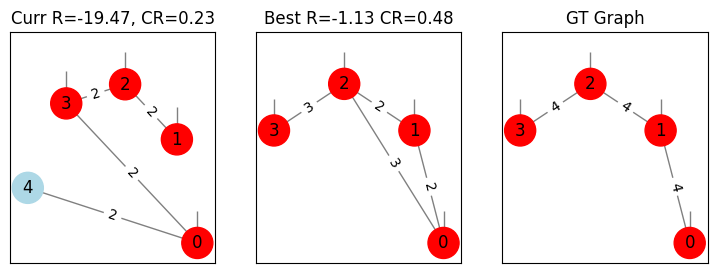

Action: increment:0:1 | Reward: -19.28320284038356 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


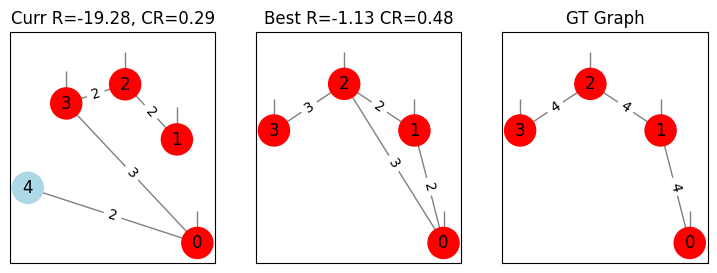

Action: increment:0:2 | Reward: -10.665631910261682 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


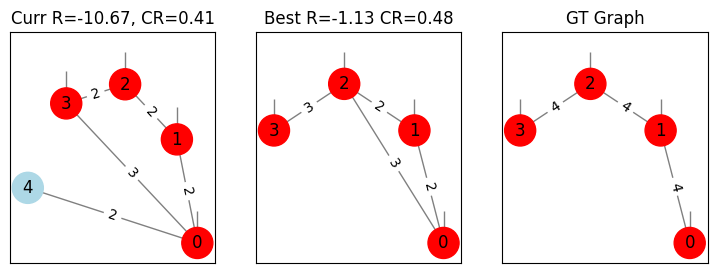

[Terminated] Action: increment:0:4 | Reward: -100003.511811261 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


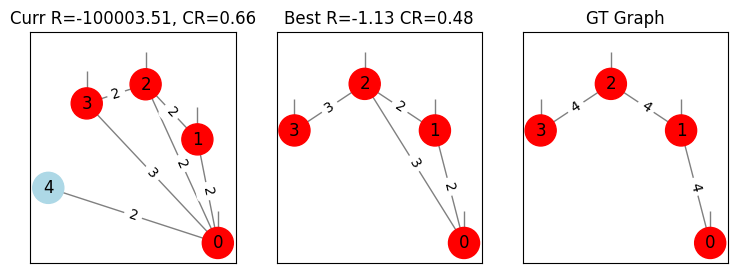

Problem 2, Agent ql:  60%|██████    | 3/5 [03:30<02:18, 69.26s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


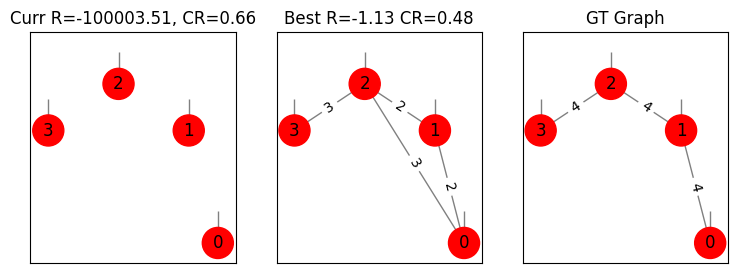

Action: increment:0:2 | Reward: -36.408820028280076 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


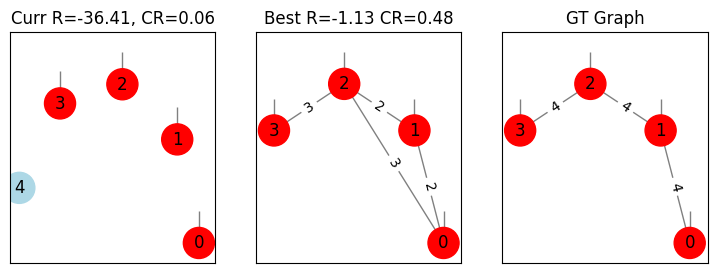

Action: increment:0:4 | Reward: -35.86537789096823 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


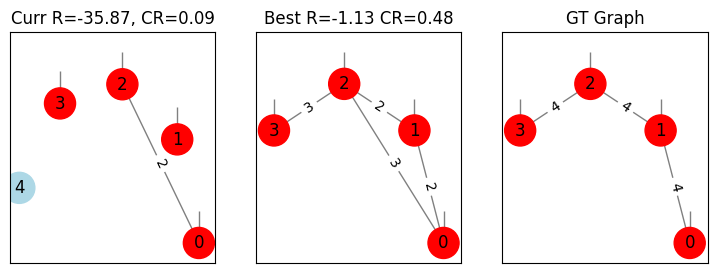

Action: increment:0:3 | Reward: -35.86502639187025 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


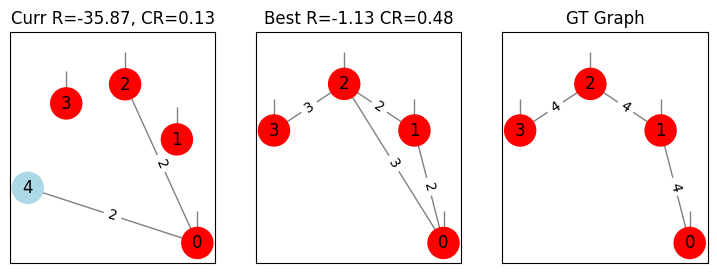

Action: increment:0:4 | Reward: -34.40353945702727 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


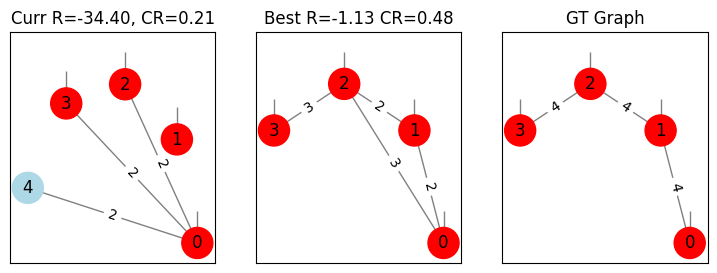

Action: increment:2:4 | Reward: -34.403457103650474 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


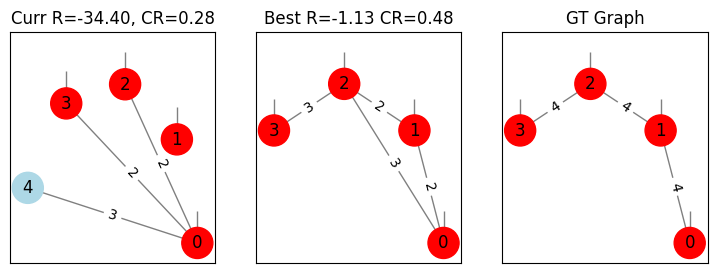

Action: increment:3:4 | Reward: -33.56407308214024 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


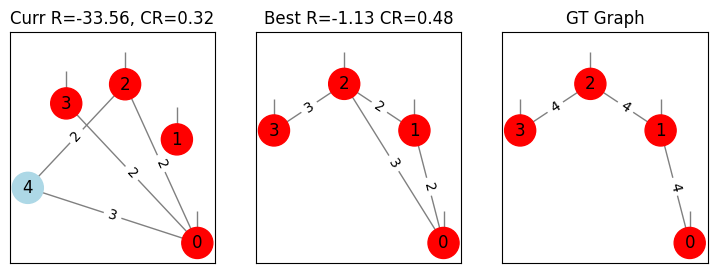

Action: increment:1:3 | Reward: -32.750500031252486 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


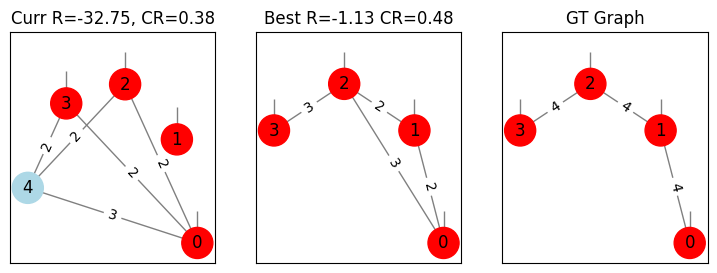

Action: increment:3:4 | Reward: -14.027638990569134 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


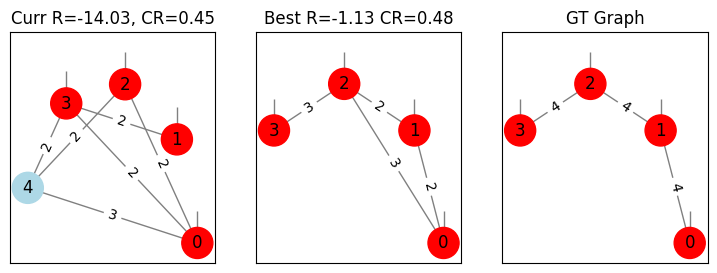

Action: increment:1:4 | Reward: -12.905630675751699 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


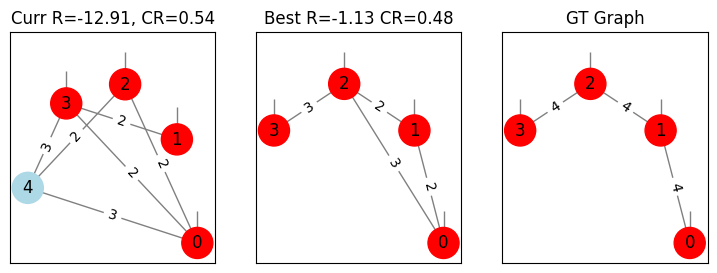

[Terminated] Action: increment:2:3 | Reward: -100001.87415033215 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


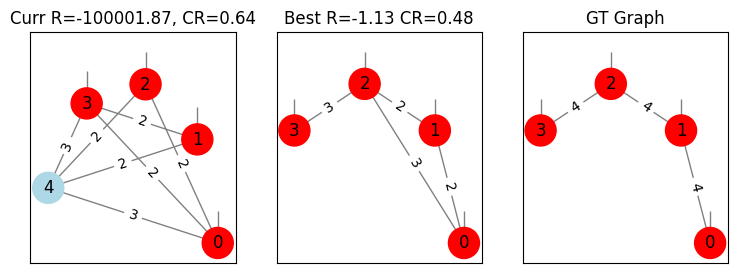

Problem 2, Agent ql:  80%|████████  | 4/5 [05:21<01:25, 85.85s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


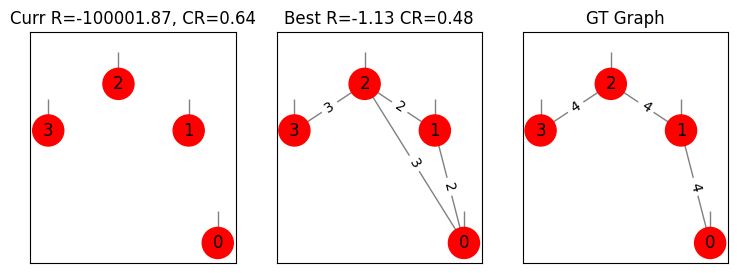

Action: increment:0:2 | Reward: -36.408820028280076 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:1:2', 'increment:1:3', 'increment:2:3'] | Compression constraint 0.625


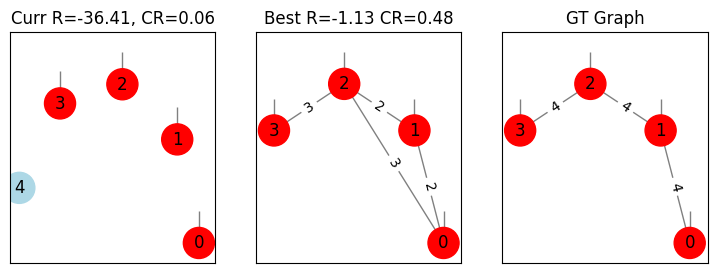

Action: increment:0:4 | Reward: -35.86537789096823 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


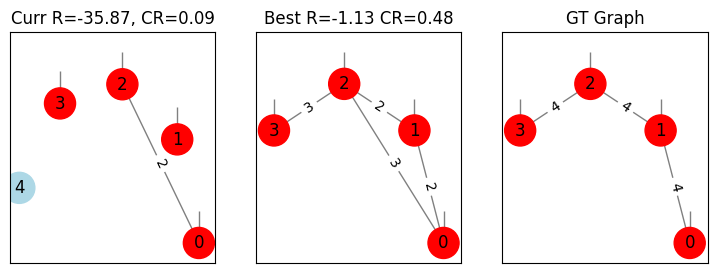

Action: increment:3:4 | Reward: -35.86502639187025 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


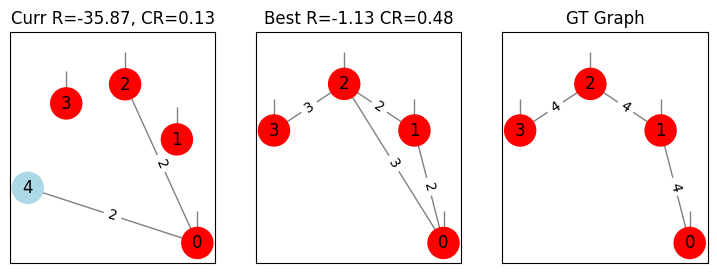

Action: increment:0:2 | Reward: -34.40230711147064 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


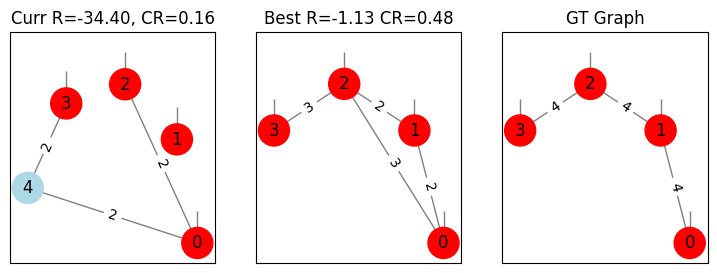

Action: increment:0:4 | Reward: -33.73387604483472 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


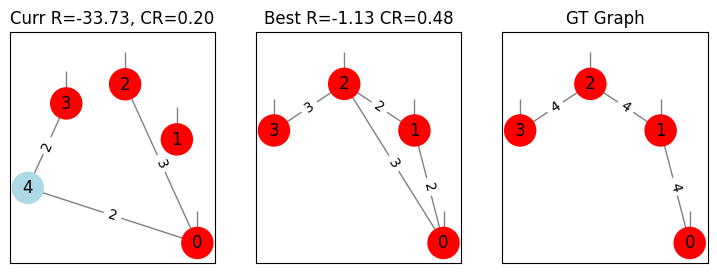

Action: addNode | Reward: -33.73192207914121 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


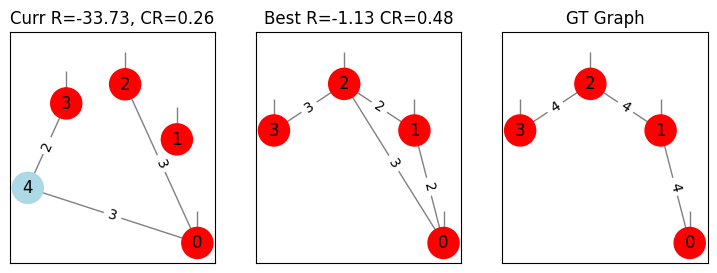

Action: increment:2:4 | Reward: -33.73326009139541 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:2:3', 'increment:2:4', 'increment:3:4'] | Compression constraint 0.625


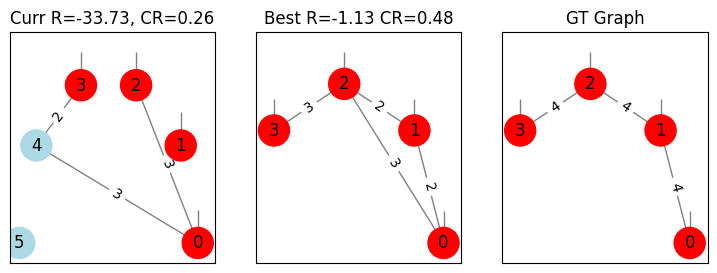

Action: increment:2:3 | Reward: -33.56442171409503 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


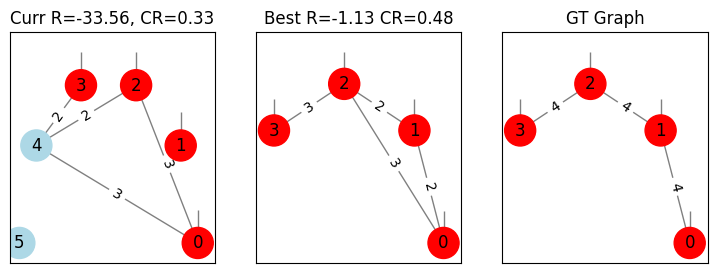

Action: increment:1:3 | Reward: -32.74783888386084 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


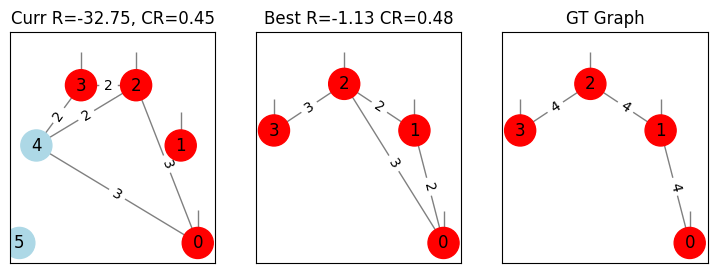

[Terminated] Action: increment:0:4 | Reward: -14.0289664915962 | Feasible: ['increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.625


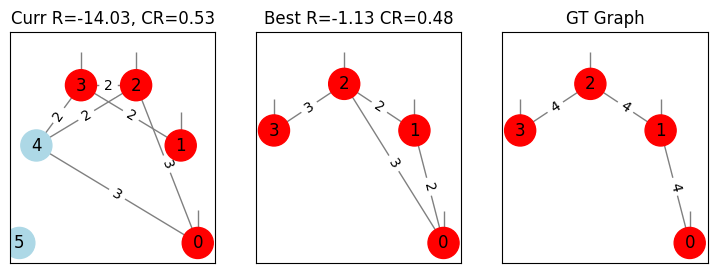

Problem 2, Agent ql: 100%|██████████| 5/5 [06:48<00:00, 81.79s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 3, Agent dqn:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


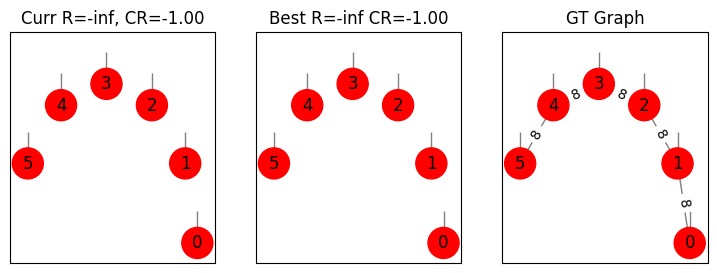

[Terminated] Action: increment:3:4 | Reward: -26245.19331578497 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


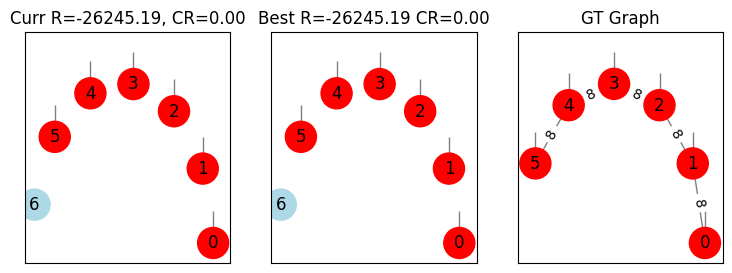

Problem 3, Agent dqn:  20%|██        | 1/5 [00:10<00:43, 10.96s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


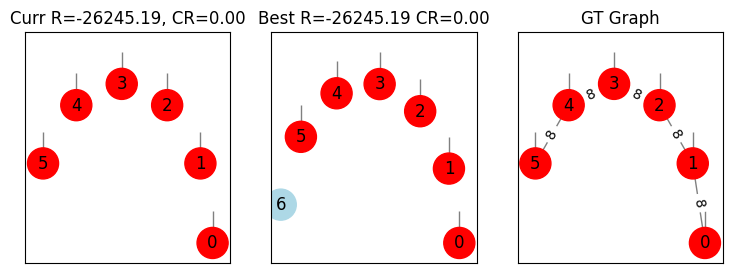

[Terminated] Action: addNode | Reward: -26245.19331578497 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


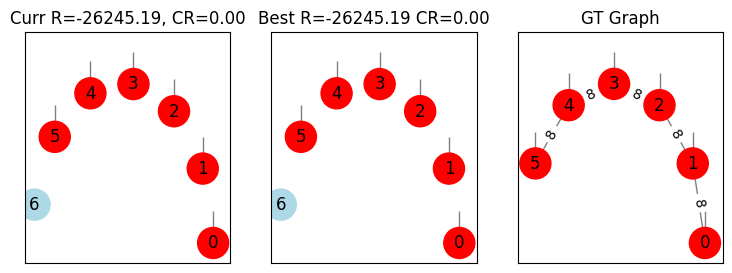

Problem 3, Agent dqn:  40%|████      | 2/5 [00:12<00:16,  5.54s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


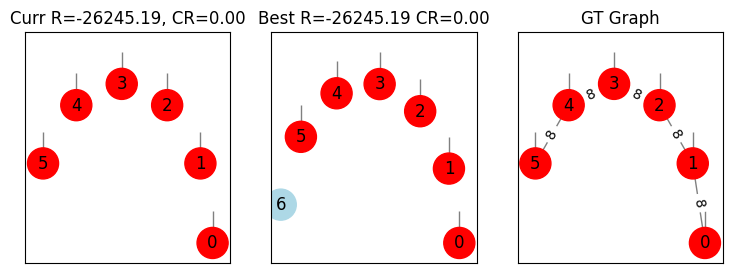

[Terminated] Action: addNode | Reward: -26245.19331578497 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


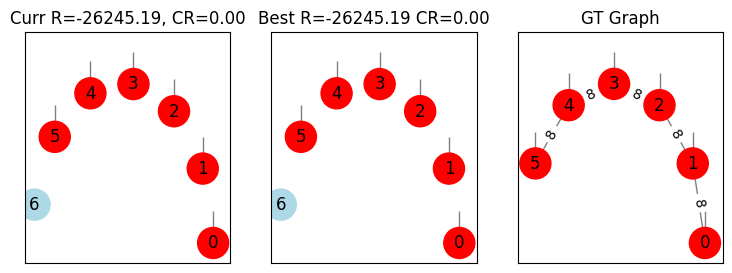

Problem 3, Agent dqn:  60%|██████    | 3/5 [00:14<00:07,  3.88s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


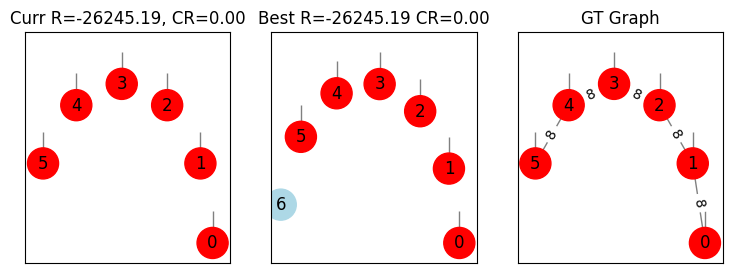

[Terminated] Action: addNode | Reward: -25896.099039883647 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


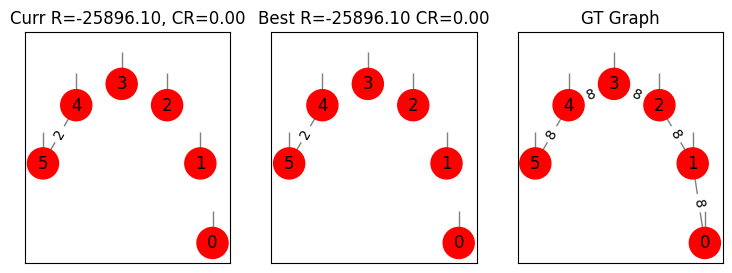

Problem 3, Agent dqn:  80%|████████  | 4/5 [00:24<00:06,  6.44s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


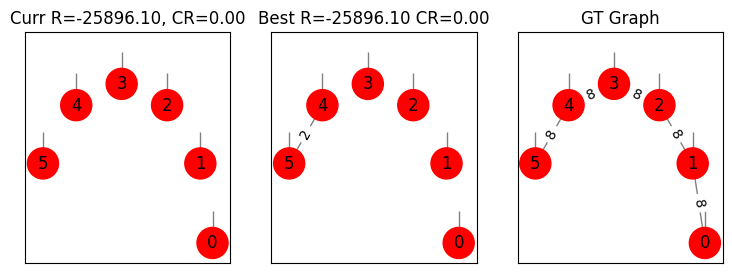

[Terminated] Action: addNode | Reward: -26245.19331578497 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


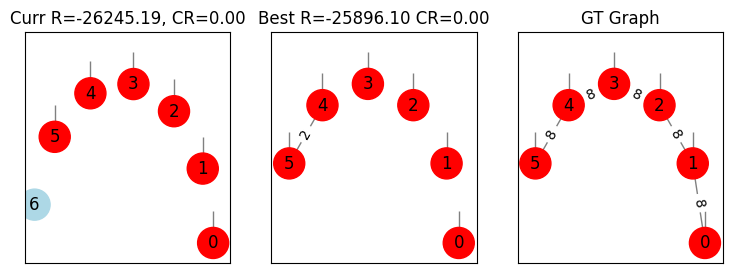

Problem 3, Agent dqn: 100%|██████████| 5/5 [00:26<00:00,  5.32s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 3, Agent sarsa:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


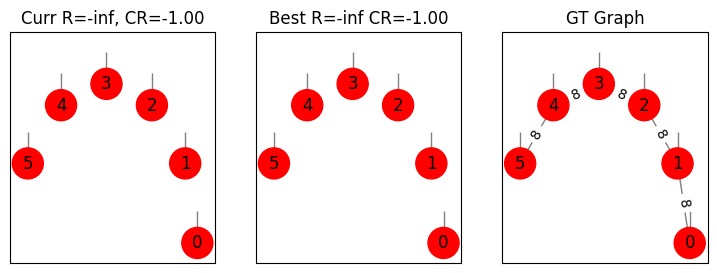

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

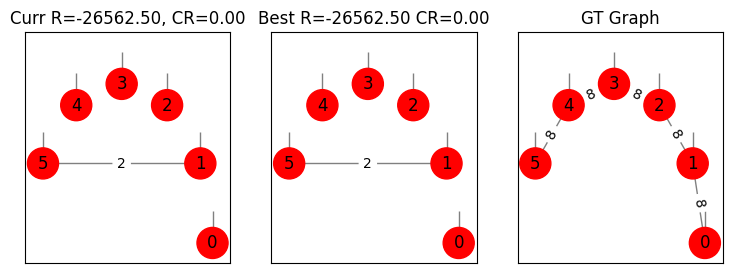

Problem 3, Agent sarsa:  20%|██        | 1/5 [00:13<00:52, 13.21s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


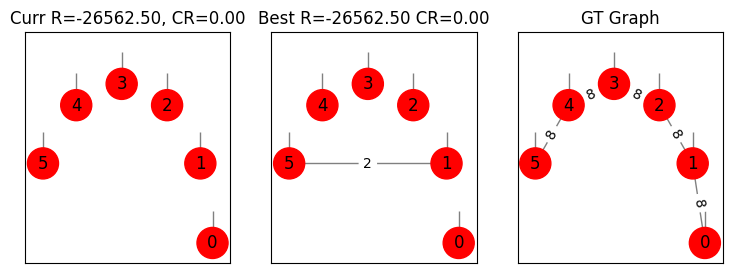

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

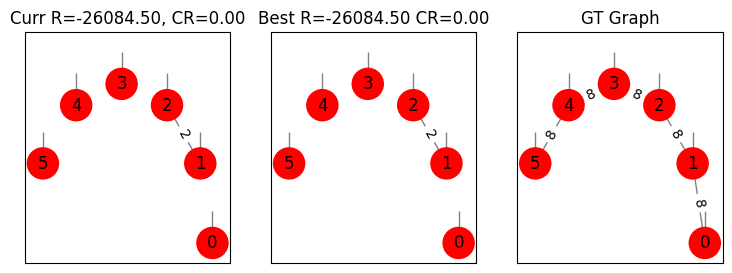

Problem 3, Agent sarsa:  40%|████      | 2/5 [00:32<00:50, 16.90s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


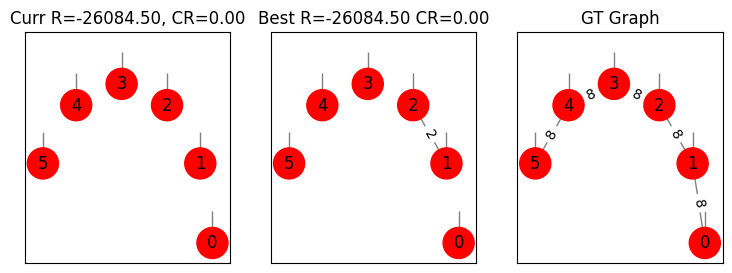

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

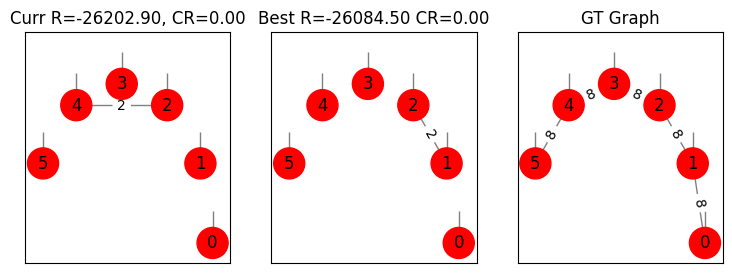

Problem 3, Agent sarsa:  60%|██████    | 3/5 [00:46<00:31, 15.65s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


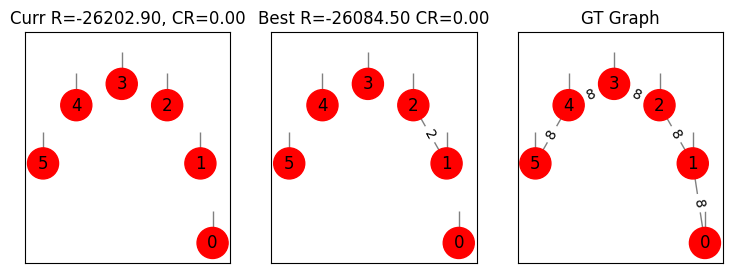

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

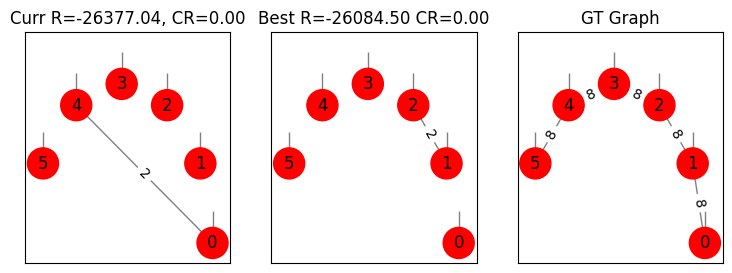

Problem 3, Agent sarsa:  80%|████████  | 4/5 [01:04<00:16, 16.59s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


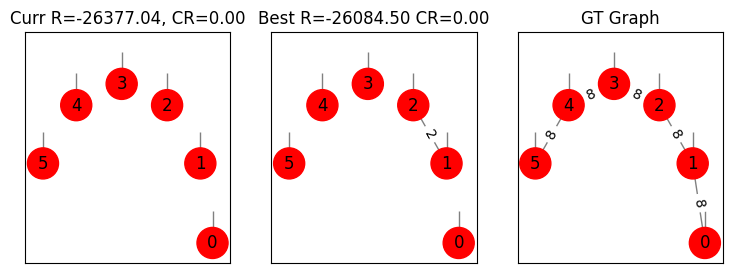

SARSA Agent q_vals:
[-12.001119919314078, -11.384809362268495, -5.980151603331952, -1003.0761207305164, -9004.058226252439, -4.055404896736806, -99.80858912302088, -899.1083139616246, -19000.0057810531, 0, -4.565737379309628, -0.001240166929528301, -10000.001344411385, 0, -10000.002987084787, 0, -8.105170209985634, -7.758577560680352, -3.2285358825599255, -3.0673132454452396, -1.6143693802077916, -1.6142985000388859, -1.6143660900523678, -0.1804371055318264, -10000.18033589621, 0, -3.9947018368966973, -10003.994670882636, 0, -4.546142052040271, -4.546254229033017, -2.2236273587472084, -2.223582125292734, -1.8701340875654795, -1.813253487661166, -10000.181380485352, 0, -1.5039735887468, -0.1111514691430362, -10000.000566842518, 0, -4.546066373402591, -4.416337766451986, -4.413058127528364, -4.416193689309877, -10001.813274508926, 0, -3.0422578912778415, -1.9665508176719642, -1.9665512856242409, -1.7843106130874427, -1.7843325410566326, -1.7458727194060106, -1.746114926839332, -1.1825735

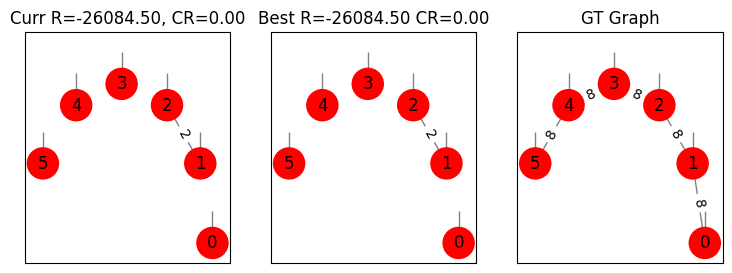

Problem 3, Agent sarsa: 100%|██████████| 5/5 [01:06<00:00, 13.33s/it]


----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


Problem 3, Agent ql:   0%|          | 0/5 [00:00<?, ?it/s]

Episode: 1/5
Initial State:


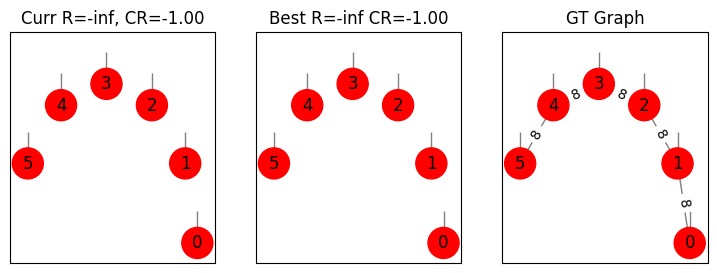

[Terminated] Action: increment:0:4 | Reward: -26192.142463845215 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


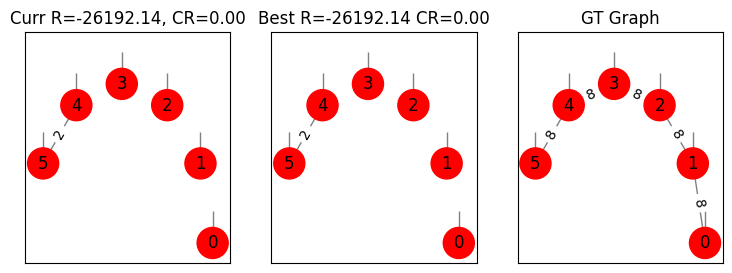

Problem 3, Agent ql:  20%|██        | 1/5 [00:12<00:49, 12.47s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 2/5
Initial State:


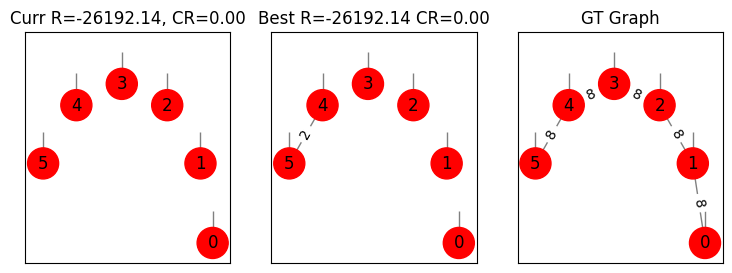

[Terminated] Action: increment:0:2 | Reward: -26369.09600486382 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


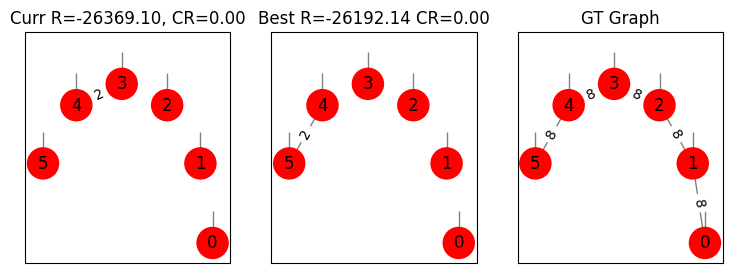

Problem 3, Agent ql:  40%|████      | 2/5 [00:28<00:43, 14.53s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 3/5
Initial State:


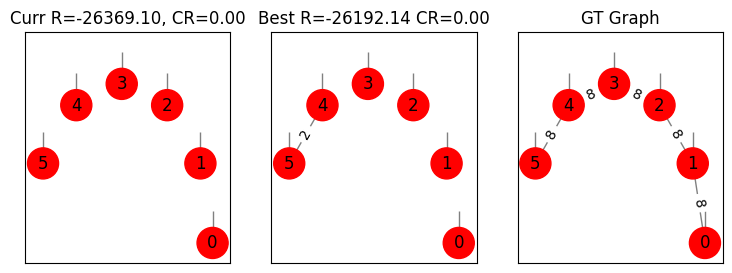

[Terminated] Action: increment:2:4 | Reward: -26219.62595750046 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


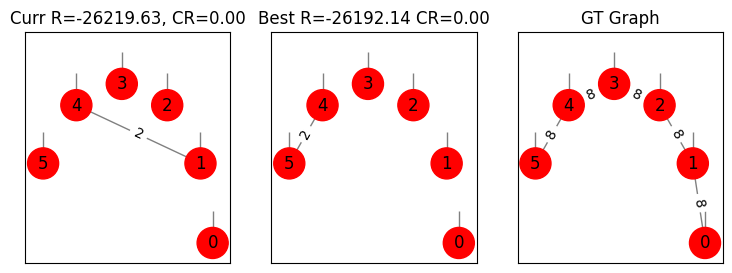

Problem 3, Agent ql:  60%|██████    | 3/5 [00:45<00:31, 15.70s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 4/5
Initial State:


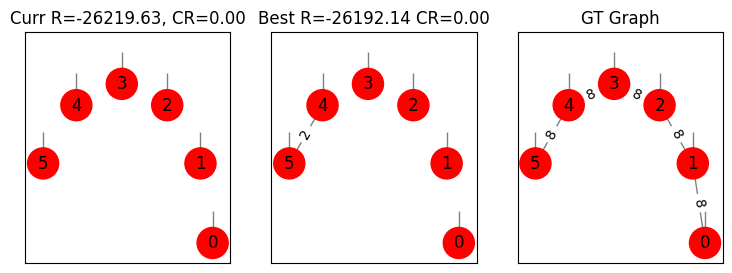

[Terminated] Action: increment:4:5 | Reward: -25998.596497901228 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


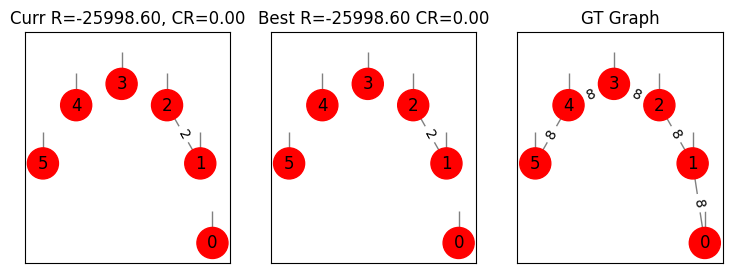

Problem 3, Agent ql:  80%|████████  | 4/5 [00:58<00:14, 14.64s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------
Episode: 5/5
Initial State:


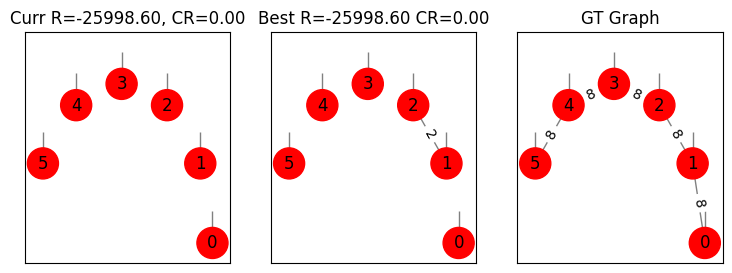

[Terminated] Action: increment:0:4 | Reward: -26570.675419666757 | Feasible: ['addNode', 'increment:0:1', 'increment:0:2', 'increment:0:3', 'increment:0:4', 'increment:0:5', 'increment:1:2', 'increment:1:3', 'increment:1:4', 'increment:1:5', 'increment:2:3', 'increment:2:4', 'increment:2:5', 'increment:3:4', 'increment:3:5', 'increment:4:5'] | Compression constraint 0.03497942386831276


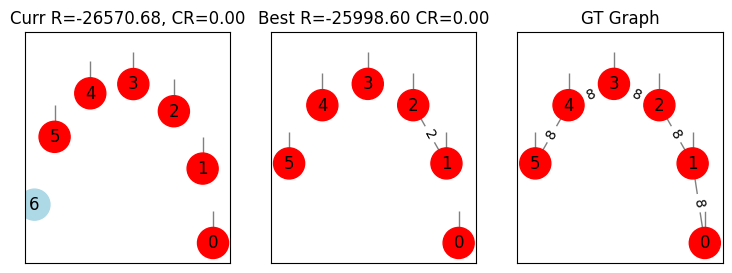

Problem 3, Agent ql: 100%|██████████| 5/5 [01:10<00:00, 14.19s/it]

----------------------------------------------------------------------------------------------------END OF EPISODE----------------------------------------------------------------------------------------------------


In [57]:
import matplotlib.pyplot as plt
from tqdm import tqdm

num_episodes = 3
epsilon = 0.2
discount = 0.999
num_episodes = 5
step_size = 0.1

# Define agents (DQN needs the `get_feasible_actions`)
target_tensor, gt_graph, gt_free_dimensions, gt_compression = get_problems()[0]
env_dqn_copy = Environment(
        target_tensor, gt_graph=gt_graph, gt_free_dimensions=gt_free_dimensions, max_episode_length=10
      )
state_embedding_dim = 32
agent_dqn = DQNAgent(
    state_encoder=StateEncoder(embedding_dim=state_embedding_dim),
    action_encoder=ActionEncoder(),
    input_dimension=state_embedding_dim + 3,
    get_fesible_actions=env_dqn_copy.get_feasible_actions,
    epsilon=epsilon,
    learning_starts_at=500,
    learning_frequency=10,
    learning_rate=.001,
    discount_factor=discount,
    buffer_size=1000,
    target_update_frequency=100,
    batch_size=128,
)

agent_sarsa = SarsaAgent(epsilon, step_size, discount)
agent_ql = QLearningAgent(epsilon, step_size, discount)

# Assuming agents is a dictionary of agent_name: agent_instance
agents = {
    "dqn": agent_dqn,
    "sarsa": agent_sarsa,  # Replace with actual agent instances
    "ql": agent_ql,
}


problems = get_problems()
best_rewards = {prob_idx: {agent_name: -float('inf') for agent_name in agents} for prob_idx in range(len(problems))}
best_compression = {prob_idx: {agent_name: float('inf') for agent_name in agents} for prob_idx in range(len(problems))}
for prob_idx, problem in enumerate(problems):
    target_tensor, gt_graph, gt_free_dimensions, gt_compression = problem
    for agent_name, agent in agents.items():
        env = Environment(
            target_tensor,
            gt_graph=gt_graph,
            gt_free_dimensions=gt_free_dimensions,
            max_episode_length=10,
            compression_constraint=gt_compression
        )
        for j in tqdm(range(num_episodes), desc=f"Problem {prob_idx}, Agent {agent_name}"):
            print(f"Episode: {j+1}/{num_episodes}")
            states, actions, rewards = train_episode(agent, env)

        # Add best reward and compression found throughout
        best_rewards[prob_idx][agent_name] = env.best_reward
        best_compression[prob_idx][agent_name] = env.best_compression

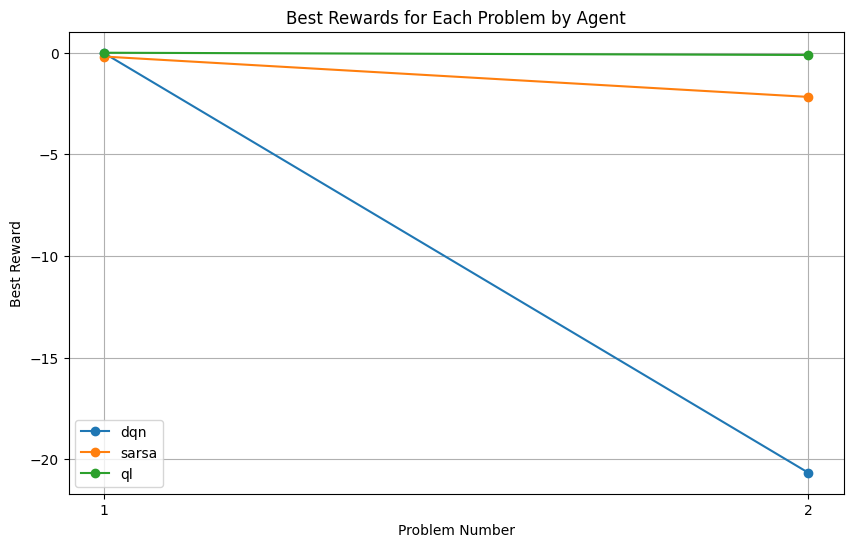

In [53]:
# Plot
# Problem indices
problem_indices = [1, 2]

# Create a figure for plotting
plt.figure(figsize=(10, 6))

# Loop through each agent and plot their best rewards for each problem
for agent_name in agents.keys():
    # Extract the best rewards for each problem for the current agent
    agent_rewards = [best_rewards[prob_idx][agent_name] for prob_idx in problem_indices]

    # Plotting
    plt.plot(problem_indices, agent_rewards, label=agent_name, marker='o')

# Setting plot features
plt.xlabel('Problem Number')
plt.ylabel('Best Reward')
plt.xticks(problem_indices)  # Set x-ticks to be the problem indices
plt.title('Best Rewards for Each Problem by Agent')
plt.legend()
plt.grid(True)
plt.show()